In [1]:
# juste modifié le nombre de simul de Vasicek, et aussi initié une variable

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf
import numba
from numba import njit, prange
import seaborn as sns
from scipy.interpolate import interp1d
import warnings 
warnings.filterwarnings('ignore')

In [3]:
pd.set_option('future.no_silent_downcasting', True)
np.random.seed(123)

In [4]:
file_path = 'case_study_data.xlsx'
specific_sheets = pd.read_excel(file_path, sheet_name=['Risky asset', 'ZC yields'])

risky_df = specific_sheets['Risky asset']
yields_df = specific_sheets['ZC yields']

In [5]:
SPY = yf.download('SPY')
SPY = SPY['Adj Close']
SPY = SPY['2002-06-21':'2014-10-30']

[*********************100%***********************]  1 of 1 completed


In [6]:
SPY_ret = SPY.pct_change().dropna()
SPY_mu = SPY_ret.mean()*252
SPY_std = SPY_ret.std()*np.sqrt(252)
SPY_sr = SPY_mu/SPY_std

## Cleaning

In [8]:
yields_df.columns = yields_df.iloc[0]
yields_df = yields_df[2:]
yields_df.set_index('Maturity (years)', inplace=True)
yields_df.index = pd.to_datetime(yields_df.index)
yields_df.index.name = 'Effective date'

In [9]:
risky_df = risky_df.iloc[1:]
risky_df.set_index('Prices', inplace=True)
risky_df.index = pd.to_datetime(risky_df.index)
risky_df.index.name = 'Date'
risky_df.columns = ['Price']

In [10]:
# Ensure maturities are a float array
maturities = yields_df.columns.astype(float)

# Reshape maturities to be broadcasted correctly across rows of yields_df
maturities = maturities.values.reshape(-1, 1)  # Reshape to (n_columns, 1)

# Calculate bond prices for zero-coupon bonds: P(t, T) = 1 / (1 + r)^T
prices_array = 1 / ((1 + yields_df.values) ** maturities.T)  # T is transposed to match the shape of yields_df

# Convert to a DataFrame with the same structure as yields_df
prices_df = pd.DataFrame(prices_array, columns=yields_df.columns, index=yields_df.index)

# Optional: Rename columns to indicate they are prices
prices_df.columns = [f"Price_{col}" for col in prices_df.columns]

# Output the bond prices DataFrame
prices_df

,Price_0.0,Price_1.0,Price_2.0,Price_3.0,Price_4.0,Price_5.0,Price_6.0,Price_7.0,Price_8.0,Price_9.0,...,Price_21.0,Price_22.0,Price_23.0,Price_24.0,Price_25.0,Price_26.0,Price_27.0,Price_28.0,Price_29.0,Price_30.0
Effective date,,,,,,,,,,,,,,,,,,,,,
2014-10-31,1.0,0.998477,0.989316,0.970959,0.947001,0.920399,0.892850,0.865184,0.837790,0.810831,...,0.533967,0.515051,0.496759,0.479079,0.461995,0.445500,0.429559,0.414183,0.399334,0.385018
2014-11-03,1.0,0.998372,0.989025,0.970400,0.946276,0.919652,0.892167,0.864621,0.837351,0.810518,...,0.534555,0.515689,0.497446,0.479815,0.462791,0.446332,0.430448,0.415106,0.400300,0.386015
2014-11-04,1.0,0.998563,0.989066,0.970411,0.946380,0.919910,0.892608,0.865250,0.838170,0.811523,...,0.537253,0.518482,0.500330,0.482773,0.465797,0.449403,0.433569,0.418272,0.403508,0.389249
2014-11-05,1.0,0.998446,0.988872,0.970201,0.946198,0.919743,0.892414,0.864977,0.837764,0.810960,...,0.535799,0.517089,0.499003,0.481527,0.464635,0.448339,0.432583,0.417387,0.402715,0.388548
2014-11-06,1.0,0.998321,0.988473,0.969400,0.945008,0.918216,0.890598,0.862892,0.835440,0.808390,...,0.531568,0.512813,0.494691,0.477187,0.460285,0.443976,0.428224,0.413027,0.398370,0.384225
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-28,1.0,0.959048,0.922818,0.887713,0.852972,0.818557,0.784603,0.751264,0.718679,0.686951,...,0.387922,0.369682,0.352348,0.335868,0.320214,0.305355,0.291240,0.277846,0.265130,0.253056
2024-10-29,1.0,0.959156,0.923027,0.887956,0.853192,0.818722,0.784693,0.751269,0.718602,0.686796,...,0.387767,0.369588,0.352317,0.335914,0.320336,0.305545,0.291511,0.278188,0.265542,0.253543
2024-10-30,1.0,0.958993,0.922212,0.886772,0.851891,0.817461,0.783568,0.750346,0.717912,0.686376,...,0.390227,0.372194,0.355046,0.338738,0.323250,0.308528,0.294550,0.281272,0.268658,0.256680


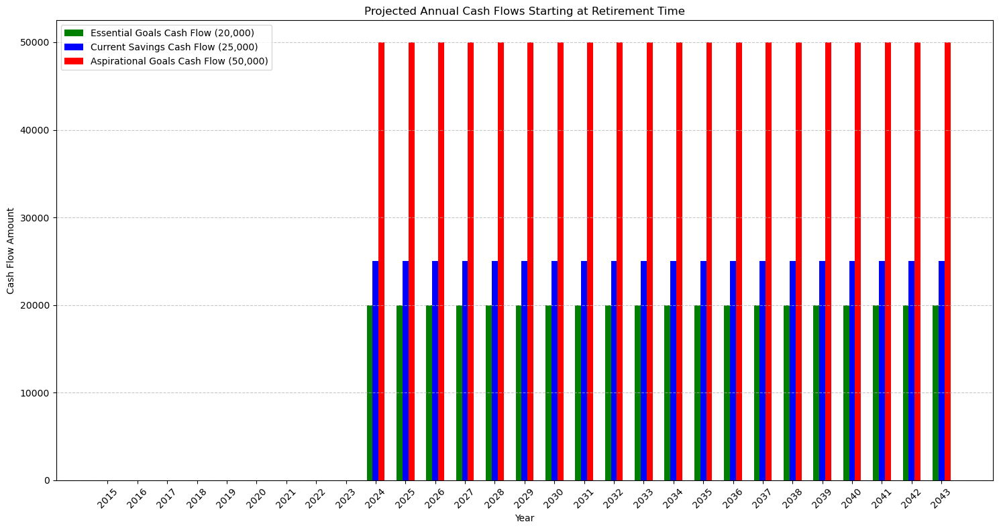

In [11]:
# Set the starting and ending date for the plot
start_date = pd.to_datetime('2014-10-31')
end_date = pd.to_datetime('2043-11-01')
dates = pd.date_range(start=start_date, end=end_date, freq='YS')  # 'YS' for year start

# Ensure we have exactly 20 years (60 bars: 20 years × 3 cash flow types)
if len(dates) > 20:
    dates = dates[:30]
elif len(dates) < 20:
    dates = pd.date_range(start=start_date, periods=20, freq='YS')

# Cash flow amounts
cash_flow_savings = 25000
cash_flow_essential = 20000
cash_flow_aspirational = 50000

# Initialize cash flows array for each type
cash_flows_savings = np.zeros(len(dates))
cash_flows_essential = np.zeros(len(dates))
cash_flows_aspirational = np.zeros(len(dates))

# Assign cash flows starting from 2024
cash_flows_essential[dates.year >= 2024] = cash_flow_essential
cash_flows_savings[dates.year >= 2024] = cash_flow_savings
cash_flows_aspirational[dates.year >= 2024] = cash_flow_aspirational

# Plotting as side-by-side bars
plt.figure(figsize=(15, 8))

# Define the width of each bar
bar_width = 0.2  # Width of each individual bar

# Calculate the positions for each bar group
positions = np.arange(len(dates))  # Positions for the years

# Plot each cash flow type side by side
plt.bar(positions- bar_width, cash_flows_essential, width=bar_width, color='g', label='Essential Goals Cash Flow (20,000)')
plt.bar(positions, cash_flows_savings, width=bar_width, color='b', label='Current Savings Cash Flow (25,000)')
plt.bar(positions + bar_width, cash_flows_aspirational, width=bar_width, color='r', label='Aspirational Goals Cash Flow (50,000)')

# Formatting
plt.title('Projected Annual Cash Flows Starting at Retirement Time')
plt.xlabel('Year')
plt.ylabel('Cash Flow Amount')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)  # Add gridlines for better readability

# Set x-axis ticks and labels
plt.xticks(positions, [date.strftime('%Y') for date in dates], rotation=45)
plt.tight_layout()

# Show the plot
plt.legend()
plt.show()

## Simulations

#### S&P500

In [14]:
def identity(x):
    return x

def heston_simulate(rate: float, sharpe_ratio: float, initial_price: float,
                    kappa: float, lt_var: float, vol_var: float, initial_var: float, rho: float,
                    n_paths: int, time_step: float, n_periods: int,
                    rng: np.random.Generator,
                    transform=identity):
    """
    Simulate paths for price and volatility under the Heston model.
    Note that this function has a side effect because it changes the state of the random number generator.
    """
    
    logS = np.empty((n_periods + 1, n_paths))  # Pre-allocate log prices
    V = np.empty((n_periods + 1, n_paths))  # Pre-allocate variances
    
    logS[0, :] = np.log(initial_price)  # Initial log price
    V[0, :] = initial_var  # Initial variance
    
    loading2 = np.sqrt(1 - rho**2)
    
    for i in range(1, n_periods + 1):
        std_innov1 = rng.standard_normal(n_paths)  # Standard normal innovations
        std_innov2 = rng.standard_normal(n_paths)
        
        sigma = np.sqrt(np.maximum(V[i - 1, :], 0))  # Ensure non-negative volatility
        
        logS[i, :] = logS[i - 1, :] + (rate + sharpe_ratio * sigma - 0.5 * V[i - 1, :]) * time_step \
            + sigma * np.sqrt(time_step) * std_innov1
            
        V[i, :] = V[i - 1, :] + kappa * (lt_var - V[i - 1, :]) * time_step \
            + vol_var * sigma * np.sqrt(time_step) * (rho * std_innov1 + loading2 * std_innov2)
            
        V[i, :] = transform(np.maximum(V[i, :], 0))  # Ensure variance is non-negative
    
    S = np.exp(logS)  # Convert log prices back to prices
    
    return {'price': S, 'volatility': np.sqrt(V)}

In [15]:
rate = float(SPY_mu.iloc[0])
initial_price = risky_df.iloc[0].astype(int)
sharpe_ratio = float(SPY_sr.iloc[0])
kappa = 5.07
vol_var = .48
lt_var = float(SPY_std.iloc[0]**2)
initial_var = lt_var
rho = -.7670
n_paths = 100
time_step = 1 / 252
n_periods = len(risky_df)-1

rng = np.random.default_rng(seed=123)

SV = heston_simulate(rate, sharpe_ratio, initial_price,
                     kappa, lt_var, vol_var, initial_var, rho,
                     n_paths, time_step, n_periods,
                     rng)

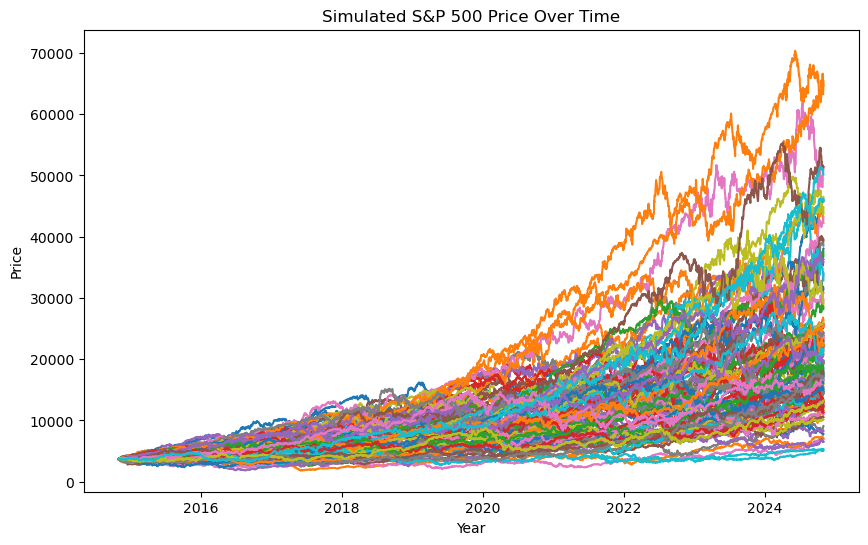

In [16]:
time= risky_df.index
plt.figure(figsize=(10, 6))
plt.plot(time, SV['price'])
plt.title("Simulated S&P 500 Price Over Time")
plt.xlabel("Year")
plt.ylabel("Price")
plt.show()

In [17]:
SV['price'][-1].mean()

22565.165678657737

In [18]:
simulated_risky_ret_daily_sp500 = pd.DataFrame(SV['price']).pct_change().dropna()
simulated_risky_ret_daily_sp500 = simulated_risky_ret_daily_sp500.set_index(risky_df[1:].index)
simulated_risky_ret_weekly = simulated_risky_ret_daily_sp500.resample('W').ffill().pct_change().dropna()
simulated_risky_ret_monthly = simulated_risky_ret_daily_sp500.resample('ME').ffill().pct_change().dropna()

In [19]:
simulated_risky_ret_daily_sp500

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Date,,,,,,,,,,,,,,,,,,,,,
2014-11-03,-0.011830,-0.003987,0.017217,0.003157,0.012469,0.008059,-0.007386,0.007608,-0.003339,-0.003412,...,0.016527,0.002607,0.006828,-0.001208,0.017576,-0.014758,-0.003174,-0.014148,0.011260,0.011569
2014-11-04,-0.011540,-0.010527,-0.004087,0.010557,0.020506,0.022492,0.011267,0.006736,-0.030276,0.016614,...,-0.010142,0.013519,0.006189,0.002011,-0.008221,0.013157,0.007181,-0.003984,0.007909,-0.010540
2014-11-05,0.013029,-0.010123,-0.006296,-0.003216,-0.001802,0.002979,0.013704,-0.017032,0.014771,-0.002039,...,-0.009090,-0.014877,0.021352,-0.005447,0.000196,-0.005892,0.002791,-0.013352,-0.006771,-0.010339
2014-11-06,-0.023994,0.013018,0.016577,0.023863,-0.000435,-0.005021,0.002484,-0.014399,-0.011323,0.009906,...,0.007677,0.003181,0.000467,0.006234,0.007382,0.020616,-0.010801,-0.000196,0.033040,-0.007296
2014-11-07,-0.002097,0.024858,-0.000971,0.016373,-0.020198,-0.001355,0.015125,0.012015,0.023566,-0.004304,...,0.013807,0.011172,-0.005579,-0.000736,0.004314,0.028970,0.011117,-0.000630,0.002848,0.006196
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-28,-0.004481,0.008934,-0.008559,0.002095,-0.006869,0.004454,-0.008508,0.006011,-0.002186,-0.000931,...,-0.003215,-0.000429,-0.030234,0.016653,0.003709,-0.005387,0.008023,-0.001226,0.003053,-0.004954
2024-10-29,0.001162,-0.002843,-0.009957,-0.004263,0.009565,0.006185,0.024096,-0.002101,-0.004527,0.006894,...,-0.004788,0.002425,0.005768,0.017643,-0.002250,0.000490,-0.005849,-0.011624,0.020826,0.002278
2024-10-30,0.000245,0.014979,0.019127,-0.001019,-0.007969,0.001591,-0.012121,-0.003724,-0.007440,-0.001890,...,-0.029121,-0.001267,0.035667,-0.014592,-0.018601,-0.004044,-0.001410,-0.015371,0.005343,-0.000320


In [20]:
# Get final values of each path (last column)
final_values = SV['price'][-1]  # Shape: (n_paths,)

# Compute the mean final value
mean_final_value = np.mean(final_values)

In [21]:
# Compute absolute differences between each path's final value and the mean final value
differences = np.abs(final_values - mean_final_value)

# Select the index of the path with the smallest difference
best_path_index = np.argmin(differences)

# Extract the best path
best_path = SV['price'].T[best_path_index]

In [22]:
simulated_risky_ret_daily_best_path = pd.DataFrame(best_path).pct_change().dropna()
simulated_risky_ret_daily_best_path = simulated_risky_ret_daily_sp500.set_index(risky_df[1:].index)
simulated_risky_ret_weekly_best_path = simulated_risky_ret_daily_sp500.resample('W').ffill().pct_change().dropna()
simulated_risky_ret_monthly_best_path = simulated_risky_ret_daily_sp500.resample('ME').ffill().pct_change().dropna()

#### PSP

In [24]:
value = pd.read_excel('case_study_data (4).xlsx', sheet_name='Value', skiprows=3, usecols="A:B")
value.rename(columns={'RI(USD)': 'Value'}, inplace=True)
mid_cap = pd.read_excel('case_study_data (4).xlsx', sheet_name='Mid Cap', skiprows=3, usecols="A:B")
mid_cap.rename(columns={'RI(USD)': 'Mid_cap'}, inplace=True)
momentum = pd.read_excel('case_study_data (4).xlsx', sheet_name='Momentum', skiprows=3, usecols="A:B")
momentum.rename(columns={'RI(USD)': 'Momentum'}, inplace=True)
low_vol = pd.read_excel('case_study_data (4).xlsx', sheet_name='Low Volatility ', skiprows=3, usecols="A:B")
low_vol.rename(columns={'RI(USD)': 'Low Vol'}, inplace=True)
low_investment = pd.read_excel('case_study_data (4).xlsx', sheet_name='Low Investment', skiprows=3, usecols="A:B")
low_investment.rename(columns={'RI(USD)': 'Low Investment'}, inplace=True)
high_profitability = pd.read_excel('case_study_data (4).xlsx', sheet_name='High Profitability', skiprows=3, usecols="A:B")
high_profitability.rename(columns={'RI(USD)': 'High Profitability'}, inplace=True)

In [25]:
six_factors = value.merge(mid_cap, on='date')\
                    .merge(momentum, on='date')\
                    .merge(low_vol, on='date')\
                    .merge(low_investment, on='date')\
                    .merge(high_profitability, on='date')

six_factors.set_index('date', inplace=True)
daily_returns = six_factors.pct_change().dropna()
daily_returns_in_sample = daily_returns.loc["2002-06-21":"2014-10-30"]

In [26]:
factor_mu = {}
factor_sigma = {}
factor_var = {}
factor_sr = {}

for factor in ['Value', 'Mid_cap', 'Momentum', 'Low Vol', 'Low Investment', 'High Profitability']:
    factor_mu[factor] = np.mean(daily_returns_in_sample[factor]) * 252
    factor_sigma[factor] = np.std(daily_returns_in_sample[factor]) * np.sqrt(252)
    factor_var[factor] = factor_sigma[factor] **2 
    factor_sr[factor] = factor_mu[factor]/factor_sigma[factor]

In [27]:
# We take here the exact same parameters for the following:
initial_price =  risky_df.iloc[0].astype(int)
kappa = 5.07
vol_var = 0.48
rho = -0.7670
n_paths = 100
time_step = 1 / 252
n_periods = len(risky_df)-1

In [28]:
SV_factors = {}
for factor in ['Value', 'Mid_cap', 'Momentum', 'Low Vol', 'Low Investment', 'High Profitability']:
    sigma_ann = factor_sigma[factor] 
    mu_ann = factor_mu[factor]  
    sr_ann = factor_sr[factor] 
    var_ann = factor_var[factor]
    rng = np.random.default_rng(seed=1000)
    
    SV_factors[factor] = heston_simulate(rate=mu_ann, 
                                         sharpe_ratio=sr_ann, 
                                         initial_price= initial_price,  
                                         kappa=kappa,
                                         lt_var=var_ann, 
                                         vol_var=vol_var,
                                         initial_var=var_ann,
                                         rho=rho,
                                         n_paths=n_paths,
                                         time_step=time_step,
                                         n_periods=n_periods,
                                         rng=rng)

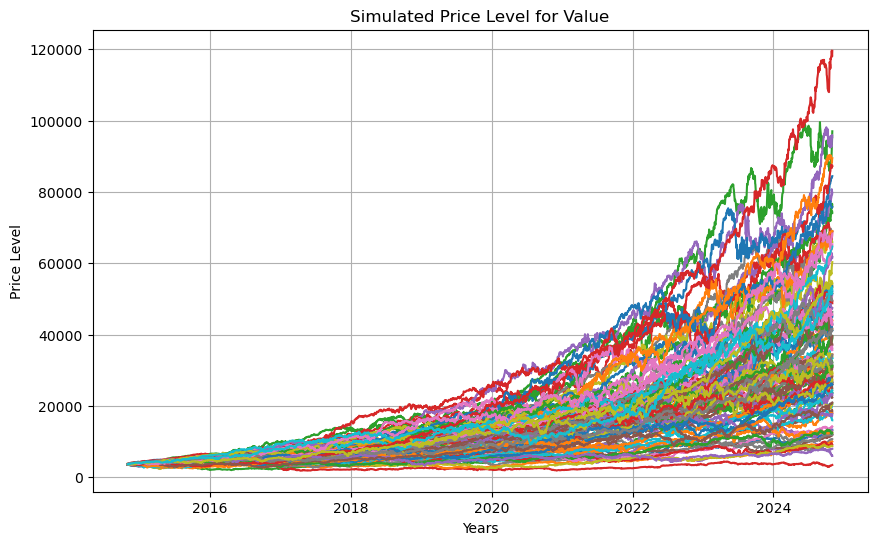

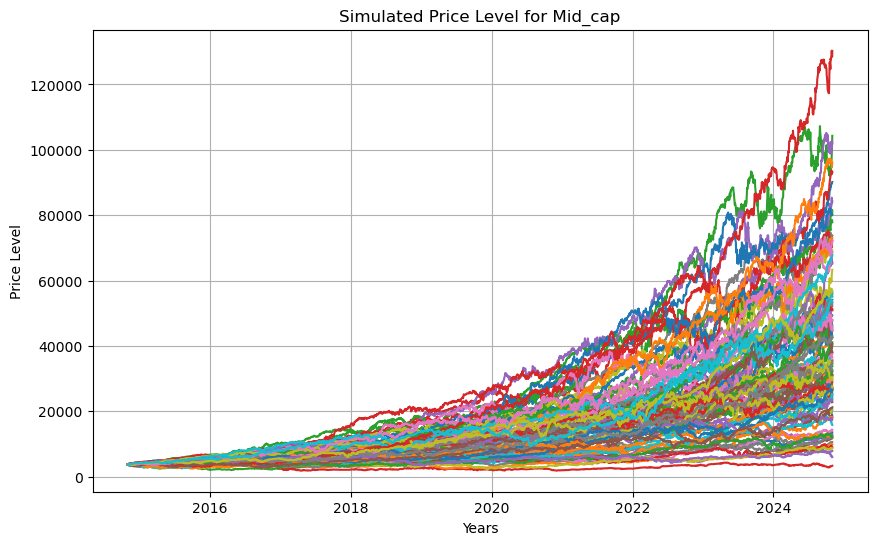

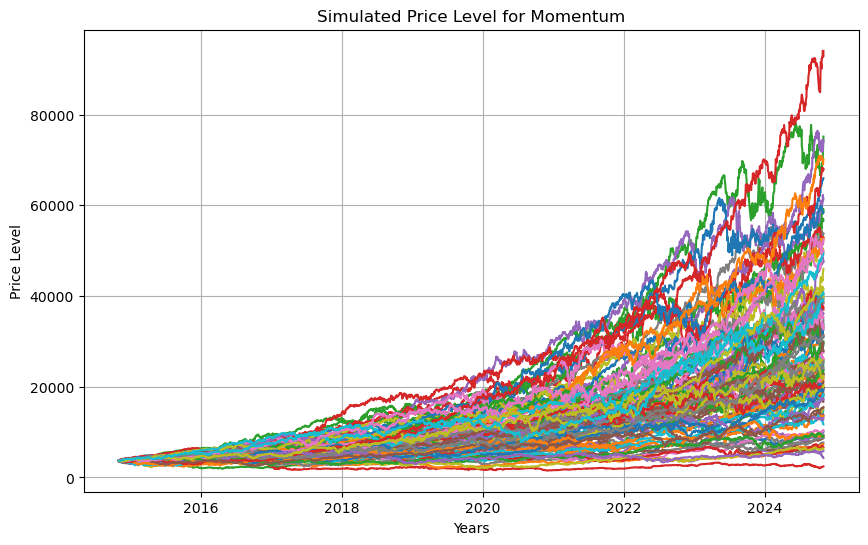

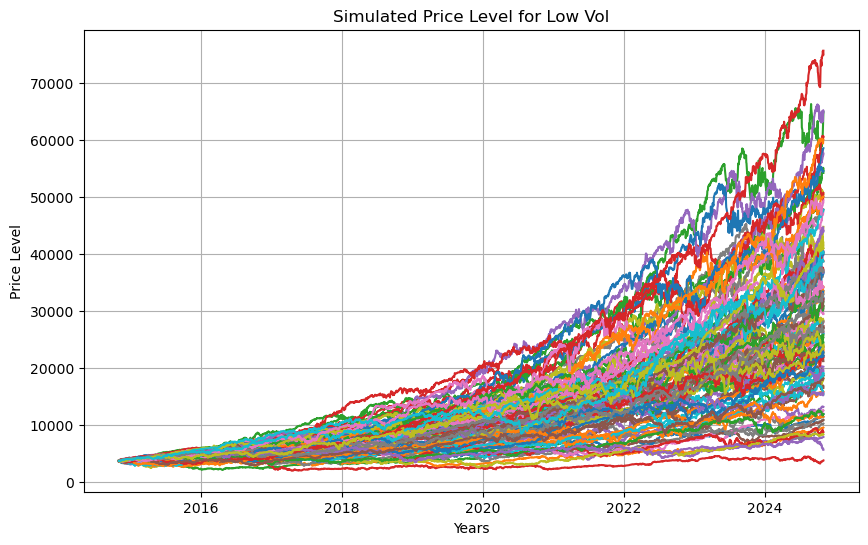

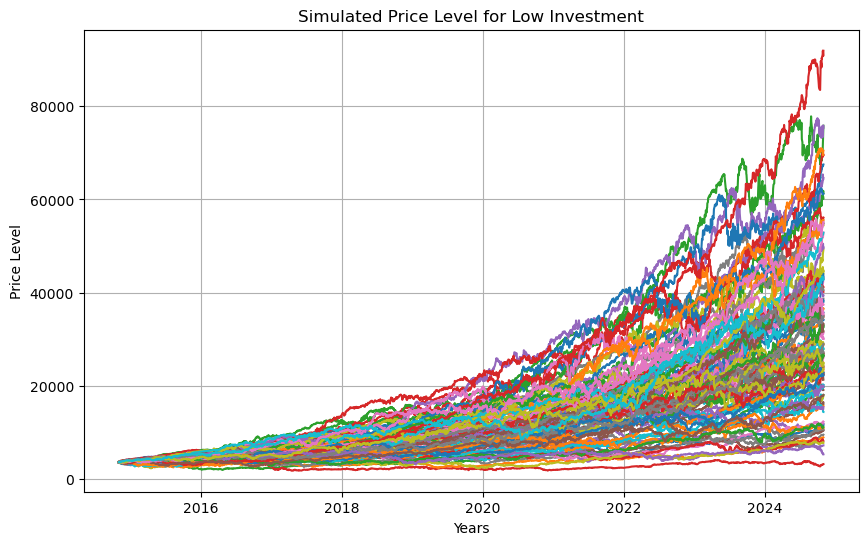

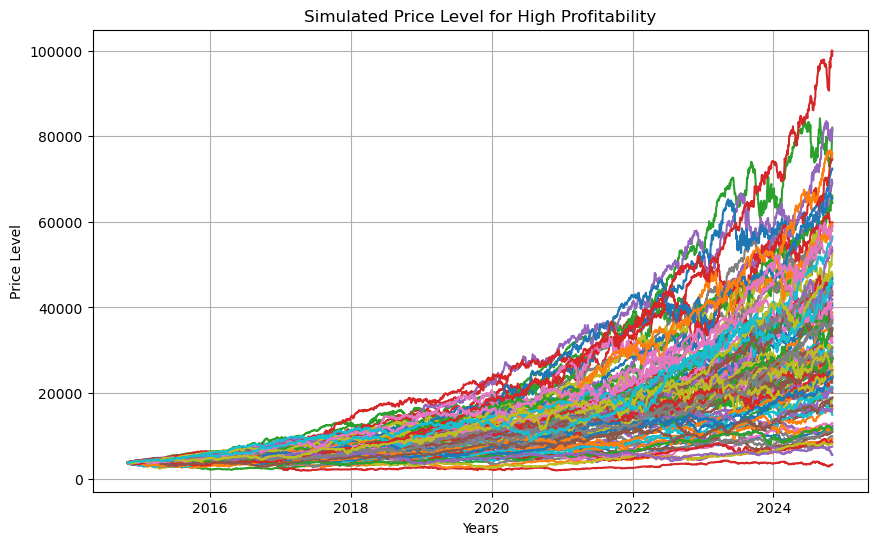

In [29]:
for factor in ['Value', 'Mid_cap', 'Momentum', 'Low Vol', 'Low Investment', 'High Profitability']:
    plt.figure(figsize=(10, 6))
    plt.plot(time, SV_factors[factor]['price'], label=f'{factor} Simulated Price')
    plt.title(f'Simulated Price Level for {factor}') 
    plt.xlabel('Years')
    plt.ylabel('Price Level')
    plt.grid(True)
    plt.show()

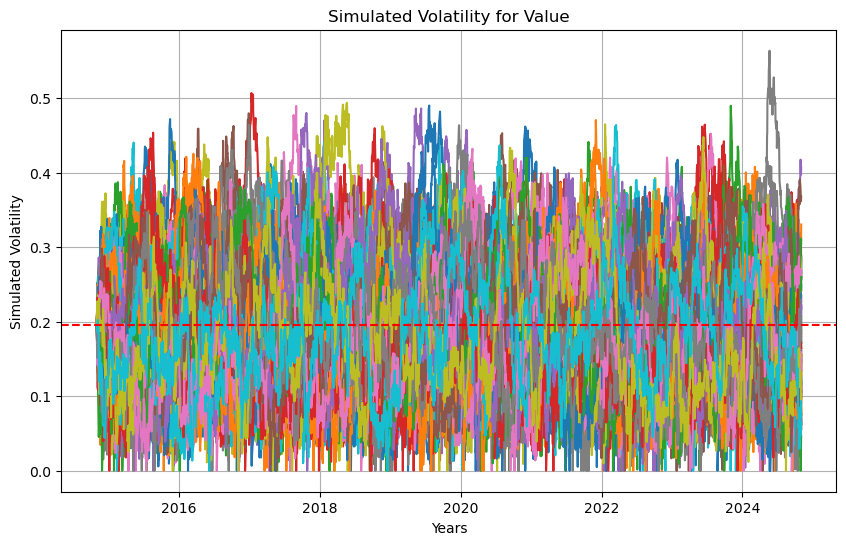

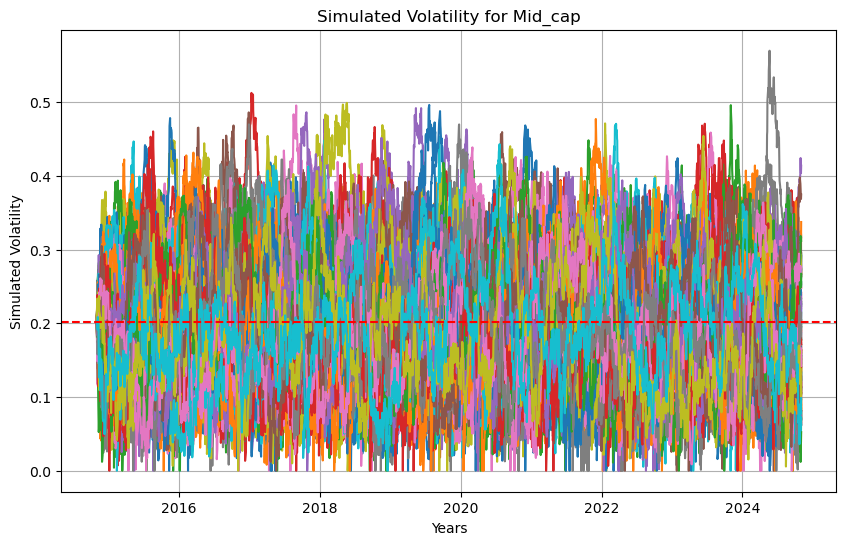

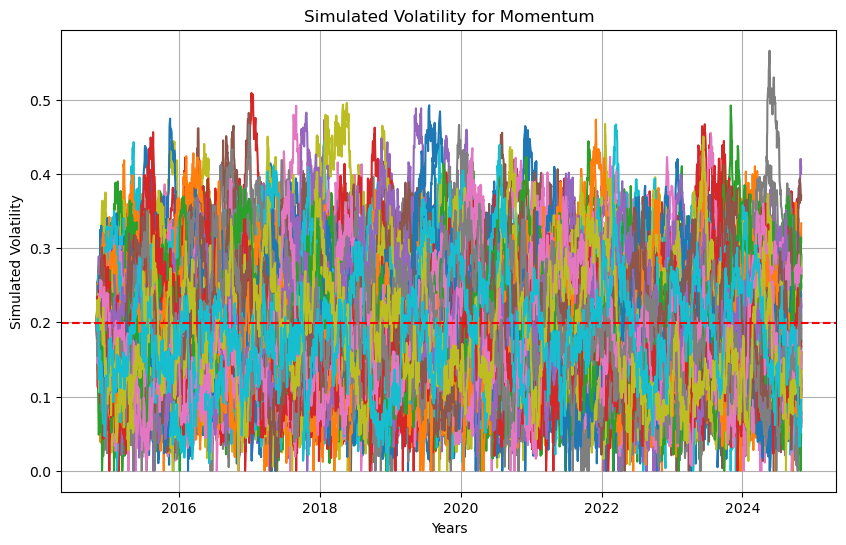

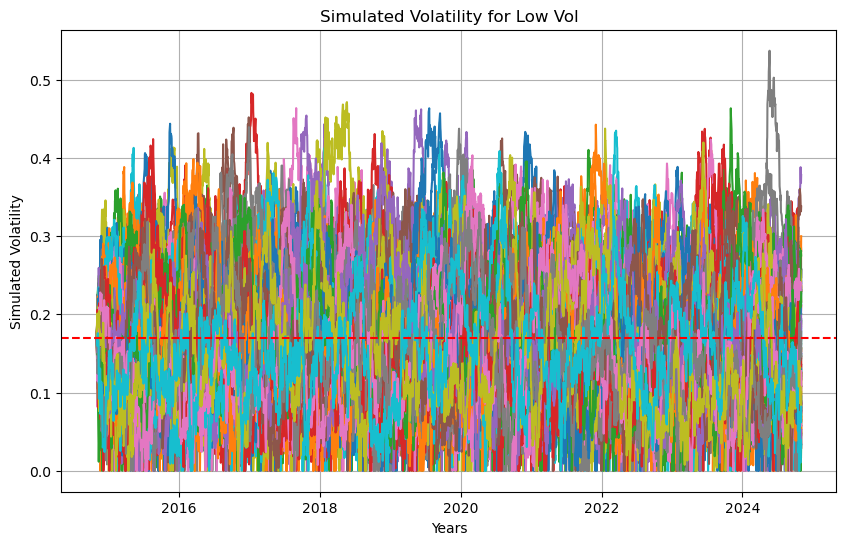

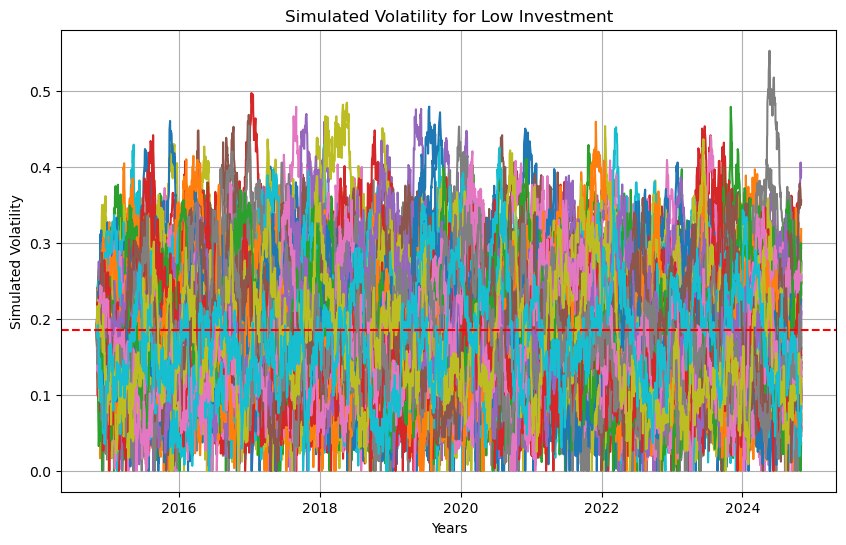

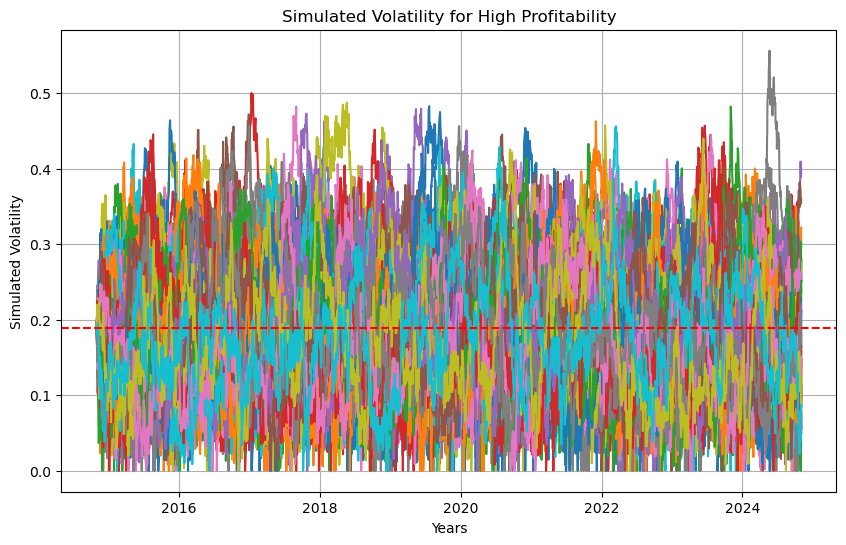

In [30]:
for factor in ['Value', 'Mid_cap', 'Momentum', 'Low Vol', 'Low Investment', 'High Profitability']:
    plt.figure(figsize=(10, 6))
    plt.plot(time, SV_factors[factor]['volatility'], label=f'{factor} Simulated Volatility')
    plt.title(f'Simulated Volatility for {factor}') 
    plt.axhline(y=factor_sigma[factor], color='r', linestyle='--', label='Mean Reversion Level') 
    plt.xlabel('Years')
    plt.ylabel('Simulated Volatility')
    plt.grid(True)
    plt.show()    

In [31]:
mean_paths = {}
for factor in ['Value', 'Mid_cap', 'Momentum', 'Low Vol', 'Low Investment', 'High Profitability']:
    mean_paths[factor] = np.mean(SV_factors[factor]['price'], axis=1) 

In [32]:
# taking the final value for each factor (comparison: final value of SP500 around 22K
final_values = {}

for factor in ['Value', 'Mid_cap', 'Momentum', 'Low Vol', 'Low Investment', 'High Profitability']:
    final_values[factor] = mean_paths[factor][-1]
    print(f"Final value for {factor}: {final_values[factor]:.2f}")

Final value for Value: 39304.78
Final value for Mid_cap: 40889.90
Final value for Momentum: 29854.01
Final value for Low Vol: 30338.12
Final value for Low Investment: 32551.75
Final value for High Profitability: 34568.31


In [33]:
# Creating the simulated_ret_daily for all 6 factors:
simulated_factor_ret_daily = {}
for factor in ['Value', 'Mid_cap', 'Momentum', 'Low Vol', 'Low Investment', 'High Profitability']:
    simulated_factor_ret_daily[factor] = pd.DataFrame(SV_factors[factor]['price']).pct_change().dropna()

In [34]:
# Weights of our fixed FRP:
weights = np.array([0.13672518, 0.13400082, 0.13663591, 0.25, 0.1426381 , 0.2])
simulated_weighted_factor_ret_daily = {}

for i, factor in enumerate(['Value', 'Mid_cap', 'Momentum', 'Low Vol', 'Low Investment', 'High Profitability']):
    simulated_weighted_factor_ret_daily[factor] = simulated_factor_ret_daily[factor].values * weights[i]

# so here we have a set a 6 x 2520x1000 array for our ptf with all factors decomposed
# these are all weighted -> representative of the ptf then

In [35]:
# To get daily returns of our ptf: loop through each factor & compute weighted returns
portfolio_returns_daily = np.zeros(simulated_factor_ret_daily['Value'].shape[0])

for i, factor in enumerate(['Value', 'Mid_cap', 'Momentum', 'Low Vol', 'Low Investment', 'High Profitability']):
    portfolio_returns_daily += simulated_factor_ret_daily[factor].values.mean(axis=1) * weights[i]

portfolio_returns_daily_df = pd.DataFrame(portfolio_returns_daily, columns=["Portfolio Returns"])
portfolio_returns_daily_df.head()

,Portfolio Returns
0,0.001948
1,0.001063
2,-0.000579
3,0.001243
4,0.000786


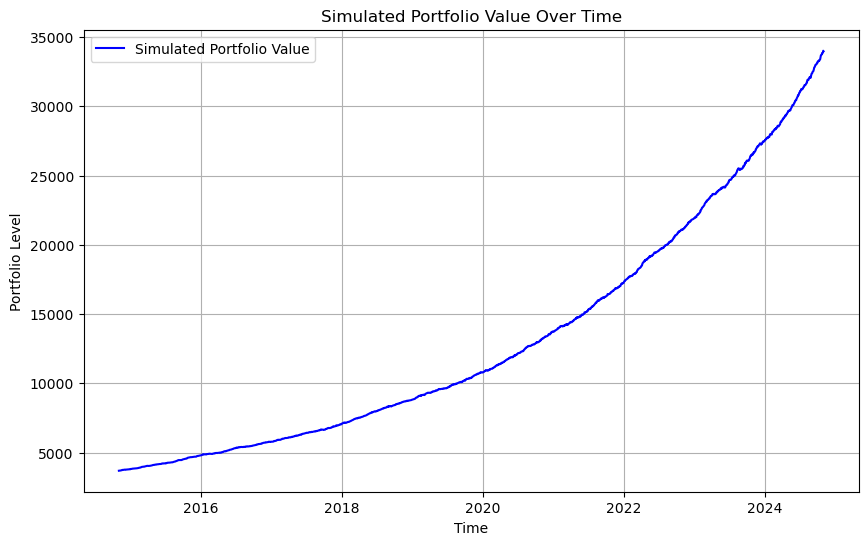

In [36]:
initial_value = 3679.99 
portfolio_value = initial_value * (1 + portfolio_returns_daily_df["Portfolio Returns"]).cumprod()

plt.figure(figsize=(10, 6))
plt.plot(time[:-1], portfolio_value, label='Simulated Portfolio Value', color='b')
plt.title('Simulated Portfolio Value Over Time')
plt.xlabel('Time')
plt.ylabel('Portfolio Level')
plt.legend()
plt.grid(True)
plt.show() # too smooth to be displayed

In [37]:
portfolio_value.iloc[-1] # ends at 33K here

33973.27058864159

In [38]:
# + if we want to display the representative path of it: 
# so here we plot the representative path of each factor first (final value closer to mean)
representative_paths = {}

for factor in ['Value', 'Mid_cap', 'Momentum', 'Low Vol', 'Low Investment', 'High Profitability']:
    last_avg_level = mean_paths[factor][-1]
    last_levels = SV_factors[factor]['price'][-1, :]
    differences = np.abs(last_levels - last_avg_level)
    closest_path_idx = np.argmin(differences)
    representative_paths[factor] = SV_factors[factor]['price'][:, closest_path_idx]

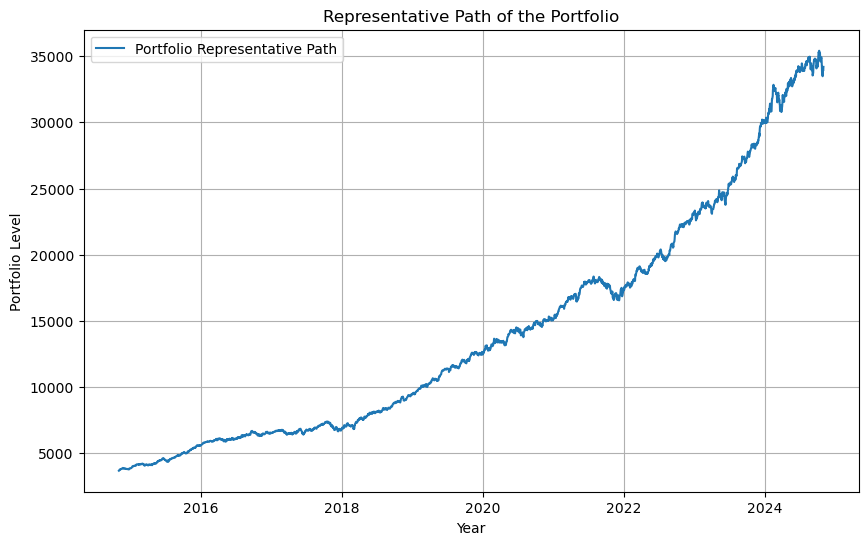

In [39]:
# Then we can get the representative path of our ptf by xing each rps path by its weight
portfolio_representative_path = np.zeros_like(representative_paths['Value'])
for i, factor in enumerate(['Value', 'Mid_cap', 'Momentum', 'Low Vol', 'Low Investment', 'High Profitability']):
    portfolio_representative_path += representative_paths[factor] * weights[i]

plt.figure(figsize=(10, 6))
plt.plot(time,portfolio_representative_path, label="Portfolio Representative Path")
plt.title("Representative Path of the Portfolio")
plt.xlabel("Year")
plt.ylabel("Portfolio Level")
plt.legend()
plt.grid(True)
plt.show()

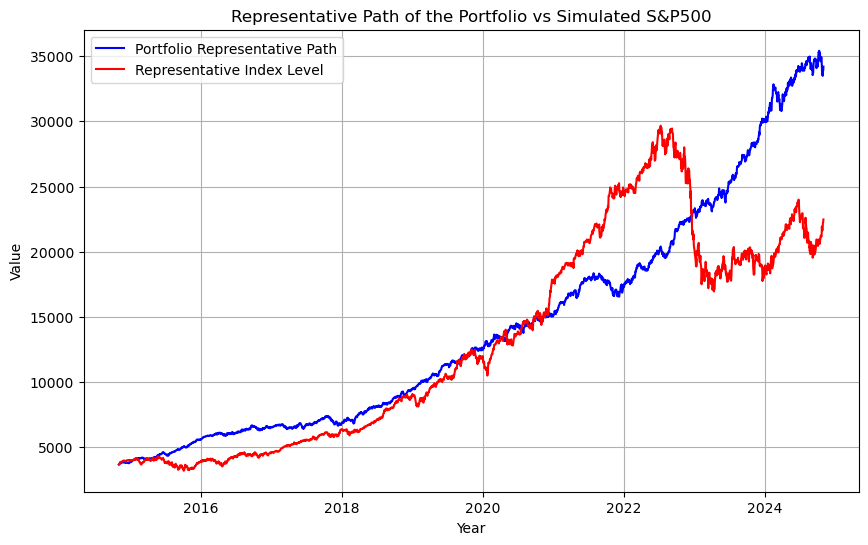

In [40]:
# Plotting one against another
plt.figure(figsize=(10, 6))
plt.plot(time, portfolio_representative_path, label="Portfolio Representative Path", color = "blue")
plt.plot(time, best_path, label='Representative Index Level', color = "red")
plt.title("Representative Path of the Portfolio vs Simulated S&P500")
plt.xlabel("Year")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show() # so big discrepancy : 33k vs 22k at the end

In [41]:
weighted_returns = []
for i, factor in enumerate(['Value', 'Mid_cap', 'Momentum', 'Low Vol', 'Low Investment', 'High Profitability']):
    weighted_returns.append(simulated_factor_ret_daily[factor].values * weights[i])

weighted_returns_array = np.array(weighted_returns)
portfolio_returns_daily = np.sum(weighted_returns_array, axis=0)
portfolio_returns_daily_df = pd.DataFrame(portfolio_returns_daily)
portfolio_returns_daily = portfolio_returns_daily_df.set_index(risky_df[1:].index)
simulated_risky_ret_daily = portfolio_returns_daily
simulated_risky_ret_daily # assigning it so that we do the simulations for the PSP only

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Date,,,,,,,,,,,,,,,,,,,,,
2014-11-03,-0.002919,-0.004855,0.020960,0.024474,0.002715,-0.013899,0.003249,0.001375,-0.009461,0.019143,...,0.000512,-0.024687,-0.006185,-0.018007,-0.006203,-0.001118,-0.004974,0.015930,-0.017499,-0.009728
2014-11-04,0.002630,0.006345,0.006748,-0.010063,-0.008150,-0.006580,0.025174,-0.009581,0.005824,0.001066,...,0.002795,0.002177,0.011888,-0.008510,0.007888,-0.016111,-0.025835,0.001211,-0.007788,0.005572
2014-11-05,0.005181,0.001375,0.019515,0.005644,-0.009302,-0.000424,0.007723,-0.000985,-0.019096,0.001048,...,-0.009485,-0.021125,-0.013132,0.005667,-0.000593,-0.017231,-0.002971,0.013098,0.012643,0.006377
2014-11-06,0.011135,0.016061,0.009138,-0.007362,0.011793,-0.002947,-0.004929,0.002624,0.004072,-0.006458,...,0.011340,0.020473,0.009721,-0.011351,0.011375,0.010822,0.007208,-0.011348,-0.005911,-0.017061
2014-11-07,-0.004431,-0.000286,-0.015185,-0.008782,-0.008041,-0.006621,0.002122,-0.009643,0.011318,-0.003552,...,0.000335,-0.000415,-0.001929,0.011636,-0.000462,-0.009610,-0.007014,-0.003662,0.002627,0.011162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-28,0.003061,0.000120,0.004535,0.000329,-0.022166,0.002407,-0.011155,-0.001262,-0.010302,-0.000775,...,-0.002187,0.000098,0.004064,0.006686,0.004566,-0.005132,0.004854,-0.012153,-0.006154,-0.002847
2024-10-29,-0.002638,-0.001309,-0.000483,-0.002701,-0.036406,0.000929,-0.013527,0.002116,0.032041,0.005663,...,-0.007470,0.003594,-0.016788,0.008998,0.003803,-0.002353,0.013942,0.006319,0.005351,0.007889
2024-10-30,-0.001450,0.007268,0.001083,0.002252,0.007173,0.006704,0.000097,-0.002523,0.007524,-0.001477,...,-0.005085,0.000622,0.017328,-0.008322,0.005481,0.005715,-0.002528,-0.009391,-0.014345,0.001573


#### Factor Investing

### LHP

In [44]:
# Vasicek parameters
lambda_r = 0.53
kappa = 0.13  # Mean reversion speed (a)
sigma = 0.0098  # Volatility
theta = 0.0302 + ((lambda_r * sigma) / kappa)  # Long-term mean interest rate (b)

# Load yield data (Assuming 'yields_df' is given with dates as index and maturities as columns)
yields_df = yields_df.sort_index()  # Ensure sorted by date
yields_df_sim = yields_df.iloc[:, 1:]  # Exclude the first column (assuming it's a non-numeric index)

# Extract dates and maturities
dates = yields_df_sim.index
maturities = yields_df_sim.columns.astype(float)  # Convert maturities to numeric
n_days = len(yields_df_sim)  # Number of days in simulation
n_simulations = 100  # Number of Monte Carlo simulations
n_maturities = len(maturities)  # Number of maturities

# Extract initial yield curve
initial_yield_curve = yields_df_sim.iloc[0].values  # Extract full term structure
initial_short_rate = initial_yield_curve[0]  # Use the shortest-maturity yield as r_0

# Precompute constants for Vasicek bond price formula
B_T = (1 - np.exp(-kappa * maturities)) / kappa
A_T = np.exp((theta - (sigma ** 2 / (2 * kappa ** 2))) * (B_T - maturities) - (sigma ** 2 / (4 * kappa)) * B_T ** 2)
#A_T = (theta - (sigma ** 2 / (2 * kappa ** 2))) * (B_T - maturities) + (sigma ** 2 / (4 * kappa)) * B_T ** 2

# Vectorized time differences (dt)
dt = dates.to_series().diff().dt.days.fillna(1) / 252  # Convert days to year fractions, replace NaN with 1 day
dt = dt.to_numpy()  # Convert to NumPy array

# Vectorized random shock generation for the entire simulation
random_shocks = np.random.normal(size=(n_simulations, n_days - 1))  # One shock per day

# Initialize arrays to store rates
r_t_all = np.full((n_simulations, n_days), initial_short_rate)

# **Vectorized Vasicek Evolution**
for i in range(1, n_days):
    Z = random_shocks[:, i - 1]  # Use precomputed random shocks
    r_t_all[:, i] = (
        r_t_all[:, i - 1] + kappa * (theta - r_t_all[:, i - 1]) * dt[i]
        + sigma * np.sqrt(dt[i]) * Z
    )
    r_t_all[:, i] = np.maximum(r_t_all[:, i], 0)  # Ensure non-negative rates

# Reshape A_T and B_T for proper broadcasting with r_t_all
A_T_reshaped = np.expand_dims(A_T, axis=(0, 1))  # Shape: (1, 1, n_maturities)
B_T_reshaped = np.expand_dims(B_T, axis=(0, 1))  # Shape: (1, 1, n_maturities)

# Compute bond prices
P_t_T_all = A_T_reshaped * np.exp(-B_T_reshaped * r_t_all[:, :, np.newaxis])
#P_t_T_all = np.exp(-A_T_reshaped - B_T_reshaped * r_t_all[:, :, np.newaxis])


# Reshape maturities for broadcasting
maturities_reshaped = np.expand_dims(maturities, axis=(0, 1))  # Shape: (1, 1, n_maturities)

# Convert Bond Prices to Yields
simulated_yields_all = np.maximum(-np.log(P_t_T_all) / maturities_reshaped, 0)

# Compute Averages Across Simulations
average_bond_prices = P_t_T_all.mean(axis=0)  # Mean across simulations (shape: (n_days, n_maturities))
average_yield_curve = simulated_yields_all.mean(axis=0)  # Mean across simulations (shape: (n_days, n_maturities))

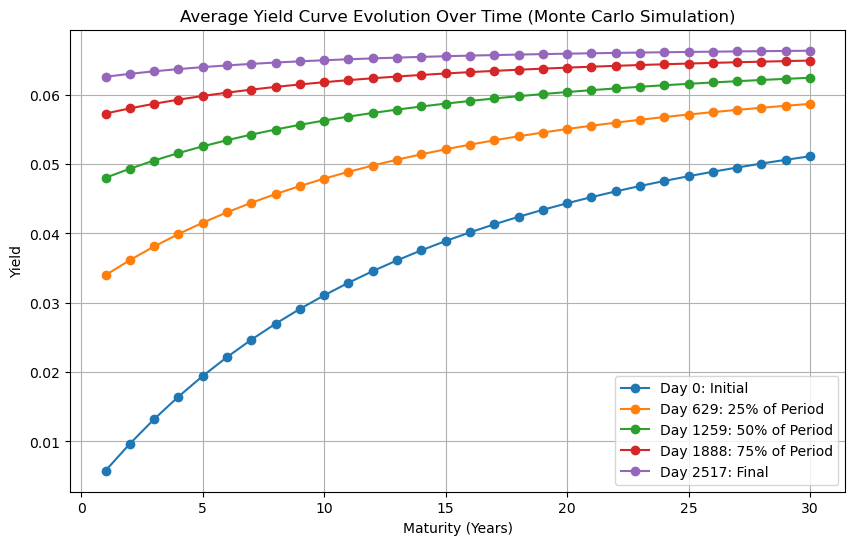

In [45]:
# Select time points for plotting (e.g., first, middle, and last point in time)
plot_indices = [0, simulated_yields_all.shape[1] // 4, simulated_yields_all.shape[1] // 2, 3 * simulated_yields_all.shape[1] // 4, simulated_yields_all.shape[1] - 1]
plot_labels = ["Initial", "25% of Period", "50% of Period", "75% of Period", "Final"]

# Plot the yield curve evolution for these time points
plt.figure(figsize=(10, 6))
for idx, label in zip(plot_indices, plot_labels):
    # For each selected index, extract the yield curve at that time point (mean across simulations)
    yield_curve_at_time = simulated_yields_all[:, idx, :].mean(axis=0)
    plt.plot(maturities, yield_curve_at_time, marker='o', label=f"Day {idx}: {label}")

plt.xlabel("Maturity (Years)")
plt.ylabel("Yield")
plt.title("Average Yield Curve Evolution Over Time (Monte Carlo Simulation)")
plt.legend()
plt.grid(True)
plt.show()

#### CMB

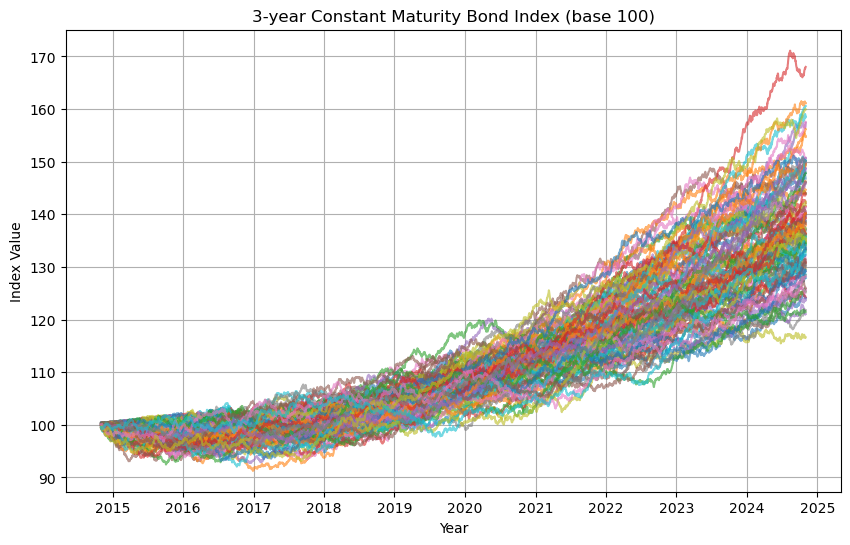

In [47]:
cmb_indices = []  # Store cumulative bond indices for each simulation

dt = 1 / 252  # Time step as a fraction of the year (assuming 252 trading days)

for sim in range(n_simulations):
    # Extract 3-year discount bond prices for the given simulation
    bond_prices = P_t_T_all[sim, :, 2]  
    
    # Shift prices forward by one day to compute daily price changes
    bond_prices_shifted = np.roll(bond_prices, shift=-1, axis=0)
    bond_prices_shifted[-1] = np.nan  # Avoid incorrect last value
    
    # Compute relative price changes
    price_change = (bond_prices_shifted - bond_prices) / bond_prices  # Element-wise
    
    # Extract 3-year bond yields
    yields_3y = simulated_yields_all[sim, :, 2]
    
    # Compute interest accrual
    interest_accrual = yields_3y * dt
    
    # Compute total return: price change + interest accrual
    total_return = price_change + interest_accrual
    
    # Drop NaN values (from last shift operation)
    total_return = pd.Series(total_return).dropna().values  # Ensure it's a NumPy array
    
    # Compute the cumulative bond index (starting value = 100)
    cmb_index = np.cumprod(1 + total_return) * 100  # Element-wise cumulative product
    
    # Append result
    cmb_indices.append(cmb_index)

# Set the index of cmb_indices to match the index of yields_df[30]
cmb_indices_df = pd.DataFrame(cmb_indices).T

# Set the index to be the same as yields_df[30].index
cmb_indices_df.index = yields_df[1:].index

# Plot the 3-year Constant Maturity Bond Index for all simulations
plt.figure(figsize=(10, 6))
for sim in range(n_simulations):
    plt.plot(cmb_indices_df[sim], alpha=0.6)

plt.title("3-year Constant Maturity Bond Index (base 100)")
plt.xlabel("Year")
plt.ylabel("Index Value")
plt.grid(True)
plt.show()

In [48]:
store = []
cmb_index_all = []
for i in range(n_simulations):
    store.append(np.array(cmb_indices[i])[-1])  # Store the last value of each index series
    cmb_index_all.append(np.array(cmb_indices[i]))

store_mean = np.mean(store)  # Compute the mean AFTER the loop
cmb_index_all = pd.DataFrame(cmb_index_all).T

print(store_mean)

138.67642926762346


In [49]:
simulated_safe_ret_daily = pd.DataFrame(cmb_indices_df).pct_change().dropna()
simulated_safe_ret_weekly = simulated_safe_ret_daily.resample('W').ffill().pct_change().dropna()
simulated_safe_ret_monthly = simulated_safe_ret_daily.resample('ME').ffill().pct_change().dropna()

In [50]:
simulated_safe_ret_daily

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Effective date,,,,,,,,,,,,,,,,,,,,,
2014-11-04,-0.001569,0.000068,-0.000657,-0.001150,0.001963,0.000084,0.001600,0.001853,0.000680,0.000946,...,0.000103,-0.001481,-0.000869,0.000781,0.000344,0.000994,0.000145,-0.000099,0.001518,0.000087
2014-11-05,-0.000471,0.000950,0.000441,-0.001587,-0.001110,0.000047,0.001410,0.001305,-0.001163,0.000621,...,-0.000053,-0.000609,0.001494,-0.001680,-0.001255,0.000047,-0.000625,-0.002165,-0.000494,-0.000826
2014-11-06,0.002276,0.000415,-0.000880,-0.001969,-0.000220,0.000047,0.000047,0.000863,0.001682,0.000047,...,-0.001494,-0.000394,0.000790,-0.000420,-0.001207,0.000047,0.000220,0.000253,0.000841,-0.002386
2014-11-07,0.000847,0.001036,-0.001303,0.000219,0.001478,-0.001117,-0.000039,0.000047,-0.001739,-0.001640,...,-0.000602,0.000886,-0.001301,-0.002609,-0.001052,-0.000429,0.000984,0.003072,-0.001856,0.002735
2014-11-10,-0.004597,-0.001289,0.000036,0.002515,-0.002583,-0.001390,0.000134,0.000047,0.004038,-0.002743,...,-0.004193,0.000511,0.001400,-0.003566,-0.000680,0.000524,-0.002956,0.000245,-0.006277,-0.002085
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-28,-0.003422,0.001932,-0.001450,-0.003757,-0.002156,-0.000970,0.002387,-0.000765,-0.001076,-0.002867,...,-0.002003,0.002520,-0.003261,-0.001295,0.002549,0.001934,-0.000239,-0.001386,-0.000401,0.000547
2024-10-29,0.000674,0.003799,-0.000961,0.002101,-0.001038,-0.000323,-0.003512,-0.003351,-0.000043,0.000527,...,0.001185,-0.000455,0.001241,0.001153,0.002429,-0.002111,0.000126,0.000753,0.000913,0.000839
2024-10-30,-0.001933,-0.000384,0.000160,-0.002186,0.001390,0.000442,-0.000345,0.000719,0.002215,0.002263,...,0.000051,-0.000030,0.000221,0.000393,-0.000300,-0.001870,0.001559,-0.000050,-0.000770,-0.000414


##### Old Versions - Vasicek + CMB

In [52]:
# # Vasicek parameters
# lambda_r = -0.53
# kappa = 0.08  # Mean reversion speed (a)
# sigma = 0.0098  # Volatility
# theta = 0.0302 + ((lambda_r * sigma) / kappa)  # Long-term mean interest rate (b)

# # Load yield data (Assuming 'yields_df' is given with dates as index and maturities as columns)
# yields_df = yields_df.sort_index()  # Ensure it's sorted by date
# yields_df_sim = yields_df.iloc[:, 1:]  # Exclude the first column

# dates = yields_df_sim.index
# maturities = yields_df_sim.columns.astype(float)  # Convert maturities to numeric
# n_days = len(yields_df_sim)  # Number of days in simulation
# n_simulations = 10  # Number of Monte Carlo simulations

# # Extract initial yield curve (excluding first column)
# initial_yield_curve = yields_df_sim.iloc[0].values

# # Initialize bond prices for the first time step
# initial_bond_prices = prices_df.iloc[0, 1:].values  # First bond prices from 'prices_df'

# # Precompute constants for Vasicek bond price formula
# B_T = (1 - np.exp(-kappa * maturities)) / kappa
# A_T = (theta - (sigma ** 2 / (2 * kappa ** 2))) * (B_T - maturities) + (sigma ** 2 / (4 * kappa)) * B_T ** 2

# # Vectorized random shock generation for the entire simulation
# random_shocks = np.random.normal(size=(n_simulations, n_days - 1))

# # Assuming 'dates' is initially in numpy ndarray form (not pandas DatetimeIndex)
# # Convert it to a pandas DatetimeIndex
# dates = pd.to_datetime(dates)

# # Precompute time differences (dt) once for all days (vectorized)
# dt = (dates[1:] - dates[:-1]).days / 252  # Convert days to year fractions
# dt = np.concatenate(([1], dt))  # Set dt[0] = 1 for the first step

# # Initialize arrays to store bond prices and yields
# simulated_yields_all = np.zeros((n_simulations, n_days, len(maturities)))
# bond_prices_all_simulations = np.zeros((n_simulations, n_days, len(maturities)))

# # Initialize the first time step (t=0)
# simulated_yields_all[:, 0, :] = initial_yield_curve  # First yield curve is actual data
# bond_prices_all_simulations[:, 0, :] = initial_bond_prices  # First bond prices

# # Monte Carlo simulations
# for sim in range(n_simulations):
#     # Initialize the path for the current simulation
#     r_t = initial_yield_curve[0]  # Use the first maturity as the initial short rate
#     simulated_yields = np.zeros((n_days, len(maturities)))  # Store one simulation path
#     simulated_yields[0] = initial_yield_curve  # First yield curve is actual data
    
#     bond_prices_for_simulation = np.zeros((n_days, len(maturities)))  # Store bond prices for simulation
#     bond_prices_for_simulation[0] = initial_bond_prices  # First bond prices

#     # Monte Carlo simulation loop (optimized to use vectorized operations)
#     for i in range(1, n_days):
#         Z = random_shocks[sim, i - 1]  # Use precomputed random shock
#         r_t = r_t + kappa * (theta - r_t) * dt[i] + sigma * np.sqrt(dt[i]) * Z  # Vasicek evolution
        
#         # Ensure non-negative interest rates
#         r_t = np.maximum(r_t, 0)

#         # Compute bond prices using precomputed constants
#         P_t_T = np.exp(-A_T - B_T * r_t)
#         bond_prices_for_simulation[i] = P_t_T

#         # Compute yields for all maturities
#         simulated_yields[i] = np.maximum(-np.log(P_t_T) / maturities, 0.0001)  # Convert to yield curve

#     # Store bond prices and yields for this simulation
#     simulated_yields_all[sim] = simulated_yields
#     bond_prices_all_simulations[sim] = bond_prices_for_simulation

# # Compute the average bond prices across all simulations and all time steps
# average_bond_prices = bond_prices_all_simulations.mean(axis=0)  # Mean across simulations (axis 0)

# # Compute the average yield curve across simulations
# average_yield_curve = simulated_yields_all.mean(axis=0)

In [53]:
# # Vasicek parameters
# lambda_r = -0.53
# kappa = 0.13  # Mean reversion speed (a)
# sigma = 0.0098  # Volatility
# theta = 0.0302 + ((lambda_r * sigma) / kappa)  # Long-term mean interest rate (b)

# # Load yield data (Assuming 'yields_df' is given with dates as index and maturities as columns)
# yields_df = yields_df.sort_index()  # Ensure it's sorted by date
# yields_df_sim = yields_df.iloc[:, 1:]  # Exclude the first column

# dates = yields_df_sim.index
# maturities = yields_df_sim.columns.astype(float)  # Convert maturities to numeric
# n_days = len(yields_df_sim)  # Number of days in simulation
# n_simulations = 10  # Number of Monte Carlo simulations

# # Extract initial yield curve (excluding first column)
# initial_yield_curve = yields_df_sim.iloc[0].values

# # Initialize bond prices for the first time step
# initial_bond_prices = prices_df.iloc[0, 1:].values  # First bond prices from 'prices_df'

# # Precompute constants for Vasicek bond price formula
# B_T = (1 - np.exp(-kappa * maturities)) / kappa
# A_T = (theta - (sigma ** 2 / (2 * kappa ** 2))) * (B_T - maturities) + (sigma ** 2 / (4 * kappa)) * B_T ** 2

# # Vectorize random shock generation for the entire simulation
# random_shocks = np.random.normal(size=(n_simulations, n_days - 1))

# # Initialize arrays to store bond prices and yields
# simulated_yields_all = np.zeros((n_simulations, n_days, len(maturities)))
# bond_prices_all_simulations = np.zeros((n_simulations, n_days, len(maturities)))

# # Monte Carlo simulations
# for sim in range(n_simulations):
#     r_t = initial_yield_curve[0]  # Use the first maturity as the initial short rate
#     simulated_yields = np.zeros((n_days, len(maturities)))  # Store one simulation path
#     simulated_yields[0] = initial_yield_curve  # First yield curve is actual data
    
#     bond_prices_for_simulation = np.zeros((n_days, len(maturities)))  # Store bond prices for simulation
#     bond_prices_for_simulation[0] = initial_bond_prices  # First bond prices

#     for i in range(1, n_days):
#         dt = (dates[i] - dates[i - 1]).days / 252  # Convert days to year fraction
#         Z = random_shocks[sim, i - 1]  # Use precomputed random shock
#         r_t = r_t + kappa * (theta - r_t) * dt + sigma * np.sqrt(dt) * Z  # Vasicek evolution
        
#         # Ensure non-negative interest rates
#         r_t = max(r_t, 0)

#         # Compute bond prices using precomputed constants
#         P_t_T = np.exp(-A_T - B_T * r_t)
#         bond_prices_for_simulation[i] = P_t_T

#         # Compute yields for all maturities
#         simulated_yields[i] = np.maximum(-np.log(P_t_T) / maturities, 0.0001)  # Convert to yield curve

#     # Store bond prices and yields for this simulation
#     simulated_yields_all[sim] = simulated_yields
#     bond_prices_all_simulations[sim] = bond_prices_for_simulation

# # Compute the average bond prices across all simulations and all time steps
# average_bond_prices = bond_prices_all_simulations.mean(axis=0)  # Mean across simulations (axis 0)

# # Compute the average yield curve across simulations
# average_yield_curve = simulated_yields_all.mean(axis=0)

# # You can now process the average bond prices and yields for further analysis

In [54]:
# # Vasicek parameters
# lambda_r = -0.53
# kappa = 0.08  # Mean reversion speed (a)
# sigma = 0.0098  # Volatility
# theta = 0.0302 + ((lambda_r * sigma) / kappa)  # Long-term mean interest rate (b)

# # Load yield data (Assuming 'yields_df' is given with dates as index and maturities as columns)
# yields_df = yields_df.sort_index()  # Ensure it's sorted by date
# yields_df_sim = yields_df.iloc[:, 1:]  # Exclude the first column

# dates = yields_df_sim.index
# maturities = yields_df_sim.columns.astype(float)  # Convert maturities to numeric
# n_days = len(yields_df_sim)  # Number of days in simulation
# n_simulations = 10  # Number of Monte Carlo simulations

# # Initialize 3D array to store simulated yield curves for all simulations
# simulated_yields_all = np.zeros((n_simulations, n_days, len(maturities)))

# # List to store bond prices for all simulations and time steps
# bond_prices_all_simulations = []  # Initialize as empty list

# # Extract initial yield curve (excluding first column)
# initial_yield_curve = yields_df_sim.iloc[0].values

# # Initialize bond prices for the first time step
# initial_bond_prices = prices_df.iloc[0, 1:].values  # First bond prices from 'prices_df'

# # Monte Carlo simulations
# for sim in range(n_simulations):
#     r_t = initial_yield_curve[2] # Use the first maturity as the initial short rate
#     simulated_yields = np.zeros((n_days, len(maturities)))  # Store one simulation path
#     simulated_yields[0] = initial_yield_curve  # First yield curve is actual data

#     # List to store bond prices for this simulation
#     bond_prices_for_simulation = [initial_bond_prices]  # Initialize with the actual bond prices for the first step

#     for i in range(1, n_days):
#         dt = (dates[i] - dates[i - 1]).days / 252  # Convert days to year fraction
#         Z = np.random.normal()  # Random shock
#         r_t = r_t + kappa * (theta - r_t) * dt + sigma * np.sqrt(dt) * Z  # Vasicek evolution
        
#         # Ensure non-negative interest rates
#         r_t = max(r_t, 0)

#         # Compute bond prices using the Vasicek formula
#         def bond_price(r_t, T):
#             B_T = (1 - np.exp(-kappa * T)) / kappa
#             A_T = (theta - (sigma**2 / (2 * kappa**2))) * (B_T - T) + (sigma**2 / (4 * kappa)) * B_T**2
#             return np.exp(-A_T - B_T * r_t)

#         # def bond_price(r_t, T):
#         #     B = (1 - np.exp(-kappa * T)) / kappa
#         #     A = np.exp((theta - (sigma**2) / (2*kappa**2)) * (B - (T)) - ((sigma**2 * B**2) / (4 * kappa)))
#         #     return A * np.exp(-B * r_t)

#         # Compute yields for all maturities
#         P_t_T = np.array([bond_price(r_t, T) for T in maturities])
        
#         # Store bond prices for this day
#         bond_prices_for_simulation.append(P_t_T)

#         # Store the yields
#         simulated_yields[i] = np.maximum(-np.log(P_t_T) / maturities, 0.0001)  # Convert to yield curve

#     # Append the bond prices for this simulation to the main list
#     bond_prices_all_simulations.append(bond_prices_for_simulation)

#     # Store the entire simulation path (for yields)
#     simulated_yields_all[sim] = simulated_yields

# # Convert bond prices to a NumPy array for easy computation
# bond_prices_all_simulations = np.array(bond_prices_all_simulations)

# # Compute the average bond prices across all simulations and all time steps
# average_bond_prices = bond_prices_all_simulations.mean(axis=0)  # Mean across simulations (axis 0)

# # Compute the average yield curve across simulations
# average_yield_curve = simulated_yields_all.mean(axis=0)

# # Select time points for plotting
# plot_indices = [0, n_days // 4, n_days // 2, 3 * n_days // 4, n_days - 1]
# plot_labels = ["Initial (Actual)", "25% of Period", "50% of Period", "75% of Period", "Final Estimated"]

# # Plot multiple yield curves (Monte Carlo average)
# plt.figure(figsize=(10, 6))
# for idx, label in zip(plot_indices, plot_labels):
#     plt.plot(maturities, average_yield_curve[idx], marker='o', label=f"Day {idx}: {label}")

# plt.xlabel("Maturity (Years)")
# plt.ylabel("Yield")
# plt.title("Monte Carlo Simulated Yield Curve Evolution (Vasicek Model)")
# plt.legend()
# plt.grid()
# plt.show()

In [55]:
# # Select 3-year bond prices (index 2 corresponds to 3-year maturity)
# cmb_indices = []  # Store cumulative bond indices for each simulation

# dt = 1 / 252  # Time step as a fraction of the year (assuming 252 trading days)

# for sim in range(n_simulations):
#     avg_bond_prices = bond_prices_all_simulations[sim, 1:, 2]  # Prices of 3-year discount bonds
#     avg_bond_prices_shifted = np.roll(avg_bond_prices, shift=-1, axis=0)  # Shift prices to next day (P(t+dt, T+dt))
#     avg_bond_prices_shifted[-1] = np.nan  # Handle last price

#     # Compute price change as relative change
#     price_change = (avg_bond_prices_shifted - avg_bond_prices) / avg_bond_prices  # (P(t+dt, T+dt) - P(t, T)) / P(t, T)
    
#     # Extract 3-year bond yields
#     yields_3y = simulated_yields_all[sim, 1:, 2]
    
#     # Compute interest accrual
#     interest_accrual = yields_3y * dt
    
#     # Total return: price change + interest accrual
#     total_return = price_change + interest_accrual
    
#     # Convert to pandas Series to allow for dropna()
#     total_return_series = pd.Series(total_return)
    
#     # Initialize the cumulative index (starting value = 100)
#     cmb_index = [100]
    
#     # Compute the cumulative bond index
#     for ret in total_return_series.dropna():  # Drop NaN values
#         cmb_index.append(cmb_index[-1] * (1 + ret))
    
#     # Convert to pandas Series
#     cmb_index = pd.Series(cmb_index[1:], index=total_return_series.dropna().index)
#     cmb_indices.append(cmb_index)

# # Plot the 3-year Constant Maturity Bond Index for all simulations
# plt.figure(figsize=(10, 6))
# for sim in range(n_simulations):
#     plt.plot(cmb_indices[sim], alpha=0.6)
# plt.title("3-year Constant Maturity Bond Index (base 100)")
# plt.xlabel("Year")
# plt.ylabel("Index Value")
# plt.grid(True)
# plt.show()

In [56]:
# # Select 3-year bond prices (index 2 corresponds to 3-year maturity)
# avg_bond_prices = average_bond_prices[1:, 2]  # Prices of 3-year discount bonds
# avg_bond_prices_shifted = np.roll(avg_bond_prices, shift=-1, axis=0)  # Shift prices to next day (P(t+dt, T+dt))

# # Handle last price (after shift) by setting it to NaN or appropriate value
# avg_bond_prices_shifted[-1] = np.nan

# # Compute price change as relative change
# price_change = (avg_bond_prices_shifted - avg_bond_prices) / avg_bond_prices  # (P(t+dt, T+dt) - P(t, T)) / P(t, T)

# # Extract 3-year bond yields (index 2 corresponds to 3-year maturity)
# yields_3y = average_yield_curve[1:, 2]  # Yields of 3-year discount bonds
# # yields_3y_series = pd.Series(yields_3y)
# # yields_3y_series = pd.concat([pd.Series([yields_df.iloc[0, 2]]), yields_3y_series], ignore_index=True)

# # Time step: 1 day as a fraction of the year (assuming 252 trading days)
# dt = 1 / 252  

# # Compute interest accrual based on bond yields and time step
# interest_accrual = yields_3y * dt

# # Total return: price change + interest accrual
# total_return = price_change + interest_accrual

# # Convert to pandas Series to allow for dropna()
# total_return_series = pd.Series(total_return)

# # Initialize the cumulative index (starting value = 100)
# cmb_index = [100]

# # Compute the cumulative bond index
# for ret in total_return_series.dropna():  # Drop NaN values that could have been introduced by shifting
#     cmb_index.append(cmb_index[-1] * (1 + ret))

# # Convert to a pandas Series for easy plotting
# cmb_index = pd.Series(cmb_index[1:], index=total_return_series.dropna().index)

# # Plot the 3-year Constant Maturity Bond Index
# plt.figure(figsize=(10, 6))
# plt.plot(yields_df_sim[2:].index, cmb_index)
# plt.title("3-year Constant Maturity Bond Index (base 100)")
# plt.xlabel("Year")
# plt.ylabel("Index Value")
# plt.grid(True)
# plt.show()

##### Stop

#### GHP

In [59]:
# Define fixed cash flows for different categories
savings_cashflows = 25000 * np.ones(20)  # 20 payments of 25,000 (savings)
essential_goals_cashflows = 20000 * np.ones(20)  # 20 payments of 20,000 (essential goals)
aspirational_goals_cashflows = 50000 * np.ones(20)  # 20 payments of 50,000 (aspirational goals)

num_cashflows = len(savings_cashflows)

num_simulations, num_days, num_maturities = P_t_T_all.shape  # Extract dimensions

# Define yearly maturities (original grid)
yearly_maturities = np.linspace(10, 30, num_maturities)  # Assuming maturities are equally spaced

# Pre-allocate PV array for savings, essential goals, and aspirational goals
savings_pv = np.zeros((num_simulations, num_days))
essential_goals_pv = np.zeros((num_simulations, num_days))
aspirational_goals_pv = np.zeros((num_simulations, num_days))

# Loop over each time step to interpolate and discount properly
for i in range(0, num_days):  
    # Compute decreasing daily maturities from 10 years minus i/252 (approx. daily step)
    daily_maturities = np.linspace(10 - i / 252, 30 - i / 252, num_cashflows)

    # Initialize arrays to store interpolated discount factors for each goal category
    interpolated_savings_discounts = np.zeros((num_simulations, num_cashflows))
    interpolated_essential_goals_discounts = np.zeros((num_simulations, num_cashflows))
    interpolated_aspirational_goals_discounts = np.zeros((num_simulations, num_cashflows))

    for sim in range(num_simulations):
        # Interpolation function for savings
        interpolator = interp1d(
            yearly_maturities,  # Original maturities
            P_t_T_all[sim, i, :],  # Discount factors for this sim & time
            kind='linear',  # Linear interpolation
            bounds_error=False,  # Avoid extrapolation
            fill_value="extrapolate"  # Optional: Prevents issues if extrapolation is needed
        )
        
        # Interpolate discount factors for each category of cash flow
        interpolated_savings_discounts[sim, :] = interpolator(daily_maturities)
        interpolated_essential_goals_discounts[sim, :] = interpolator(daily_maturities)
        interpolated_aspirational_goals_discounts[sim, :] = interpolator(daily_maturities)

    # Compute present values of cash flows for each category
    savings_pv[:, i] = np.sum(interpolated_savings_discounts * savings_cashflows, axis=1)
    essential_goals_pv[:, i] = np.sum(interpolated_essential_goals_discounts * essential_goals_cashflows, axis=1)
    aspirational_goals_pv[:, i] = np.sum(interpolated_aspirational_goals_discounts * aspirational_goals_cashflows, axis=1)

# Compute mean present values across simulations for each category
savings_pv_mean = savings_pv.mean(axis=0)
essential_goals_pv_mean = essential_goals_pv.mean(axis=0)
aspirational_goals_pv_mean = aspirational_goals_pv.mean(axis=0)

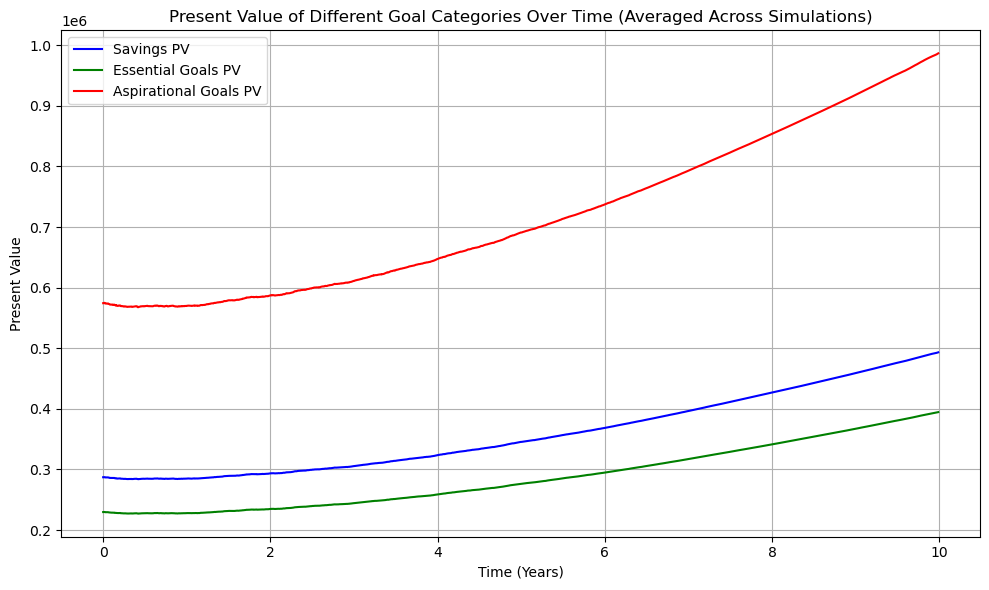

In [60]:
# Time axis in years
time_years = np.arange(num_days) / 252  # Convert days to years (assuming 252 trading days in a year)

# Plot results
plt.figure(figsize=(10, 6))
plt.plot(time_years, savings_pv_mean, label="Savings PV", color='blue')
plt.plot(time_years, essential_goals_pv_mean, label="Essential Goals PV", color='green')
plt.plot(time_years, aspirational_goals_pv_mean, label="Aspirational Goals PV", color='red')

plt.title("Present Value of Different Goal Categories Over Time (Averaged Across Simulations)")
plt.xlabel("Time (Years)")
plt.ylabel("Present Value")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [61]:
# savings = 25000
# essential = 20000
# aspirational = 50000

# savings_pv = [savings]
# essential_pv = [essential]
# aspirational_pv = [aspirational]

# for i in range(1, 20):
#     savings_pv.append(savings * P_t_T_all[0,-1,i])
#     essential_pv.append(savings * P_t_T_all[0,-1,i])
#     aspirational_pv.append(savings * P_t_T_all[0,-1,i])

In [62]:
# Compute the total present value required at each time step
retirement_pv = savings_pv_mean + essential_goals_pv_mean + aspirational_goals_pv_mean

# Define the maturity of the retirement bond (e.g., 30 years from today)
retirement_maturity = 30  # in years

# Pre-allocate an array for the retirement bond face value
retirement_bond_face_value = np.zeros(num_days)

for i in range(num_days):
    # Determine the correct discount factor at retirement maturity
    daily_maturity = retirement_maturity - i / 252  # Adjust for time step
    discount_factors = np.zeros(num_simulations)
    
    for sim in range(num_simulations):
        discount_factors[sim] = interpolator(daily_maturity)
    
    mean_discount_factor = discount_factors.mean()
    
    # Compute the face value required for the retirement bond
    if mean_discount_factor > 0:  # Avoid division by zero
        retirement_bond_face_value[i] = retirement_pv[i] / mean_discount_factor
    else:
        retirement_bond_face_value[i] = np.nan  # Handle edge cases

# retirement_bond_face_value now contains the face value of the bond at each time step

### Buy-and-Hold SPY+CMB

In [64]:
yields_today = yields_df.iloc[0]

In [65]:
savings = 25000
essential = 20000
aspirational = 50000

savings_pv = []
essential_pv = []
aspirational_pv = []

for i in range(10, 30):
    savings_pv.append(savings / ((1 + yields_today[i])**i))
    essential_pv.append(essential / ((1 + yields_today[i])**i))
    aspirational_pv.append(aspirational / ((1 + yields_today[i])**i))

In [66]:
print(f'Savings PV: {sum(savings_pv)}')
print(f'Essential Goal PV: {sum(essential_pv)}')
print(f'Aspirational Goal PV: {sum(aspirational_pv)}')

Savings PV: 287037.55524506344
Essential Goal PV: 229630.0441960508
Aspirational Goal PV: 574075.1104901269


---

In [68]:
# savings = 25000
# essential = 20000
# aspirational = 50000

# savings_pv = []
# essential_pv = []
# aspirational_pv = []

# for i in range(10, 30):
#     savings_pv.append(savings / ((1 + yields_today[i])**i))
#     essential_pv.append(essential / ((1 + yields_today[i])**i))
#     aspirational_pv.append(aspirational / ((1 + yields_today[i])**i))
    
# # Total value of savings
# total_value = sum(savings_pv)

# # Define weight range
# weights = np.arange(0.0, 1.1, 0.1)
# portfolio_results = {}
# weight_tracking = {}

# # Loop through each weight allocation
# for risky_percentage in weights:
#     safe_percentage = 1 - risky_percentage
#     risky_initial_investment = total_value * risky_percentage
#     safe_initial_investment = total_value * safe_percentage
    
#     risky_portfolio_value = risky_initial_investment * (1 + simulated_risky_ret_daily).cumprod()
#     safe_portfolio_value = safe_initial_investment * (1 + simulated_safe_ret_daily).cumprod()
    
#     combined_portfolio_value = risky_portfolio_value + safe_portfolio_value
#     risky_weight = risky_portfolio_value / combined_portfolio_value
    
#     portfolio_results[risky_percentage] = combined_portfolio_value
#     portfolio_results[risky_percentage] = portfolio_results[risky_percentage].dropna()
    
#     weight_tracking[risky_percentage] = risky_weight
#     weight_tracking[risky_percentage] = weight_tracking[risky_percentage].dropna()

# # Time in years
# time_years = np.arange(0, len(safe_portfolio_value)) / 252

# # Plot portfolio values
# plt.figure(figsize=(12, 8))
# for risky_percentage, combined_portfolio_value in portfolio_results.items():
#     plt.plot(time_years, combined_portfolio_value.iloc[:, 0], label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")
# plt.title("Portfolio Value Over Time for Different Allocations")
# plt.xlabel("Time (Years)")
# plt.ylabel("Portfolio Value ($)")
# plt.grid(True)
# plt.legend(title="Allocation", loc="upper left", fontsize=8)
# plt.tight_layout()
# plt.show()

# # Plot risky portfolio weight
# plt.figure(figsize=(12, 8))
# for risky_percentage, risky_weight in weight_tracking.items():
#     plt.plot(time_years, risky_weight.iloc[:, 0], label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")
# plt.title("Risky Portfolio Weight Relative to Combined Portfolio Value Over Time")
# plt.xlabel("Time (Years)")
# plt.ylabel("Risky Portfolio Weight (%)")
# plt.grid(True)
# plt.legend(title="Allocation", loc="upper left", fontsize=8)
# plt.tight_layout()
# plt.show()

# # Print final values
# print("Final Portfolio Values for Different Allocations:")
# for risky_percentage, combined_portfolio_value in portfolio_results.items():
#     print(f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}% -> Final Value: ${combined_portfolio_value.iloc[-1, 0]:.2f}")

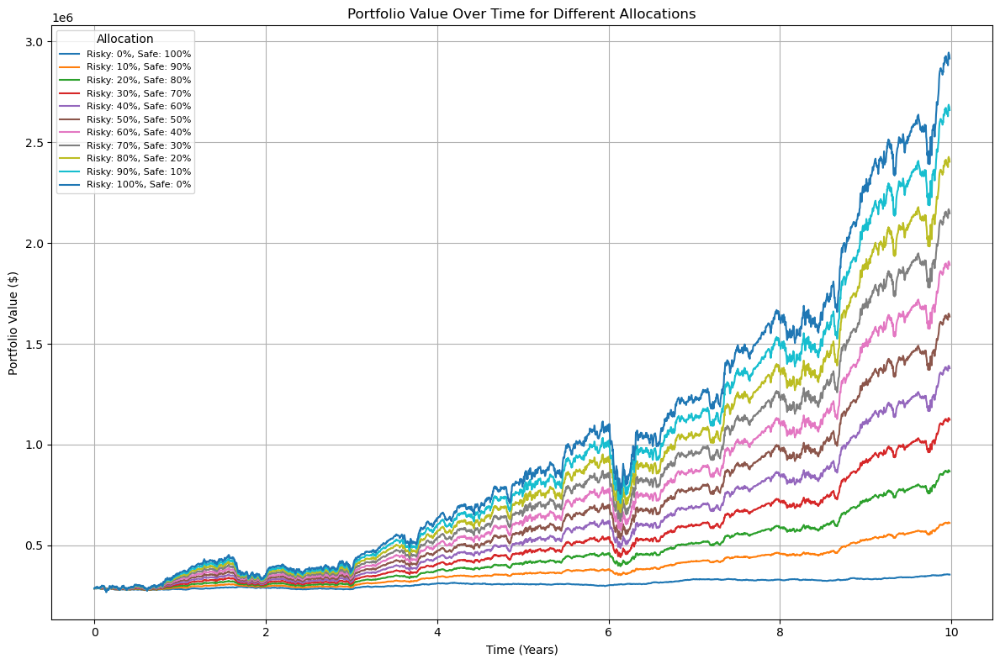

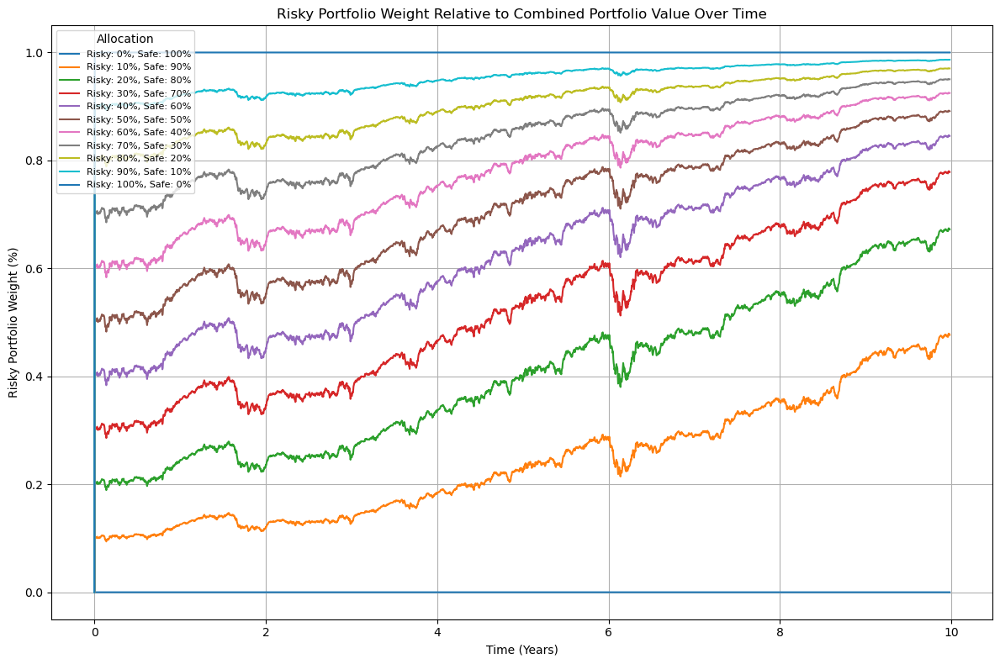

Final Portfolio Values for Different Allocations:
Risky: 0%, Safe: 100% -> Final Value: $355513.88
Risky: 10%, Safe: 90% -> Final Value: $611436.81
Risky: 20%, Safe: 80% -> Final Value: $867359.74
Risky: 30%, Safe: 70% -> Final Value: $1123282.67
Risky: 40%, Safe: 60% -> Final Value: $1379205.60
Risky: 50%, Safe: 50% -> Final Value: $1635128.53
Risky: 60%, Safe: 40% -> Final Value: $1891051.46
Risky: 70%, Safe: 30% -> Final Value: $2146974.40
Risky: 80%, Safe: 20% -> Final Value: $2402897.33
Risky: 90%, Safe: 10% -> Final Value: $2658820.26
Risky: 100%, Safe: 0% -> Final Value: $2914743.19


In [69]:
# Sample initial data (replace with your actual data)
savings = 25000
essential = 20000
aspirational = 50000

savings_pv = []
essential_pv = []
aspirational_pv = []

# Assuming 'yields_today' is already defined elsewhere
for i in range(10, 30):
    savings_pv.append(savings / ((1 + yields_today[i])**i))
    essential_pv.append(essential / ((1 + yields_today[i])**i))
    aspirational_pv.append(aspirational / ((1 + yields_today[i])**i))

# Total value of savings
total_value = sum(savings_pv)

# Define weight range
weights = np.arange(0.0, 1.1, 0.1)
portfolio_results = {}
weight_tracking = {}

# Assuming 'simulated_safe_ret_daily' and 'simulated_risky_ret_daily' are already defined
n_days = simulated_safe_ret_daily.shape[0]
n_simulations = simulated_safe_ret_daily.shape[1]

# Reshape the returns data to avoid nested loops
simulated_risky_ret_daily_array = simulated_risky_ret_daily.values
simulated_safe_ret_daily_array = simulated_safe_ret_daily.values

# Remove the first observation from simulated_risky_ret_daily_array to match the shape of simulated_safe_ret_daily_array
simulated_risky_ret_daily_array = simulated_risky_ret_daily_array[1:, :]

# Loop through each weight allocation
for risky_percentage in weights:
    safe_percentage = 1 - risky_percentage
    
    # Initialize portfolio values
    risky_portfolio_value = np.zeros((n_simulations, n_days))
    safe_portfolio_value = np.zeros((n_simulations, n_days))
    risky_weight = np.zeros((n_simulations, n_days))
    
    # Initial investments (scalars)
    risky_initial_investment = total_value * risky_percentage
    safe_initial_investment = total_value * safe_percentage
    
    # Assign initial values
    risky_portfolio_value[:, 0] = risky_initial_investment
    safe_portfolio_value[:, 0] = safe_initial_investment
    
    # Compute portfolio growth across all simulations at once
    for t in range(1, n_days):
        # Ensure the returns are correctly sliced for each simulation
        risky_portfolio_value[:, t] = risky_portfolio_value[:, t-1] * (1 + simulated_risky_ret_daily_array[t-1, :])
        safe_portfolio_value[:, t] = safe_portfolio_value[:, t-1] * (1 + simulated_safe_ret_daily_array[t-1, :])
        
        # Total portfolio value
        combined_portfolio_value = risky_portfolio_value[:, t] + safe_portfolio_value[:, t]
        
        # Weighting of risky asset
        risky_weight[:, t] = risky_portfolio_value[:, t] / combined_portfolio_value
    
    # Store results for each allocation
    portfolio_results[risky_percentage] = risky_portfolio_value + safe_portfolio_value
    weight_tracking[risky_percentage] = risky_weight

# Time years for plotting
time_years = np.arange(0, n_days) / 252

# Plot portfolio values over time for different allocations
plt.figure(figsize=(12, 8))
for risky_percentage, combined_portfolio_value in portfolio_results.items():
    plt.plot(time_years, combined_portfolio_value[0], label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

plt.title("Portfolio Value Over Time for Different Allocations")
plt.xlabel("Time (Years)")
plt.ylabel("Portfolio Value ($)")
plt.grid(True)
plt.legend(title="Allocation", loc="upper left", fontsize=8)
plt.tight_layout()
plt.show()

# Plot risky portfolio weight over time
plt.figure(figsize=(12, 8))
for risky_percentage, risky_weight in weight_tracking.items():
    plt.plot(time_years, risky_weight[0], label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

plt.title("Risky Portfolio Weight Relative to Combined Portfolio Value Over Time")
plt.xlabel("Time (Years)")
plt.ylabel("Risky Portfolio Weight (%)")
plt.grid(True)
plt.legend(title="Allocation", loc="upper left", fontsize=8)
plt.tight_layout()
plt.show()

# Print final portfolio values
print("Final Portfolio Values for Different Allocations:")
for risky_percentage, combined_portfolio_value in portfolio_results.items():
    print(f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}% -> Final Value: ${combined_portfolio_value[0, -1]:.2f}")

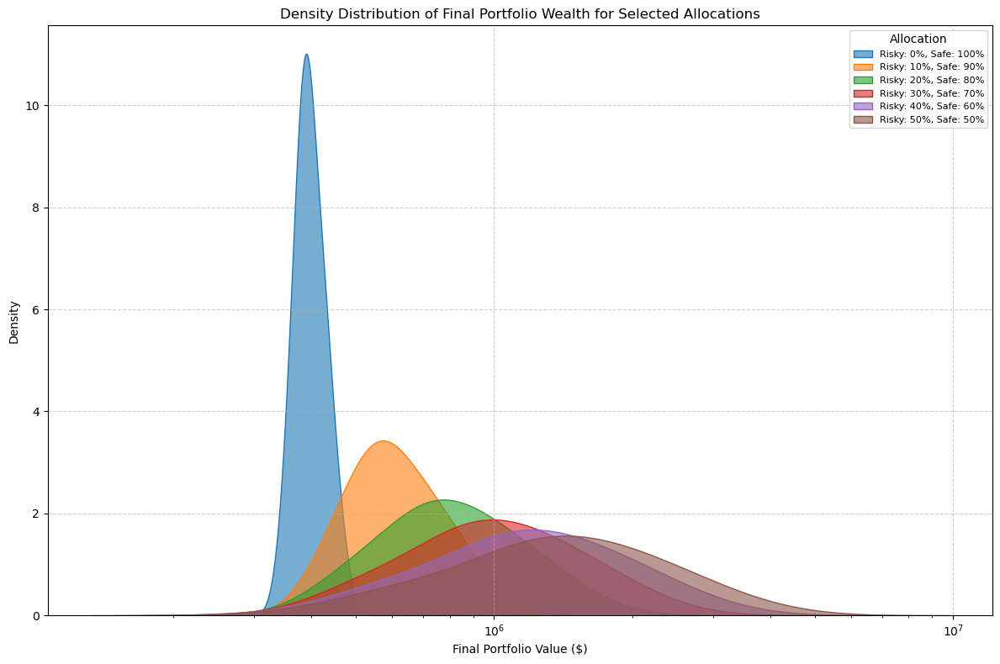

Summary of Final Portfolio Values for Selected Allocations:
Risky: 0%, Safe: 100% -> Mean: $398068.79, Std Dev: $29373.43
Risky: 10%, Safe: 90% -> Mean: $622393.10, Std Dev: $146438.99
Risky: 20%, Safe: 80% -> Mean: $846717.41, Std Dev: $292538.56
Risky: 30%, Safe: 70% -> Mean: $1071041.72, Std Dev: $439620.39
Risky: 40%, Safe: 60% -> Mean: $1295366.03, Std Dev: $586946.52
Risky: 50%, Safe: 50% -> Mean: $1519690.34, Std Dev: $734369.94


In [70]:
# Convert DataFrames to NumPy arrays
simulated_risky_ret_daily_array = simulated_risky_ret_daily.to_numpy()
simulated_safe_ret_daily_array = simulated_safe_ret_daily.to_numpy()

# Ensure both arrays have the same number of days
n_days = min(simulated_risky_ret_daily_array.shape[0], simulated_safe_ret_daily_array.shape[0])
n_simulations = simulated_risky_ret_daily_array.shape[1]

# Initialize dictionary to store final wealth for selected allocations across simulations
selected_allocations = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5]
final_wealth_distribution = {risky_percentage: [] for risky_percentage in selected_allocations}

# Loop through selected weight allocations
for risky_percentage in selected_allocations:
    safe_percentage = 1 - risky_percentage
    risky_initial_investment = total_value * risky_percentage
    safe_initial_investment = total_value * safe_percentage

    # Initialize portfolio values
    risky_portfolio_value = np.full(n_simulations, risky_initial_investment)
    safe_portfolio_value = np.full(n_simulations, safe_initial_investment)

    # Compute portfolio values iteratively over time
    for t in range(n_days):  # Ensure we don't exceed array bounds
        risky_portfolio_value *= (1 + simulated_risky_ret_daily_array[t, :])
        safe_portfolio_value *= (1 + simulated_safe_ret_daily_array[t, :])

    # Combined portfolio value
    combined_portfolio_value = risky_portfolio_value + safe_portfolio_value

    # Store the final values across simulations
    final_wealth_distribution[risky_percentage].extend(combined_portfolio_value)

# Plot density distributions of final wealth for the selected allocations
plt.figure(figsize=(12, 8))

for risky_percentage, final_wealth in final_wealth_distribution.items():
    sns.kdeplot(final_wealth, bw_adjust=1.5, fill=True, alpha=0.6, log_scale=True,
                label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

plt.title("Density Distribution of Final Portfolio Wealth for Selected Allocations")
plt.xlabel("Final Portfolio Value ($)")
plt.ylabel("Density")
plt.legend(title="Allocation", loc="upper right", fontsize=8)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# Print final portfolio values summary for the selected allocations
print("Summary of Final Portfolio Values for Selected Allocations:")
for risky_percentage, final_wealth in final_wealth_distribution.items():
    print(f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}% -> Mean: ${np.mean(final_wealth):.2f}, Std Dev: ${np.std(final_wealth):.2f}")

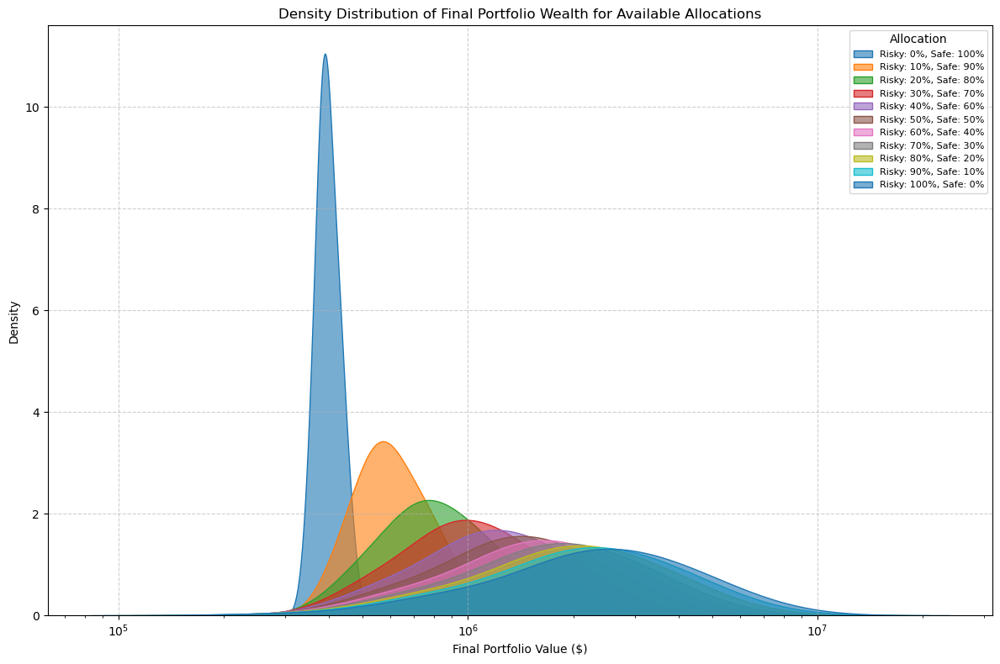

Summary of Final Portfolio Values for Available Allocations:
Risky: 0%, Safe: 100% -> Mean: $398018.23, Std Dev: $29337.68
Risky: 10%, Safe: 90% -> Mean: $621881.23, Std Dev: $146665.10
Risky: 20%, Safe: 80% -> Mean: $845744.23, Std Dev: $292807.15
Risky: 30%, Safe: 70% -> Mean: $1069607.23, Std Dev: $439928.20
Risky: 40%, Safe: 60% -> Mean: $1293470.23, Std Dev: $587292.98
Risky: 50%, Safe: 50% -> Mean: $1517333.22, Std Dev: $734754.84
Risky: 60%, Safe: 40% -> Mean: $1741196.22, Std Dev: $882265.12
Risky: 70%, Safe: 30% -> Mean: $1965059.22, Std Dev: $1029803.00
Risky: 80%, Safe: 20% -> Mean: $2188922.22, Std Dev: $1177358.11
Risky: 90%, Safe: 10% -> Mean: $2412785.22, Std Dev: $1324924.70
Risky: 100%, Safe: 0% -> Mean: $2636648.22, Std Dev: $1472499.31


In [71]:
# Dynamically get available allocations from portfolio_results
selected_allocations = list(portfolio_results.keys())  # Extract available risk allocations

# Compute final wealth distribution dynamically
final_wealth_distribution = {
    risky_pct: portfolio_results[risky_pct][:, -1]  # Extract final wealth per simulation
    for risky_pct in selected_allocations
}

# Plot density distributions
plt.figure(figsize=(12, 8))
for risky_pct, final_wealth in final_wealth_distribution.items():
    sns.kdeplot(final_wealth, bw_adjust=1.5, fill=True, alpha=0.6, log_scale=True,
                label=f"Risky: {risky_pct*100:.0f}%, Safe: {(1-risky_pct)*100:.0f}%")

plt.title("Density Distribution of Final Portfolio Wealth for Available Allocations")
plt.xlabel("Final Portfolio Value ($)")
plt.ylabel("Density")
plt.legend(title="Allocation", loc="upper right", fontsize=8)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# Print summary statistics
print("Summary of Final Portfolio Values for Available Allocations:")
for risky_pct, final_wealth in final_wealth_distribution.items():
    print(f"Risky: {risky_pct*100:.0f}%, Safe: {(1-risky_pct)*100:.0f}% -> Mean: ${np.mean(final_wealth):.2f}, Std Dev: ${np.std(final_wealth):.2f}")

In [72]:
##### Vol Timing #####

### Volatility Timing

#### First for PSP

In [75]:
from arch import arch_model

In [76]:
def garch(returns, p=1, q=1): # 1, 1 Garch, over the entire dataset here
    model = arch_model(returns, vol='Garch', p=p, q=q)
    model_fitted = model.fit(disp="off")
    volatility = model_fitted.conditional_volatility
    return volatility

In [80]:
# So we apply GARCH to each 100 paths, individually
volatility_estimates = np.zeros_like(simulated_risky_ret_daily.values)

for i in range(volatility_estimates.shape[1]):
    path_returns = simulated_risky_ret_daily.iloc[:, i] 
    volatility_estimates[:, i] = garch(path_returns) 

In [94]:
simulated_risky_ret_daily # créer une copie + rajouter les lignes au dessus  + concenate les 21 derniers jours de la partie historique / mmeme valeur sur chaque path
# rolling window de 21 jour

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Date,,,,,,,,,,,,,,,,,,,,,
2014-11-03,-0.002919,-0.004855,0.020960,0.024474,0.002715,-0.013899,0.003249,0.001375,-0.009461,0.019143,...,0.000512,-0.024687,-0.006185,-0.018007,-0.006203,-0.001118,-0.004974,0.015930,-0.017499,-0.009728
2014-11-04,0.002630,0.006345,0.006748,-0.010063,-0.008150,-0.006580,0.025174,-0.009581,0.005824,0.001066,...,0.002795,0.002177,0.011888,-0.008510,0.007888,-0.016111,-0.025835,0.001211,-0.007788,0.005572
2014-11-05,0.005181,0.001375,0.019515,0.005644,-0.009302,-0.000424,0.007723,-0.000985,-0.019096,0.001048,...,-0.009485,-0.021125,-0.013132,0.005667,-0.000593,-0.017231,-0.002971,0.013098,0.012643,0.006377
2014-11-06,0.011135,0.016061,0.009138,-0.007362,0.011793,-0.002947,-0.004929,0.002624,0.004072,-0.006458,...,0.011340,0.020473,0.009721,-0.011351,0.011375,0.010822,0.007208,-0.011348,-0.005911,-0.017061
2014-11-07,-0.004431,-0.000286,-0.015185,-0.008782,-0.008041,-0.006621,0.002122,-0.009643,0.011318,-0.003552,...,0.000335,-0.000415,-0.001929,0.011636,-0.000462,-0.009610,-0.007014,-0.003662,0.002627,0.011162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-28,0.003061,0.000120,0.004535,0.000329,-0.022166,0.002407,-0.011155,-0.001262,-0.010302,-0.000775,...,-0.002187,0.000098,0.004064,0.006686,0.004566,-0.005132,0.004854,-0.012153,-0.006154,-0.002847
2024-10-29,-0.002638,-0.001309,-0.000483,-0.002701,-0.036406,0.000929,-0.013527,0.002116,0.032041,0.005663,...,-0.007470,0.003594,-0.016788,0.008998,0.003803,-0.002353,0.013942,0.006319,0.005351,0.007889
2024-10-30,-0.001450,0.007268,0.001083,0.002252,0.007173,0.006704,0.000097,-0.002523,0.007524,-0.001477,...,-0.005085,0.000622,0.017328,-0.008322,0.005481,0.005715,-0.002528,-0.009391,-0.014345,0.001573


In [88]:
volatility_series

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Date,,,,,,,,,,,,,,,,,,,,,
2014-11-03,0.010031,0.006452,0.011357,0.013871,0.011806,0.010913,0.010666,0.010954,0.011680,0.010457,...,0.011222,0.014577,0.010494,0.013035,0.010179,0.013859,0.010903,0.008196,0.010268,0.009212
2014-11-04,0.009645,0.006567,0.057602,0.015031,0.011261,0.011450,0.010157,0.019290,0.011611,0.011451,...,0.010682,0.016028,0.010263,0.013805,0.009973,0.013143,0.010554,0.009101,0.011442,0.009479
2014-11-05,0.009208,0.006530,0.081567,0.014655,0.011131,0.011171,0.012293,0.022214,0.011102,0.010876,...,0.010190,0.015151,0.010382,0.013429,0.009784,0.013601,0.013235,0.008698,0.011235,0.009137
2014-11-06,0.008882,0.006318,0.095452,0.013923,0.011117,0.010646,0.011829,0.026020,0.012395,0.010342,...,0.010311,0.015963,0.010867,0.012746,0.009367,0.014132,0.012599,0.009105,0.011250,0.008866
2014-11-07,0.009051,0.007653,0.107979,0.013457,0.011146,0.010236,0.011378,0.029585,0.011774,0.010145,...,0.010333,0.016282,0.010713,0.012736,0.009568,0.013725,0.012067,0.009598,0.010923,0.010301
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-28,0.008850,0.010196,0.180892,0.006985,0.025784,0.009808,0.007389,0.048723,0.012725,0.013927,...,0.008531,0.010546,0.014047,0.013332,0.008080,0.006689,0.011437,0.014445,0.009942,0.007617
2024-10-29,0.008485,0.009700,0.180595,0.006784,0.025351,0.009382,0.008112,0.048261,0.012616,0.013190,...,0.008277,0.010066,0.013335,0.012693,0.007881,0.006821,0.010903,0.014315,0.009761,0.007457
2024-10-30,0.008222,0.009274,0.180883,0.006715,0.026638,0.008984,0.009059,0.048204,0.015367,0.012566,...,0.008442,0.009652,0.013835,0.012219,0.007668,0.006736,0.011081,0.013618,0.009389,0.007470


In [90]:
volatility_series = pd.DataFrame(volatility_estimates, index=simulated_risky_ret_daily.index)
#np.sqrt(volatility_series)

In [79]:
volatility_paths = np.std(simulated_risky_ret_daily, axis=0) # ou prendre la vol historique pour le psp et le sp500 /redimensionner
volatility_paths

0     0.011696
1     0.010876
2     0.011509
3     0.012223
4     0.013928
        ...   
95    0.012691
96    0.011447
97    0.011765
98    0.011596
99    0.011631
Length: 100, dtype: float64

In [80]:
target_volatility = volatility_paths
target_volatility

0     0.011696
1     0.010876
2     0.011509
3     0.012223
4     0.013928
        ...   
95    0.012691
96    0.011447
97    0.011765
98    0.011596
99    0.011631
Length: 100, dtype: float64

In [219]:
adjusted_allocation = (target_volatility / volatility_series)
adjusted_allocation

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Date,,,,,,,,,,,,,,,,,,,,,
2014-11-04,0.914136,0.866547,0.993671,1.304023,1.010923,1.077729,1.306068,1.273761,0.946485,1.003742,...,0.941044,1.293670,1.190000,1.750743,1.181923,0.952124,1.240307,0.817110,0.987585,1.301927
2014-11-05,0.918783,0.878465,1.039144,1.291544,0.957109,0.963300,1.284120,1.315063,0.785907,0.983378,...,0.952310,1.243914,1.234749,1.784485,1.184654,0.966206,1.276062,0.859732,1.026435,1.249590
2014-11-06,0.930062,0.891840,1.075202,1.335824,1.007440,1.015248,1.228068,1.196623,0.800918,1.033659,...,0.969657,1.143658,1.103005,1.756788,1.242361,1.005945,1.333827,0.868637,1.058629,1.211390
2014-11-07,0.824586,0.902098,1.047496,1.070851,1.060839,1.053761,1.286229,1.148141,0.819327,1.060745,...,1.007643,1.199355,1.159622,1.749841,1.274414,0.953991,1.290284,0.917670,0.843786,1.218606
2014-11-10,0.869738,0.812461,1.101356,1.026505,0.976739,1.106174,1.205727,1.156432,0.780546,1.104647,...,1.001781,1.197489,1.196409,1.781449,1.326724,0.841594,1.281643,0.968109,0.891687,1.261006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-28,1.306992,1.239229,0.905753,1.043432,1.404042,1.247026,1.184818,1.366657,0.966433,1.052604,...,1.976627,1.312237,1.023282,1.196532,0.698653,1.021430,1.236335,1.558338,1.528144,1.916379
2024-10-29,1.339079,1.253379,0.935015,1.098336,1.413532,1.299146,1.181916,1.409780,1.015663,1.106505,...,1.965961,1.369691,0.846672,1.133651,0.739854,1.062737,1.265528,1.610018,1.583184,1.862367
2024-10-30,1.399222,1.298727,0.956257,1.140094,1.411873,1.339567,0.990114,1.461391,1.057863,1.148449,...,1.915666,1.428686,0.890946,1.074372,0.781739,1.118525,1.292173,1.492760,1.291849,1.909506


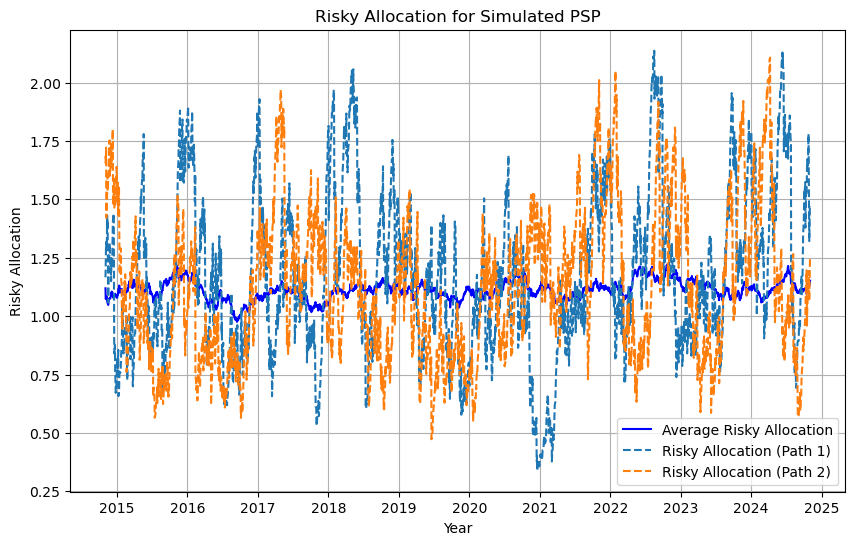

In [82]:
plt.figure(figsize=(10, 6))
plt.plot(simulated_risky_ret_daily.index, adjusted_allocation.mean(axis=1), label="Average Risky Allocation", color='blue')
for i in range(2):
    plt.plot(simulated_risky_ret_daily.index, adjusted_allocation.iloc[:, i], label=f"Risky Allocation (Path {i+1})", linestyle='--')

plt.title("Risky Allocation for Simulated PSP")
plt.xlabel("Year")
plt.ylabel("Risky Allocation")
plt.legend()
plt.grid(True)
plt.show()

In [83]:
total_value = sum(savings_pv)  # being 287K

In [84]:
# So lets suppose we start with a typical 60% allocation to equity and 40% allocation to bond
initial_equity_alloc = 0.6 # will make it change with vol timing
initial_bond_alloc = 0.4  
# Be careful as vol target / vol estimate. max() > 2, to impose limits

In [85]:
simulated_risky_ret_daily = simulated_risky_ret_daily.iloc[1:, :] # we "delete" first row to have same len as safe part

In [86]:
# Initialize arrays to track equity and bond allocations over time
equity_allocations = np.zeros((n_simulations, n_days)) 
bond_allocations = np.zeros((n_simulations, n_days))    

equity_allocations[0, :] = 0.6  
bond_allocations[0, :] = 0.4   

equity_value = np.zeros((simulated_risky_ret_daily.shape[0], simulated_risky_ret_daily.shape[1]))  
bond_value = np.zeros((simulated_risky_ret_daily.shape[0], simulated_risky_ret_daily.shape[1]))  
portfolio_value = np.zeros((simulated_risky_ret_daily.shape[0], simulated_risky_ret_daily.shape[1]))  

equity_value[0, :] = total_value * initial_equity_alloc
bond_value[0, :] = total_value * initial_bond_alloc
portfolio_value[0, :] = total_value

In [87]:
volatility_series = volatility_series.iloc[1:, :]

In [88]:
volatility_paths = np.std(simulated_risky_ret_daily, axis=0)
volatility_paths

0     0.011698
1     0.010878
2     0.011504
3     0.012217
4     0.013931
        ...   
95    0.012694
96    0.011449
97    0.011764
98    0.011592
99    0.011631
Length: 100, dtype: float64

In [89]:
for t in range(1, simulated_risky_ret_daily.shape[0]): 
    target_volatility = volatility_paths  # target vol being the vol per each path
    vol_estimate = volatility_series.iloc[t, :]

    adjusted_equity_alloc = target_volatility / vol_estimate # adj equity alloc being the target_vol div by vol estimate
    adjusted_equity_alloc = np.clip(adjusted_equity_alloc, 0, 1) # limit between 0 and 1
    
    adjusted_bond_alloc = 1 - adjusted_equity_alloc

    equity_value[t, :] = equity_value[t-1, :] * (1 + adjusted_equity_alloc * simulated_risky_ret_daily.iloc[t, :].values)
    bond_value[t, :] = bond_value[t-1, :] * (1 + adjusted_bond_alloc * simulated_safe_ret_daily.iloc[t, :].values)

    portfolio_value[t, :] = equity_value[t, :] + bond_value[t, :]

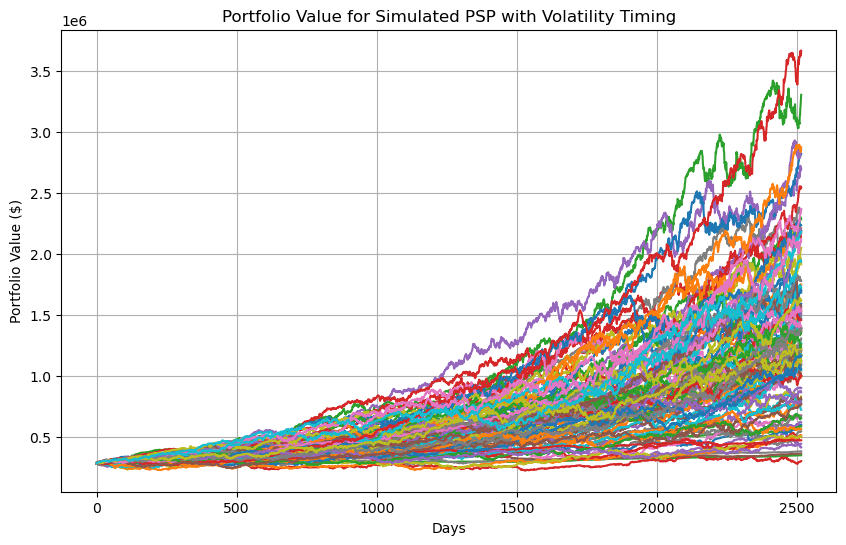

In [90]:
# Plot portfolio values (for example, showing the first few paths)
plt.figure(figsize=(10, 6))
for i in range(100):  # Plot the first 10 paths as an example
    plt.plot(np.arange(simulated_risky_ret_daily.shape[0]), portfolio_value[:, i], label=f"Path {i+1}")
plt.title("Portfolio Value for Simulated PSP with Volatility Timing")
plt.xlabel("Days")
plt.ylabel("Portfolio Value ($)")
plt.grid(True)
plt.show()

In [91]:
print(bond_value[:, 0])

[114815.02209803 114815.02209803 114815.02209803 ... 117770.34794145
 117770.34794145 117770.34794145]


In [92]:
print(equity_value[:, 0])

[ 172222.53314704  173114.82969069  175042.39703616 ... 1363653.74514602
 1355387.54851594 1352524.72670692]


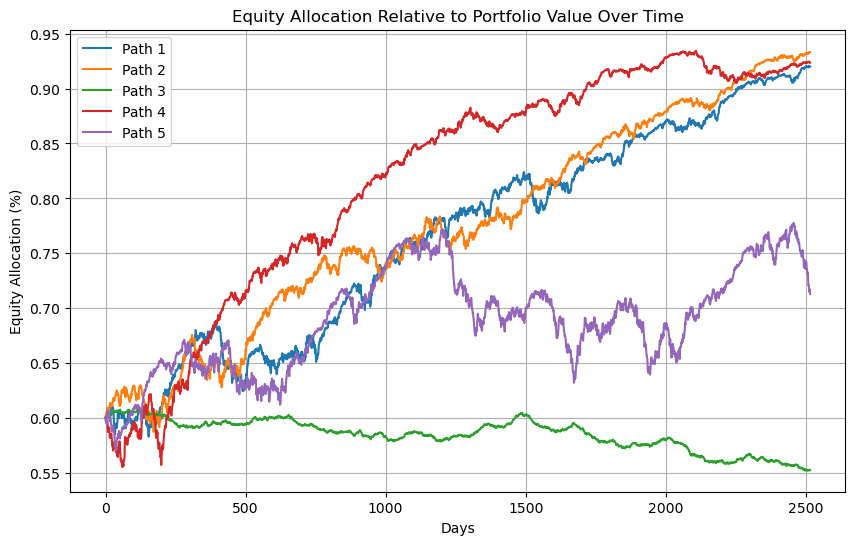

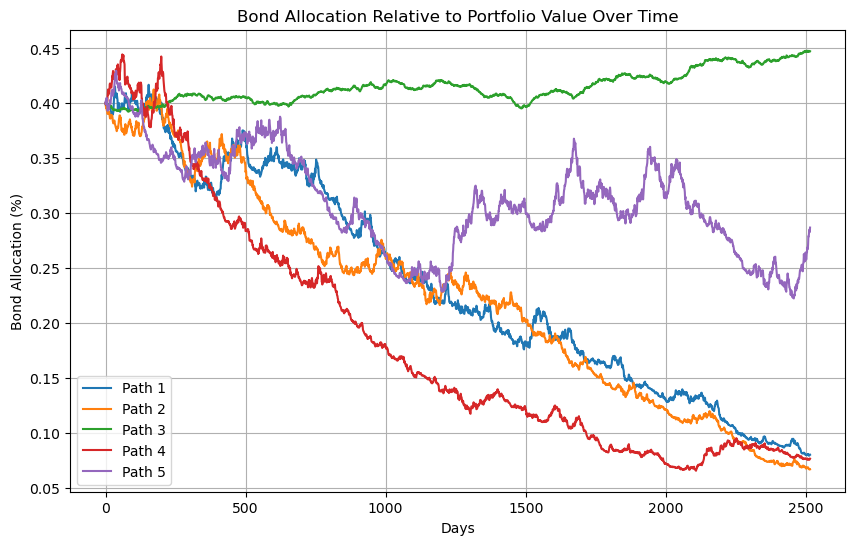

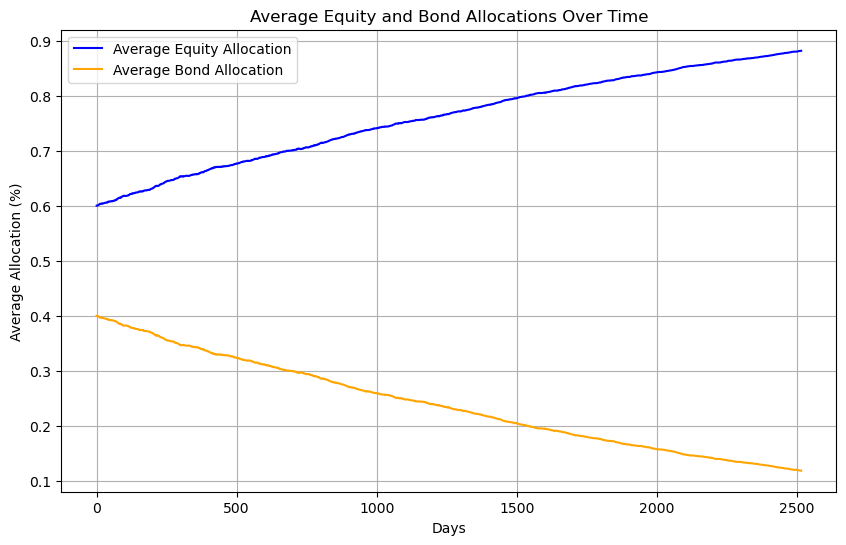

In [93]:
# Calculate the equity allocation at each point in time as a proportion of the total portfolio value
equity_allocation_time = equity_value / portfolio_value  # Proportion of equity in the portfolio for each time step
bond_allocation_time = bond_value / portfolio_value  # Proportion of bond in the portfolio for each time step

# Plot the equity allocation over time for all paths
plt.figure(figsize=(10, 6))
for i in range(5):  # Show first 10 paths as an example
    plt.plot(np.arange(n_days), equity_allocation_time[:, i], label=f"Path {i+1}")
plt.title("Equity Allocation Relative to Portfolio Value Over Time")
plt.xlabel("Days")
plt.ylabel("Equity Allocation (%)")
plt.legend()
plt.grid(True)
plt.show()

# Plot the bond allocation over time for all paths
plt.figure(figsize=(10, 6))
for i in range(5):  # Show first 10 paths as an example
    plt.plot(np.arange(n_days), bond_allocation_time[:, i], label=f"Path {i+1}")
plt.title("Bond Allocation Relative to Portfolio Value Over Time")
plt.xlabel("Days")
plt.ylabel("Bond Allocation (%)")
plt.legend()
plt.grid(True)
plt.show()

# Average allocation over time for equity and bond
average_equity_alloc = np.mean(equity_allocation_time, axis=1)  # Average equity allocation over all paths
average_bond_alloc = np.mean(bond_allocation_time, axis=1)  # Average bond allocation over all paths

# Plot the average equity and bond allocations over time
plt.figure(figsize=(10, 6))
plt.plot(np.arange(n_days), average_equity_alloc, label="Average Equity Allocation", color='blue')
plt.plot(np.arange(n_days), average_bond_alloc, label="Average Bond Allocation", color='orange')
plt.title("Average Equity and Bond Allocations Over Time")
plt.xlabel("Days")
plt.ylabel("Average Allocation (%)")
plt.legend()
plt.grid(True)
plt.show()

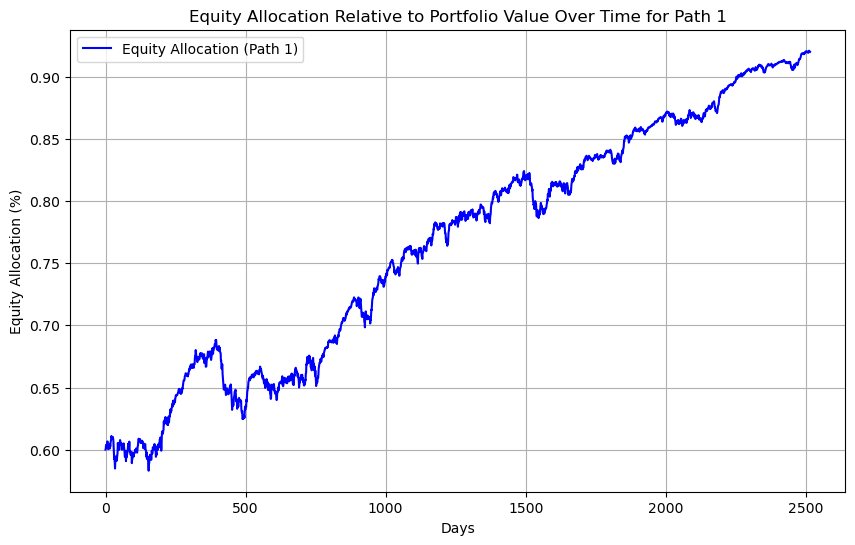

In [94]:
# Plot the equity allocation for the first path over time
plt.figure(figsize=(10, 6))
plt.plot(np.arange(n_days), equity_allocation_time[:, 0], label="Equity Allocation (Path 1)", color='blue')
plt.title("Equity Allocation Relative to Portfolio Value Over Time for Path 1")
plt.xlabel("Days")
plt.ylabel("Equity Allocation (%)")
plt.legend()
plt.grid(True)
plt.show()

In [95]:
print(portfolio_value[-1,:].mean())

1360666.0608235633


In [96]:
print(portfolio_value[-1,:].std())

680507.7248793774


In [213]:
# clean ça + factor exposure à extraire

#### And for S&P500

In [98]:
volatility_estimates = np.zeros_like(simulated_risky_ret_daily_sp500.values)
for i in range(simulated_risky_ret_daily_sp500.shape[1]):
    path_returns = simulated_risky_ret_daily_sp500.iloc[:, i] 
    volatility_estimates[:, i] = garch(path_returns) 

In [99]:
volatility_series = pd.DataFrame(volatility_estimates, index=simulated_risky_ret_daily_sp500.index)
volatility_series

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Date,,,,,,,,,,,,,,,,,,,,,
2014-11-03,0.013326,0.014038,0.013321,0.009631,0.013531,0.011736,0.009030,0.011301,0.014072,0.013630,...,0.012480,0.009870,0.011796,0.007552,0.009185,0.014101,0.010790,0.016936,0.013497,0.008918
2014-11-04,0.013282,0.013375,0.013628,0.009217,0.013346,0.011347,0.009063,0.010974,0.013400,0.012998,...,0.012784,0.009427,0.011378,0.007420,0.010180,0.014263,0.010374,0.016734,0.013188,0.009118
2014-11-05,0.013215,0.013194,0.013032,0.009306,0.014097,0.012695,0.009218,0.010630,0.016137,0.013267,...,0.012633,0.009804,0.010966,0.007279,0.010157,0.014055,0.010083,0.015904,0.012689,0.009500
2014-11-06,0.013055,0.012996,0.012595,0.008997,0.013392,0.012045,0.009639,0.011682,0.015835,0.012622,...,0.012407,0.010664,0.012275,0.007394,0.009685,0.013500,0.009646,0.015741,0.012303,0.009800
2014-11-07,0.014725,0.012848,0.012928,0.011223,0.012718,0.011605,0.009203,0.012175,0.015479,0.012300,...,0.011939,0.010168,0.011676,0.007424,0.009442,0.014235,0.009972,0.014900,0.015435,0.009742
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-28,0.009290,0.009353,0.014951,0.011518,0.009609,0.009807,0.009991,0.010228,0.013123,0.012395,...,0.006086,0.009294,0.013232,0.010856,0.017222,0.013295,0.010407,0.008774,0.008523,0.006195
2024-10-29,0.009067,0.009247,0.014483,0.010943,0.009545,0.009413,0.010015,0.009916,0.012487,0.011791,...,0.006119,0.008904,0.015992,0.011459,0.016263,0.012778,0.010167,0.008493,0.008227,0.006374
2024-10-30,0.008677,0.008924,0.014161,0.010542,0.009556,0.009129,0.011955,0.009565,0.011989,0.011360,...,0.006280,0.008536,0.015197,0.012091,0.015392,0.012141,0.009957,0.009160,0.010082,0.006217


In [100]:
target_volatility = np.std(simulated_risky_ret_daily_sp500, axis=0)
target_volatility

0     0.012142
1     0.011588
2     0.013543
3     0.012016
4     0.013491
        ...   
95    0.013581
96    0.012864
97    0.013674
98    0.013023
99    0.011871
Length: 100, dtype: float64

In [101]:
adjusted_allocation = (target_volatility / volatility_series)
adjusted_allocation

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Date,,,,,,,,,,,,,,,,,,,,,
2014-11-03,0.911140,0.825478,1.016630,1.247623,0.997051,1.041852,1.310758,1.236782,0.901105,0.957063,...,0.964116,1.235395,1.147681,1.719640,1.310187,0.963091,1.192264,0.807347,0.964876,1.331036
2014-11-04,0.914152,0.866405,0.993770,1.303773,1.010885,1.077591,1.305936,1.273572,0.946316,1.003562,...,0.941183,1.293418,1.189811,1.750402,1.182148,0.952181,1.240083,0.817139,0.987520,1.301870
2014-11-05,0.918799,0.878321,1.039247,1.291297,0.957073,0.963176,1.283991,1.314868,0.785766,0.983202,...,0.952451,1.243672,1.234554,1.784137,1.184880,0.966264,1.275831,0.859762,1.026368,1.249534
2014-11-06,0.930078,0.891693,1.075309,1.335569,1.007402,1.015118,1.227944,1.196445,0.800775,1.033474,...,0.969801,1.143436,1.102830,1.756445,1.242598,1.006006,1.333585,0.868668,1.058560,1.211336
2014-11-07,0.824600,0.901950,1.047600,1.070646,1.060799,1.053625,1.286099,1.147971,0.819181,1.060555,...,1.007792,1.199121,1.159438,1.749500,1.274657,0.954048,1.290051,0.917703,0.843731,1.218552
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-28,1.307014,1.239026,0.905843,1.043233,1.403989,1.246866,1.184698,1.366454,0.966260,1.052415,...,1.976920,1.311982,1.023119,1.196298,0.698786,1.021491,1.236111,1.558394,1.528045,1.916294
2024-10-29,1.339102,1.253173,0.935108,1.098126,1.413478,1.298980,1.181796,1.409572,1.015481,1.106308,...,1.966253,1.369424,0.846538,1.133430,0.739995,1.062801,1.265299,1.610076,1.583081,1.862284
2024-10-30,1.399245,1.298514,0.956351,1.139876,1.411820,1.339396,0.990015,1.461174,1.057674,1.148244,...,1.915950,1.428408,0.890805,1.074162,0.781888,1.118592,1.291940,1.492813,1.291764,1.909421


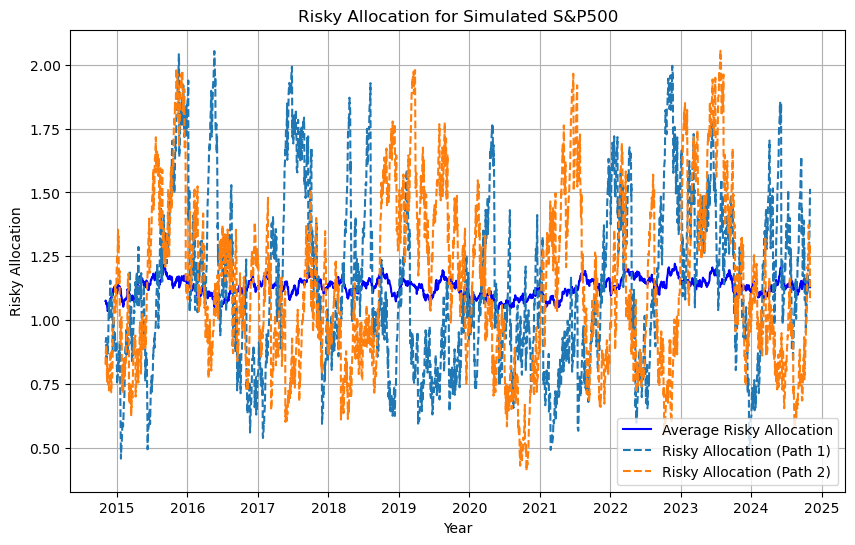

In [102]:
plt.figure(figsize=(10, 6))
plt.plot(simulated_risky_ret_daily_sp500.index, adjusted_allocation.mean(axis=1), label="Average Risky Allocation", color='blue')
for i in range(2):
    plt.plot(simulated_risky_ret_daily_sp500.index, adjusted_allocation.iloc[:, i], label=f"Risky Allocation (Path {i+1})", linestyle='--')

plt.title("Risky Allocation for Simulated S&P500")
plt.xlabel("Year")
plt.ylabel("Risky Allocation")
plt.legend()
plt.grid(True)
plt.show()

In [103]:
simulated_risky_ret_daily_sp500 = simulated_risky_ret_daily_sp500.iloc[1:, :] # we "delete" first row to have same len as safe part

In [104]:
# Initialize arrays to track equity and bond allocations over time
equity_allocations = np.zeros((n_simulations, n_days)) 
bond_allocations = np.zeros((n_simulations, n_days))    

equity_allocations[0, :] = 0.6  
bond_allocations[0, :] = 0.4   

equity_value = np.zeros((simulated_risky_ret_daily_sp500.shape[0], simulated_risky_ret_daily_sp500.shape[1]))  
bond_value = np.zeros((simulated_risky_ret_daily_sp500.shape[0], simulated_risky_ret_daily_sp500.shape[1]))  
portfolio_value = np.zeros((simulated_risky_ret_daily_sp500.shape[0], simulated_risky_ret_daily_sp500.shape[1]))  

equity_value[0, :] = total_value * initial_equity_alloc
bond_value[0, :] = total_value * initial_bond_alloc
portfolio_value[0, :] = total_value

In [105]:
volatility_series = volatility_series.iloc[1:, :]

In [106]:
volatility_paths = np.std(simulated_risky_ret_daily_sp500, axis=0)
volatility_paths

0     0.012142
1     0.011590
2     0.013542
3     0.012019
4     0.013492
        ...   
95    0.013580
96    0.012866
97    0.013673
98    0.013024
99    0.011871
Length: 100, dtype: float64

In [107]:
for t in range(1, simulated_risky_ret_daily_sp500.shape[0]): 
    target_volatility = volatility_paths  # target vol being the vol per each path
    vol_estimate = volatility_series.iloc[t, :]

    adjusted_equity_alloc = target_volatility / vol_estimate # adj equity alloc being the target_vol div by vol estimate
    adjusted_equity_alloc = np.clip(adjusted_equity_alloc, 0, 1) # limit between 0 and 1
    
    adjusted_bond_alloc = 1 - adjusted_equity_alloc

    equity_value[t, :] = equity_value[t-1, :] * (1 + adjusted_equity_alloc * simulated_risky_ret_daily_sp500.iloc[t, :].values)
    bond_value[t, :] = bond_value[t-1, :] * (1 + adjusted_bond_alloc * simulated_risky_ret_daily_sp500.iloc[t, :].values)

    portfolio_value[t, :] = equity_value[t, :] + bond_value[t, :]

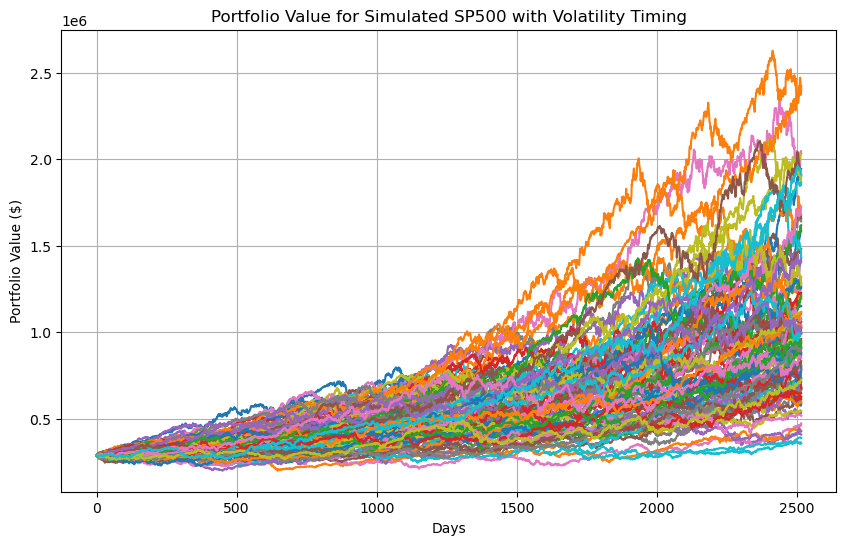

In [108]:
# Plot portfolio values (for example, showing the first few paths)
plt.figure(figsize=(10, 6))
for i in range(100):  # Plot the first 10 paths as an example
    plt.plot(np.arange(simulated_risky_ret_daily_sp500.shape[0]), portfolio_value[:, i], label=f"Path {i+1}")
plt.title("Portfolio Value for Simulated SP500 with Volatility Timing")
plt.xlabel("Days")
plt.ylabel("Portfolio Value ($)")
plt.grid(True)
plt.show()

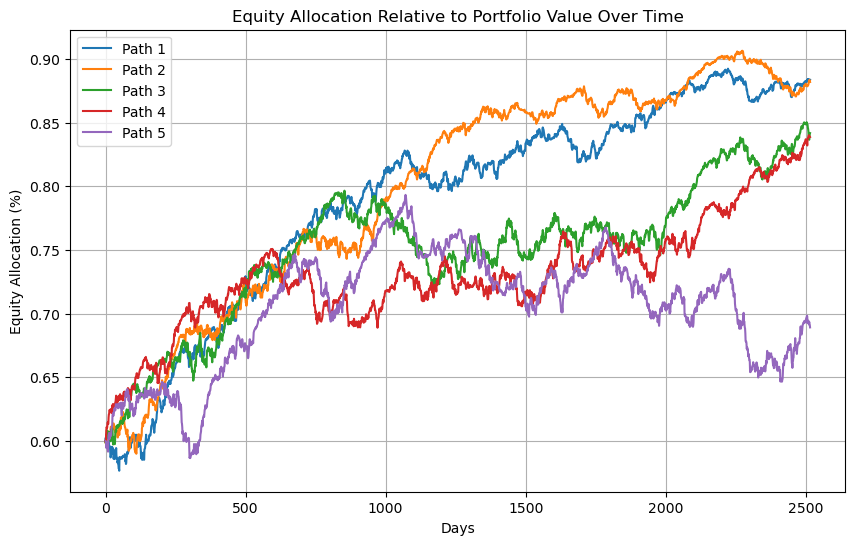

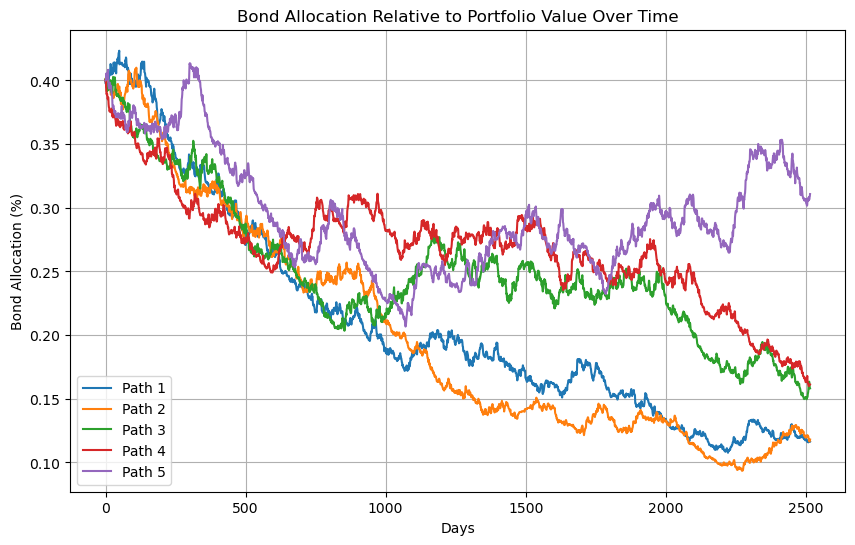

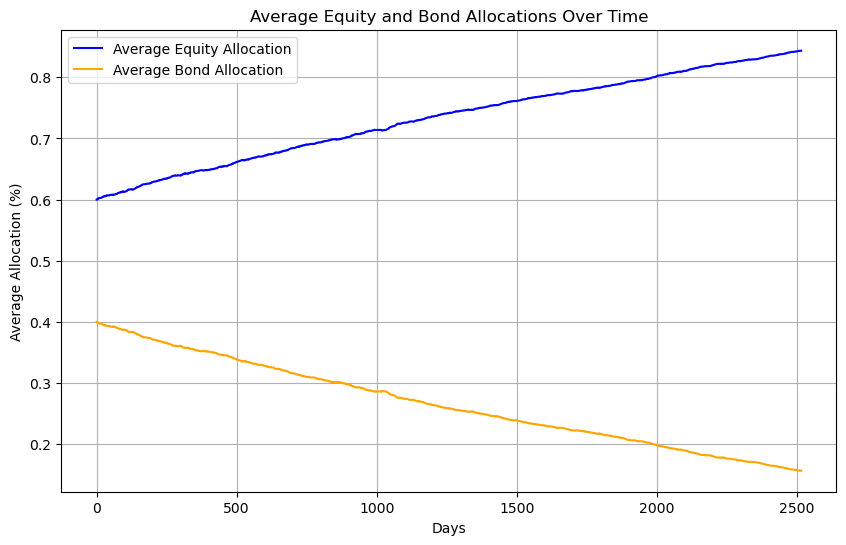

In [109]:
# Calculate the equity allocation at each point in time as a proportion of the total portfolio value
equity_allocation_time = equity_value / portfolio_value  # Proportion of equity in the portfolio for each time step
bond_allocation_time = bond_value / portfolio_value  # Proportion of bond in the portfolio for each time step

# Plot the equity allocation over time for all paths
plt.figure(figsize=(10, 6))
for i in range(5):  # Show first 10 paths as an example
    plt.plot(np.arange(n_days), equity_allocation_time[:, i], label=f"Path {i+1}")
plt.title("Equity Allocation Relative to Portfolio Value Over Time")
plt.xlabel("Days")
plt.ylabel("Equity Allocation (%)")
plt.legend()
plt.grid(True)
plt.show()

# Plot the bond allocation over time for all paths
plt.figure(figsize=(10, 6))
for i in range(5):  # Show first 10 paths as an example
    plt.plot(np.arange(n_days), bond_allocation_time[:, i], label=f"Path {i+1}")
plt.title("Bond Allocation Relative to Portfolio Value Over Time")
plt.xlabel("Days")
plt.ylabel("Bond Allocation (%)")
plt.legend()
plt.grid(True)
plt.show()

# Average allocation over time for equity and bond
average_equity_alloc = np.mean(equity_allocation_time, axis=1)  # Average equity allocation over all paths
average_bond_alloc = np.mean(bond_allocation_time, axis=1)  # Average bond allocation over all paths

# Plot the average equity and bond allocations over time
plt.figure(figsize=(10, 6))
plt.plot(np.arange(n_days), average_equity_alloc, label="Average Equity Allocation", color='blue')
plt.plot(np.arange(n_days), average_bond_alloc, label="Average Bond Allocation", color='orange')
plt.title("Average Equity and Bond Allocations Over Time")
plt.xlabel("Days")
plt.ylabel("Average Allocation (%)")
plt.legend()
plt.grid(True)
plt.show()

In [205]:
print(portfolio_value[-1,:].mean())

1032261.9239848095


In [207]:
print(portfolio_value[-1,:].std())

444784.8818986032


In [209]:
##### End vol timing #####
##########################

In [72]:
# total_value = sum(savings_pv)  # Total value of your savings

# # Define the weight range (from 0 to 1, with 0.1 steps)
# weights = np.arange(0.0, 1.1, 0.1)

# portfolio_results = {}
# weight_tracking = {}

# # Loop through each weight allocation
# for risky_percentage in weights:
#     safe_percentage = 1 - risky_percentage

#     # Risky portfolio initial investment
#     risky_initial_investment = total_value * risky_percentage

#     # Safe portfolio initial investment
#     safe_initial_investment = total_value * safe_percentage

#     # Calculate risky portfolio value over time
#     risky_portfolio_value = risky_initial_investment * (1 + np.array(simulated_risky_ret_daily[5:])).cumprod()

#     # Calculate safe portfolio value over time
#     safe_portfolio_value = safe_initial_investment * (1 + np.array(simulated_safe_ret_daily)).cumprod()

#     # Combine both portfolios
#     combined_portfolio_value = np.array(risky_portfolio_value) + np.array(safe_portfolio_value)

#     # Track the weight of the risky portfolio relative to the combined portfolio value over time
#     risky_weight = risky_portfolio_value / combined_portfolio_value

#     # Store the combined portfolio value and risky weight for this weight allocation
#     portfolio_results[risky_percentage] = combined_portfolio_value
#     weight_tracking[risky_percentage] = risky_weight

# # Create time in years (assuming daily data, 252 trading days per year)
# time_years = np.arange(0, len(risky_portfolio_value)) / 252

# # Plot the portfolio values for different allocations
# plt.figure(figsize=(12, 8))
# for risky_percentage, combined_portfolio_value in portfolio_results.items():
#     plt.plot(time_years, combined_portfolio_value, label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

# plt.title("Portfolio Value Over Time for Different Allocations")
# plt.xlabel("Time (Years)")
# plt.ylabel("Portfolio Value ($)")
# plt.grid(True)
# plt.legend(title="Allocation", loc="upper left", fontsize=8)
# plt.tight_layout()
# plt.show()

# # Plot the risky portfolio weight relative to the combined portfolio value
# plt.figure(figsize=(12, 8))
# for risky_percentage, risky_weight in weight_tracking.items():
#     plt.plot(time_years, risky_weight, label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

# plt.title("Risky Portfolio Weight Relative to Combined Portfolio Value Over Time")
# plt.xlabel("Time (Years)")
# plt.ylabel("Risky Portfolio Weight (%)")
# plt.grid(True)
# plt.legend(title="Allocation", loc="upper left", fontsize=8)
# plt.tight_layout()
# plt.show()

# # Print final values for each allocation
# print("Final Portfolio Values for Different Allocations:")
# for risky_percentage, combined_portfolio_value in portfolio_results.items():
#     print(f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}% -> Final Value: ${combined_portfolio_value[-1]:.2f}")

In [73]:
# Define fixed cash flows for different categories
savings_cashflows = 25000 * np.ones(20)  # 20 payments of 25,000 (savings)
essential_goals_cashflows = 20000 * np.ones(20)  # 20 payments of 20,000 (essential goals)
aspirational_goals_cashflows = 50000 * np.ones(20)  # 20 payments of 50,000 (aspirational goals)

num_cashflows = len(savings_cashflows)

num_simulations, num_days, num_maturities = P_t_T_all.shape  # Extract dimensions

# Define yearly maturities (original grid)
yearly_maturities = np.linspace(10, 30, num_maturities)  # Assuming maturities are equally spaced

# Pre-allocate PV array for savings, essential goals, and aspirational goals
savings_pv = np.zeros((num_simulations, num_days))
essential_goals_pv = np.zeros((num_simulations, num_days))
aspirational_goals_pv = np.zeros((num_simulations, num_days))

# Loop over each time step to interpolate and discount properly
for i in range(0, num_days):  
    # Compute decreasing daily maturities from 10 years minus i/252 (approx. daily step)
    daily_maturities = np.linspace(10 - i / 252, 30 - i / 252, num_cashflows)

    # Initialize arrays to store interpolated discount factors for each goal category
    interpolated_savings_discounts = np.zeros((num_simulations, num_cashflows))
    interpolated_essential_goals_discounts = np.zeros((num_simulations, num_cashflows))
    interpolated_aspirational_goals_discounts = np.zeros((num_simulations, num_cashflows))

    for sim in range(num_simulations):
        # Interpolation function for savings
        interpolator = interp1d(
            yearly_maturities,  # Original maturities
            P_t_T_all[sim, i, :],  # Discount factors for this sim & time
            kind='linear',  # Linear interpolation
            bounds_error=False,  # Avoid extrapolation
            fill_value="extrapolate"  # Optional: Prevents issues if extrapolation is needed
        )

        # Interpolate discount factors for each category of cash flow
        interpolated_savings_discounts[sim, :] = interpolator(daily_maturities)
        interpolated_essential_goals_discounts[sim, :] = interpolator(daily_maturities)
        interpolated_aspirational_goals_discounts[sim, :] = interpolator(daily_maturities)

    # Compute present values of cash flows for each category
    savings_pv[:, i] = np.sum(interpolated_savings_discounts * savings_cashflows, axis=1)
    essential_goals_pv[:, i] = np.sum(interpolated_essential_goals_discounts * essential_goals_cashflows, axis=1)
    aspirational_goals_pv[:, i] = np.sum(interpolated_aspirational_goals_discounts * aspirational_goals_cashflows, axis=1)

# Compute mean present values across simulations for each category
savings_pv_mean = savings_pv.mean(axis=0)
essential_goals_pv_mean = essential_goals_pv.mean(axis=0)
aspirational_goals_pv_mean = aspirational_goals_pv.mean(axis=0)

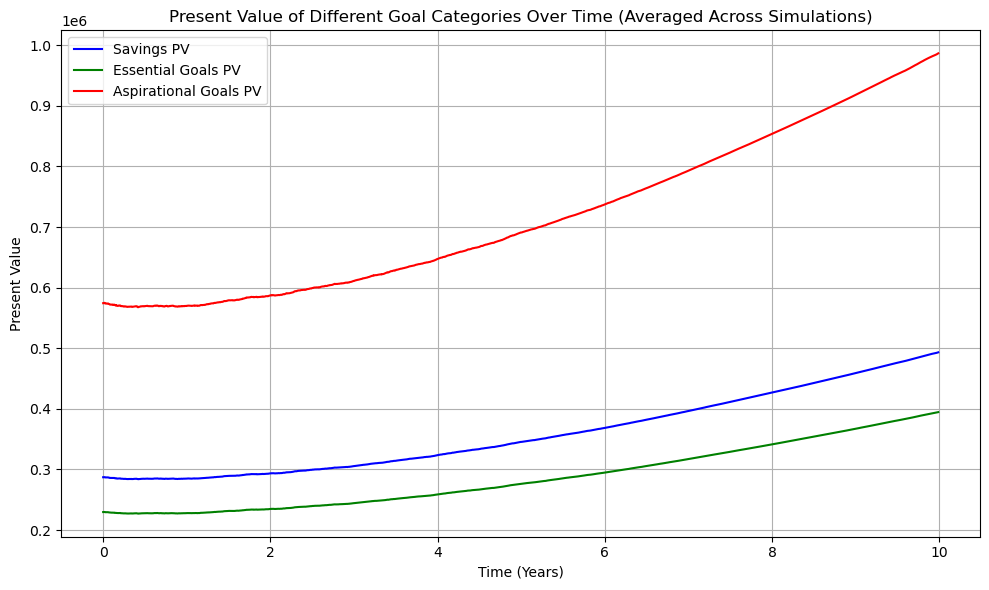

In [74]:
# Time axis in years
time_years = np.arange(num_days) / 252  # Convert days to years (assuming 252 trading days in a year)

# Plot results
plt.figure(figsize=(10, 6))
plt.plot(time_years, savings_pv_mean, label="Savings PV", color='blue')
plt.plot(time_years, essential_goals_pv_mean, label="Essential Goals PV", color='green')
plt.plot(time_years, aspirational_goals_pv_mean, label="Aspirational Goals PV", color='red')

plt.title("Present Value of Different Goal Categories Over Time (Averaged Across Simulations)")
plt.xlabel("Time (Years)")
plt.ylabel("Present Value")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

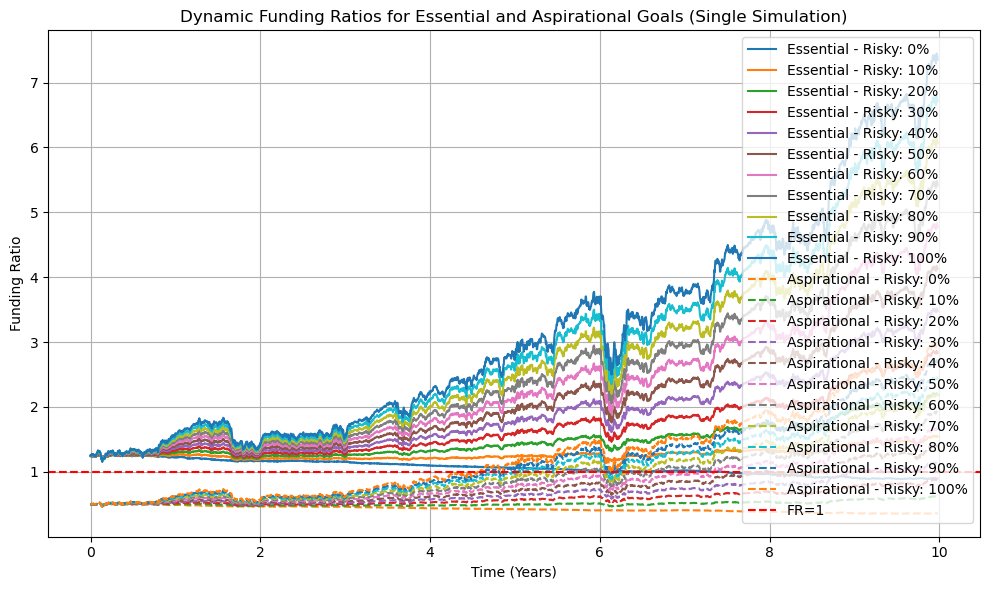

In [75]:
# Initialize dictionaries for funding ratios
funding_ratios_essential = {}
funding_ratios_aspirational = {}

funding_diff_essential = {}
funding_diff_aspirational = {}

avg_funding_ratios_essential = {}  # Initialize the dictionary to store average funding ratios
avg_funding_ratios_aspirational = {}  # Initialize the dictionary to store average funding ratios

# Ensure essential and aspirational PVs are 2D arrays
essential_pv = np.asarray(essential_goals_pv)  # Shape: (n_simulations, n_days)
aspirational_pv = np.asarray(aspirational_goals_pv)  # Shape: (n_simulations, n_days)

n_simulations, n_days = essential_pv.shape

# Compute funding ratios efficiently for each weight allocation
for risky_percentage in weights:
    # Extract and transpose portfolio values (Shape: (n_simulations, n_days))
    portfolio_value = portfolio_results[risky_percentage]

    # Ensure consistent length across arrays
    min_length = min(portfolio_value.shape[1], n_days)

    # Use NumPy broadcasting for efficient element-wise division
    funding_ratios_essential[risky_percentage] = portfolio_value[:, :min_length] / essential_pv[:, :min_length]
    funding_ratios_aspirational[risky_percentage] = portfolio_value[:, :min_length] / aspirational_pv[:, :min_length]

    funding_diff_essential[risky_percentage] = np.abs(portfolio_value[:, :min_length] - essential_pv[:, :min_length]) / essential_pv[:, :min_length]
    funding_diff_aspirational[risky_percentage] = np.abs(portfolio_value[:, :min_length] - aspirational_pv[:, :min_length]) / aspirational_pv[:, :min_length]

    # Compute the average funding ratios across all simulations at each time point
    avg_funding_ratios_essential[risky_percentage] = np.mean(funding_ratios_essential[risky_percentage], axis=0)
    avg_funding_ratios_aspirational[risky_percentage] = np.mean(funding_ratios_aspirational[risky_percentage], axis=0)

# Convert time to years
time_years = np.arange(min_length) / 252

# Choose a simulation index for visualization
simulation_index = 0  # Adjust index to view different simulations

# Plot funding ratios
plt.figure(figsize=(10, 6))

# Plot Essential Goal Funding Ratios
for risky_percentage, funding_ratio in funding_ratios_essential.items():
    plt.plot(time_years, funding_ratio[simulation_index, :], label=f"Essential - Risky: {risky_percentage*100:.0f}%")

# Plot Aspirational Goal Funding Ratios (Dashed Line Style)
for risky_percentage, funding_ratio in funding_ratios_aspirational.items():
    plt.plot(time_years, funding_ratio[simulation_index, :], linestyle='dashed', label=f"Aspirational - Risky: {risky_percentage*100:.0f}%")

# Formatting the plot
plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (Single Simulation)")
plt.xlabel("Time (Years)")
plt.ylabel("Funding Ratio")
plt.axhline(y=1, color='red', linestyle='--', label='FR=1')  # Reference line at FR=1
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

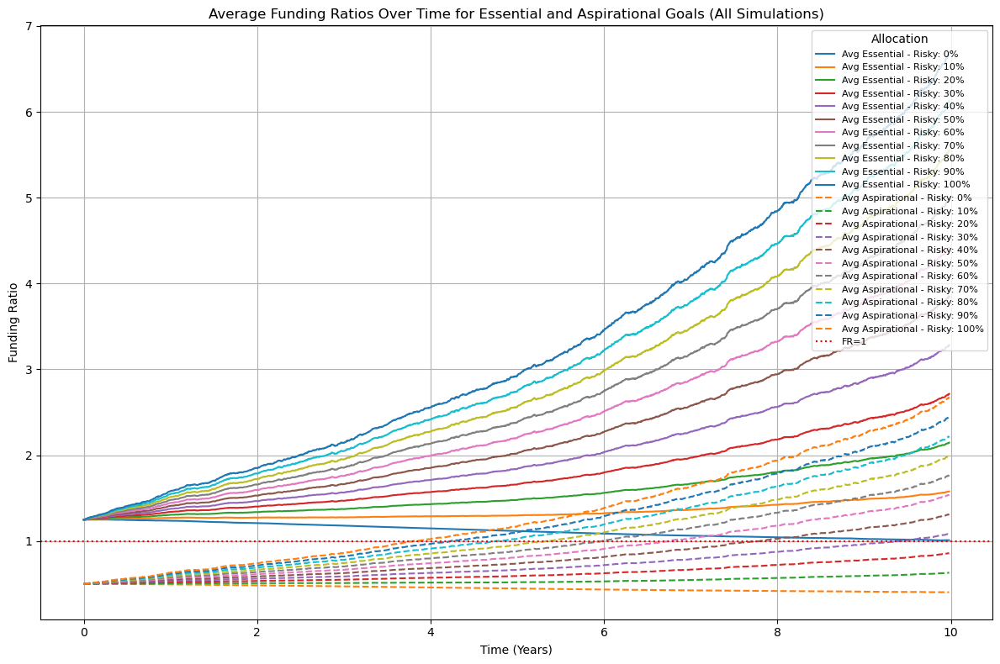

In [76]:
# Plot the average funding ratio paths
plt.figure(figsize=(12, 8))

# Plot Average Essential Goal Funding Ratios over time for each allocation
for risky_percentage, avg_funding_ratio in avg_funding_ratios_essential.items():
    plt.plot(time_years, avg_funding_ratio, label=f"Avg Essential - Risky: {risky_percentage*100:.0f}%")

# Plot Average Aspirational Goal Funding Ratios over time (Dashed Line Style)
for risky_percentage, avg_funding_ratio in avg_funding_ratios_aspirational.items():
    plt.plot(time_years, avg_funding_ratio, linestyle='dashed', label=f"Avg Aspirational - Risky: {risky_percentage*100:.0f}%")

# Formatting the plot
plt.title("Average Funding Ratios Over Time for Essential and Aspirational Goals (All Simulations)")
plt.xlabel("Time (Years)")
plt.ylabel("Funding Ratio")
plt.axhline(y=1, color='red', linestyle=':', label='FR=1')  # Reference line at FR=1
plt.grid(True)
plt.legend(title="Allocation", loc="upper right", fontsize=8)
plt.tight_layout()
plt.show()

In [77]:
# Initialize dictionaries to store the funding ratios at the final day and probabilities
final_funding_ratios_essential = {}
final_funding_ratios_aspirational = {}
probability_above_1_essential = {}
probability_above_1_aspirational = {}

# Loop through each weight allocation to extract funding ratios at the final day
for risky_percentage in weights:
    # Extract portfolio value and funding ratios
    portfolio_value = portfolio_results[risky_percentage]
    
    # Ensure consistent length across arrays
    min_length = min(portfolio_value.shape[1], n_days)
    
    # Calculate funding ratios at the final day (last time point)
    final_funding_ratios_essential[risky_percentage] = funding_ratios_essential[risky_percentage][:, -1]
    final_funding_ratios_aspirational[risky_percentage] = funding_ratios_aspirational[risky_percentage][:, -1]
    
    # Calculate the probability of the funding ratio being greater than 1 at the final day
    probability_above_1_essential[risky_percentage] = np.mean(final_funding_ratios_essential[risky_percentage] > 1)
    probability_above_1_aspirational[risky_percentage] = np.mean(final_funding_ratios_aspirational[risky_percentage] > 1)

# Optionally, print the probabilities
print("Probability of Funding Ratio > 1 (Essential Goals):")
print(probability_above_1_essential)

print("Probability of Funding Ratio > 1 (Aspirational Goals):")
print(probability_above_1_aspirational)

Probability of Funding Ratio > 1 (Essential Goals):
{0.0: 0.48, 0.1: 0.99, 0.2: 0.99, 0.30000000000000004: 0.99, 0.4: 0.99, 0.5: 0.99, 0.6000000000000001: 0.99, 0.7000000000000001: 0.99, 0.8: 0.99, 0.9: 0.99, 1.0: 0.99}
Probability of Funding Ratio > 1 (Aspirational Goals):
{0.0: 0.0, 0.1: 0.01, 0.2: 0.29, 0.30000000000000004: 0.5, 0.4: 0.65, 0.5: 0.77, 0.6000000000000001: 0.81, 0.7000000000000001: 0.83, 0.8: 0.85, 0.9: 0.85, 1.0: 0.85}


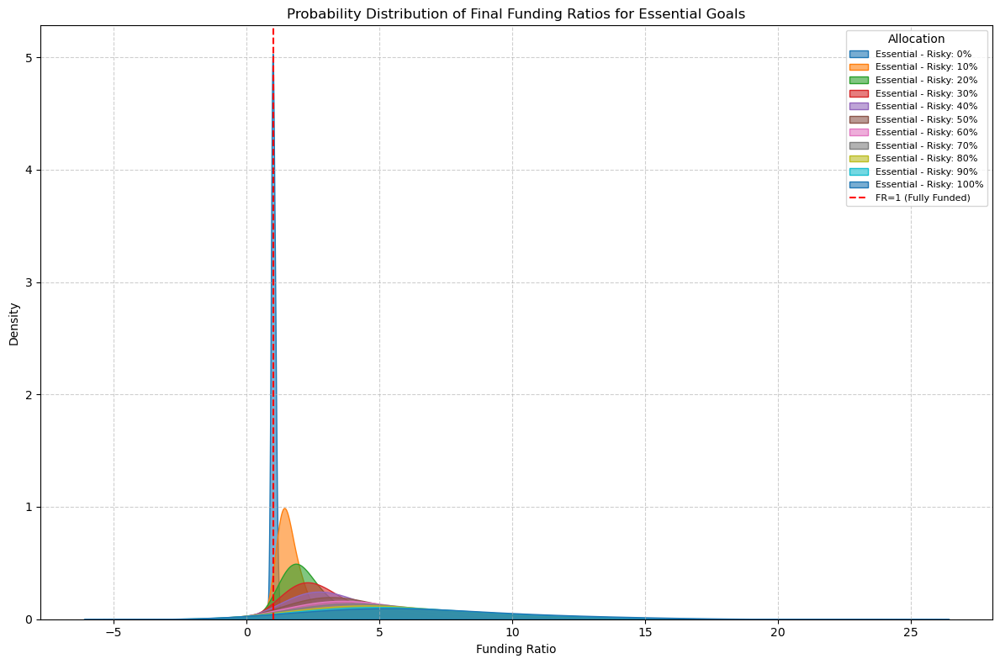

Summary of Final Funding Ratios:
Risky: 0% -> Essential: Mean: 1.01, Std Dev: 0.07
Risky: 10% -> Essential: Mean: 1.58, Std Dev: 0.37
Risky: 20% -> Essential: Mean: 2.15, Std Dev: 0.75
Risky: 30% -> Essential: Mean: 2.71, Std Dev: 1.13
Risky: 40% -> Essential: Mean: 3.28, Std Dev: 1.50
Risky: 50% -> Essential: Mean: 3.85, Std Dev: 1.88
Risky: 60% -> Essential: Mean: 4.42, Std Dev: 2.26
Risky: 70% -> Essential: Mean: 4.99, Std Dev: 2.63
Risky: 80% -> Essential: Mean: 5.55, Std Dev: 3.01
Risky: 90% -> Essential: Mean: 6.12, Std Dev: 3.39
Risky: 100% -> Essential: Mean: 6.69, Std Dev: 3.77


In [78]:
# Plot the probability distribution (Density) of funding ratios at the final day for both essential and aspirational goals
plt.figure(figsize=(12, 8))

# Plot for Essential Goal Funding Ratios
for risky_percentage, funding_ratios in final_funding_ratios_essential.items():
    sns.kdeplot(funding_ratios, bw_adjust=1.5, fill=True, alpha=0.6, label=f"Essential - Risky: {risky_percentage*100:.0f}%")

# Formatting the plot
plt.title("Probability Distribution of Final Funding Ratios for Essential Goals")
plt.xlabel("Funding Ratio")
plt.ylabel("Density")
plt.axvline(x=1, color='red', linestyle='--', label='FR=1 (Fully Funded)')
plt.legend(title="Allocation", loc="upper right", fontsize=8)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# Summary statistics for funding ratios
print("Summary of Final Funding Ratios:")
for risky_percentage in weights:
    # Calculate mean and standard deviation for final funding ratios
    mean_essential = np.mean(final_funding_ratios_essential[risky_percentage])
    std_essential = np.std(final_funding_ratios_essential[risky_percentage])

    print(f"Risky: {risky_percentage*100:.0f}% -> Essential: Mean: {mean_essential:.2f}, Std Dev: {std_essential:.2f}")

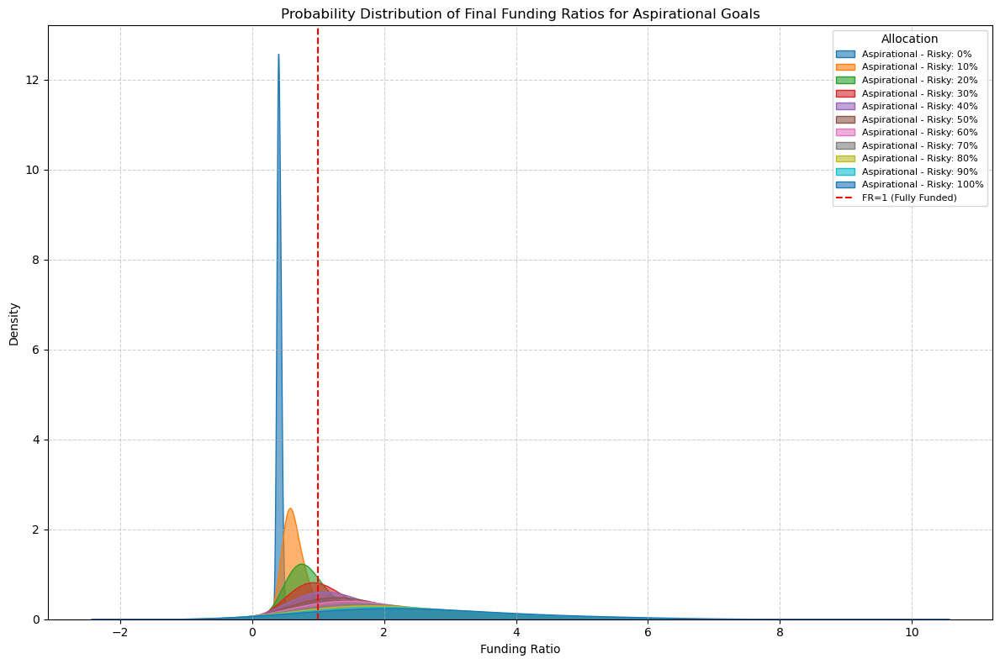

Summary of Final Funding Ratios:
Risky: 0% -> Aspirational: Mean: 0.40, Std Dev: 0.03
Risky: 10% -> Aspirational: Mean: 0.63, Std Dev: 0.15
Risky: 20% -> Aspirational: Mean: 0.86, Std Dev: 0.30
Risky: 30% -> Aspirational: Mean: 1.09, Std Dev: 0.45
Risky: 40% -> Aspirational: Mean: 1.31, Std Dev: 0.60
Risky: 50% -> Aspirational: Mean: 1.54, Std Dev: 0.75
Risky: 60% -> Aspirational: Mean: 1.77, Std Dev: 0.90
Risky: 70% -> Aspirational: Mean: 1.99, Std Dev: 1.05
Risky: 80% -> Aspirational: Mean: 2.22, Std Dev: 1.20
Risky: 90% -> Aspirational: Mean: 2.45, Std Dev: 1.36
Risky: 100% -> Aspirational: Mean: 2.68, Std Dev: 1.51


In [79]:
# Plot the probability distribution (Density) of funding ratios at the final day for both essential and aspirational goals
plt.figure(figsize=(12, 8))

# Plot for Aspirational Goal Funding Ratios
for risky_percentage, funding_ratios in final_funding_ratios_aspirational.items():
    sns.kdeplot(funding_ratios, bw_adjust=1.5, fill=True, alpha=0.6, label=f"Aspirational - Risky: {risky_percentage*100:.0f}%")

# Formatting the plot
plt.title("Probability Distribution of Final Funding Ratios for Aspirational Goals")
plt.xlabel("Funding Ratio")
plt.ylabel("Density")
plt.axvline(x=1, color='red', linestyle='--', label='FR=1 (Fully Funded)')
plt.legend(title="Allocation", loc="upper right", fontsize=8)
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

# Summary statistics for funding ratios
print("Summary of Final Funding Ratios:")
for risky_percentage in weights:
    # Calculate mean and standard deviation for final funding ratios
    mean_aspirational = np.mean(final_funding_ratios_aspirational[risky_percentage])
    std_aspirational = np.std(final_funding_ratios_aspirational[risky_percentage])

    print(f"Risky: {risky_percentage*100:.0f}% -> Aspirational: Mean: {mean_aspirational:.2f}, Std Dev: {std_aspirational:.2f}")

#### Older versions FR  

In [81]:
# funding_ratios_essential = {}
# funding_ratios_aspirational = {}

# # Convert essential and aspirational PVs to 2D arrays if they are not already
# essential_pv = np.array(essential_pv)  # Shape (n_simulations, time)
# aspirational_pv = np.array(aspirational_pv)  # Shape (n_simulations, time)

# # Ensure the shape consistency
# n_simulations, n_days = essential_pv.shape

# # Loop through each weight allocation
# for risky_percentage in weights:
    
#     # Extract portfolio values for all simulations
#     portfolio_value = np.array(portfolio_results[risky_percentage].iloc[:,:500])  # Shape (n_days, n_simulations)
#     portfolio_value = portfolio_value.T  # Now shape (n_simulations, n_days)
    
#     # Ensure the min length across all arrays
#     min_length = min(portfolio_value.shape[1], n_days)

#     # Compute funding ratios for all simulations at once
#     funding_ratio_essential = portfolio_value[:, :min_length] / essential_pv[:, :min_length]
#     funding_ratio_aspirational = portfolio_value[:, :min_length] / aspirational_pv[:, :min_length]

#     # Store in dictionary
#     funding_ratios_essential[risky_percentage] = funding_ratio_essential
#     funding_ratios_aspirational[risky_percentage] = funding_ratio_aspirational

# # Time in years
# time_years = np.arange(0, min_length) / 252

# # Select a specific simulation to plot
# simulation_index = 5  # Change this index to visualize different simulations

# # Plot funding ratios
# plt.figure(figsize=(10, 6))

# for risky_percentage, funding_ratio in funding_ratios_essential.items():
#     plt.plot(time_years, funding_ratio[simulation_index, :], label=f"Essential - Risky: {risky_percentage*100:.0f}%")

# for risky_percentage, funding_ratio in funding_ratios_aspirational.items():
#     plt.plot(time_years, funding_ratio[simulation_index, :], linestyle='dashed', label=f"Aspirational - Risky: {risky_percentage*100:.0f}%")

# plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (Single Simulation)")
# plt.xlabel("Time (Years)")
# plt.ylabel("Funding Ratio")
# plt.grid(True)
# plt.axhline(y=1, color='red', linestyle='--', label='FR=1')
# plt.legend()
# plt.tight_layout()
# plt.show()

In [82]:
# funding_ratios_essential = {}
# funding_ratios_aspirational = {}

# # Loop through each weight allocation
# for risky_percentage in weights:
    
#     funding_ratio_essential = []
#     funding_ratio_aspirational = []
    
#     for sim in range(n_simulations):
#         portfolio_value = portfolio_results[risky_percentage].iloc[:, sim]  # Select simulation-specific portfolio values
#         min_length = min(len(portfolio_value), len(essential_pv), len(aspirational_pv))
        
#         funding_ratio_essential.append(portfolio_value[:min_length] / essential_pv[:min_length])
#         funding_ratio_aspirational.append(portfolio_value[:min_length] / aspirational_pv[:min_length])
    
#     funding_ratios_essential[risky_percentage] = np.array(funding_ratio_essential)
#     funding_ratios_aspirational[risky_percentage] = np.array(funding_ratio_aspirational)

# # Time in years
# time_years = np.arange(0, len(essential_pv)) / 252

# # Select a specific simulation to plot
# simulation_index = 5  # Change this index to visualize different simulations

# # Plot funding ratios
# plt.figure(figsize=(10, 6))
# for risky_percentage, funding_ratio in funding_ratios_essential.items():
#     plt.plot(time_years[:funding_ratio.shape[1]], funding_ratio[simulation_index], label=f"Essential - Risky: {risky_percentage*100:.0f}%")
# for risky_percentage, funding_ratio in funding_ratios_aspirational.items():
#     plt.plot(time_years[:funding_ratio.shape[1]], funding_ratio[simulation_index], label=f"Aspirational - Risky: {risky_percentage*100:.0f}%")
# plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (Single Simulation)")
# plt.xlabel("Time (Years)")
# plt.ylabel("Funding Ratio")
# plt.grid(True)
# plt.axhline(y=1, color='red', linestyle='--', label='FR=1')
# #plt.legend()
# plt.tight_layout()
# plt.show()

In [83]:
# funding_ratio_essential = []
# funding_ratio_aspirational = []

# # Get the corresponding portfolio value for the given risky percentage
# portfolio_value = portfolio_results[0]
    
# # Ensure that the length of portfolio_value matches the length of essential_pv and aspirational_pv
# min_length = min(len(portfolio_value), len(essential_pv), len(aspirational_pv))  # Limit to the shortest length
    
# for i in range(min_length):
#     funding_ratio_essential.append(portfolio_value[i] / essential_pv[i])
#     funding_ratio_aspirational.append(portfolio_value[i] / aspirational_pv[i])

# # Convert results to numpy arrays or pandas DataFrames for further analysis
# funding_ratio_essential = np.array(funding_ratio_essential)
# funding_ratio_aspirational = np.array(funding_ratio_aspirational)

# time_years = np.arange(0, len(funding_ratio_essential)) / 252

# # Optionally, plot the funding ratios over time (for all days)
# plt.figure(figsize=(10, 6))
# plt.plot(time_years, funding_ratio_essential, label="Funding Ratio - Essential")
# plt.plot(time_years, funding_ratio_aspirational, label="Funding Ratio - Aspirational")
# plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (for each day, starting in 2014)")
# plt.xlabel("Time (Years)")
# plt.ylabel("Funding Ratio")
# plt.grid(True)
# plt.legend()
# plt.tight_layout()
# plt.show()

In [84]:
# # Initialize the plot
# plt.figure(figsize=(10, 6))

# # Loop through each risky percentage in portfolio_results
# for risky_percentage in portfolio_results.keys():
#     # Get the corresponding portfolio value for the given risky percentage
#     portfolio_value = portfolio_results[risky_percentage]
    
#     # Ensure that the length of portfolio_value matches the length of essential_pv and aspirational_pv
#     min_length = min(len(portfolio_value), len(essential_pv), len(aspirational_pv))  # Limit to the shortest length
    
#     # Initialize temporary lists for funding ratios for this risky percentage
#     temp_funding_ratio_essential = []
#     temp_funding_ratio_aspirational = []
    
#     # Calculate funding ratios for essential and aspirational goals
#     for i in range(min_length):
#         if essential_pv[i] != 0:  # Avoid division by zero
#             temp_funding_ratio_essential.append(portfolio_value[i] / essential_pv[i])
#         else:
#             temp_funding_ratio_essential.append(np.nan)  # Handle division by zero if essential_pv is zero
        
#         if aspirational_pv[i] != 0:  # Avoid division by zero
#             temp_funding_ratio_aspirational.append(portfolio_value[i] / aspirational_pv[i])
#         else:
#             temp_funding_ratio_aspirational.append(np.nan)  # Handle division by zero if aspirational_pv is zero
    
#     # Convert to numpy arrays for plotting
#     temp_funding_ratio_essential = np.array(temp_funding_ratio_essential)
#     temp_funding_ratio_aspirational = np.array(temp_funding_ratio_aspirational)

#     time_years = np.arange(0, len(temp_funding_ratio_essential)) / 252
    
#     # Plot the funding ratios for essential and aspirational goals as separate lines for each risky percentage
#     plt.plot(time_years, temp_funding_ratio_essential, label=f"Essential - Risk {risky_percentage*100:.2f}%")
#     plt.plot(time_years, temp_funding_ratio_aspirational, label=f"Aspirational - Risk {risky_percentage*100:.2f}%")

#     #print(temp_funding_ratio_aspirational[-1])

# # Add title, labels, and legend
# plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (for each day, starting from 2014)")
# plt.xlabel("Time (Years)")
# plt.ylabel("Funding Ratio")
# plt.grid(True)
# plt.axhline(y=1, color='red', linestyle='--', label='FR=1')
# #plt.legend()
# plt.tight_layout()

# # Show the plot
# plt.show()

In [85]:
# # Initialize a dictionary to store tracking errors for each risky percentage
# tracking_errors_essential = {}
# tracking_errors_aspirational = {}

# # Loop through each risky percentage in portfolio_results
# for risky_percentage in portfolio_results.keys():
#     # Get the corresponding portfolio value for the given risky percentage
#     portfolio_value = portfolio_results[risky_percentage]
    
#     # Ensure that the length of portfolio_value matches the length of essential_pv and aspirational_pv
#     min_length = min(len(portfolio_value), len(essential_pv), len(aspirational_pv))  # Limit to the shortest length
    
#     # Initialize temporary lists for funding ratios for this risky percentage
#     temp_funding_ratio_essential = []
#     temp_funding_ratio_aspirational = []
    
#     # Calculate funding ratios for essential and aspirational goals
#     for i in range(min_length):
#         if essential_pv[i] != 0:  # Avoid division by zero
#             temp_funding_ratio_essential.append(portfolio_value[i] / essential_pv[i])
#         else:
#             temp_funding_ratio_essential.append(np.nan)  # Handle division by zero if essential_pv is zero
        
#         if aspirational_pv[i] != 0:  # Avoid division by zero
#             temp_funding_ratio_aspirational.append(portfolio_value[i] / aspirational_pv[i])
#         else:
#             temp_funding_ratio_aspirational.append(np.nan)  # Handle division by zero if aspirational_pv is zero
    
#     # Convert to numpy arrays for easy manipulation
#     temp_funding_ratio_essential = np.array(temp_funding_ratio_essential)
#     temp_funding_ratio_aspirational = np.array(temp_funding_ratio_aspirational)
    
#     # Calculate the daily change in funding ratios
#     change_essential = np.diff(temp_funding_ratio_essential)  # Difference between consecutive days
#     change_aspirational = np.diff(temp_funding_ratio_aspirational)  # Difference between consecutive days
    
#     # Calculate the tracking error for essential and aspirational funding ratios (standard deviation of changes)
#     tracking_error_essential = np.std(change_essential)
#     tracking_error_aspirational = np.std(change_aspirational)
    
#     # Store the tracking errors for this risky percentage
#     tracking_errors_essential[risky_percentage] = tracking_error_essential
#     tracking_errors_aspirational[risky_percentage] = tracking_error_aspirational

# # Plot the tracking errors for essential and aspirational funding ratios
# plt.figure(figsize=(10, 6))
# plt.plot(list(tracking_errors_essential.keys()), list(tracking_errors_essential.values()), label="Tracking Error - Essential", marker='o')
# plt.plot(list(tracking_errors_aspirational.keys()), list(tracking_errors_aspirational.values()), label="Tracking Error - Aspirational", marker='o')

# # Add title, labels, and legend
# plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
# plt.xlabel("Risky Percentage")
# plt.ylabel("Tracking Error")
# plt.grid(True)
# plt.legend()
# plt.tight_layout()

# # Show the plot
# plt.show()

#### Stop

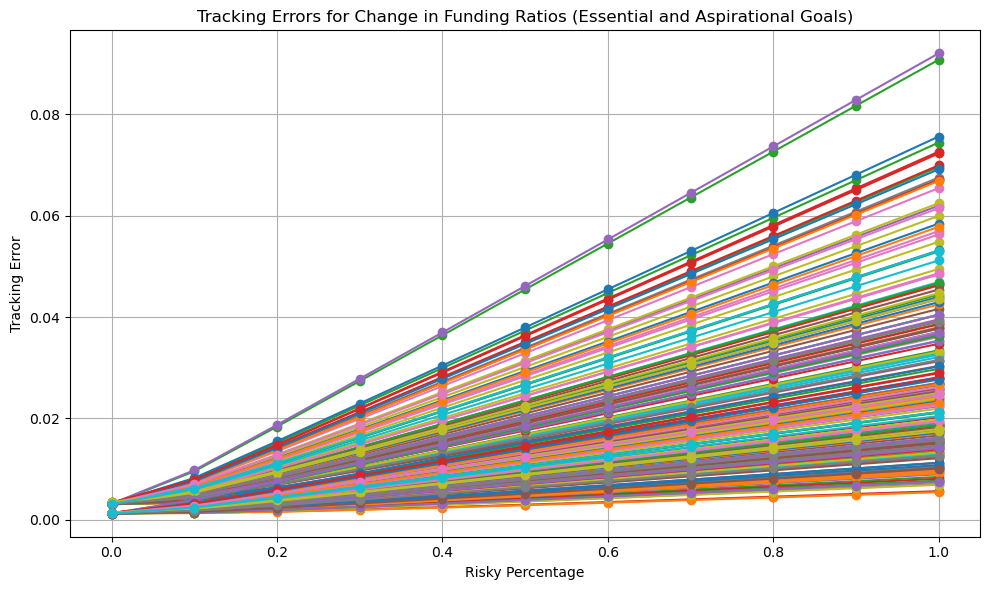

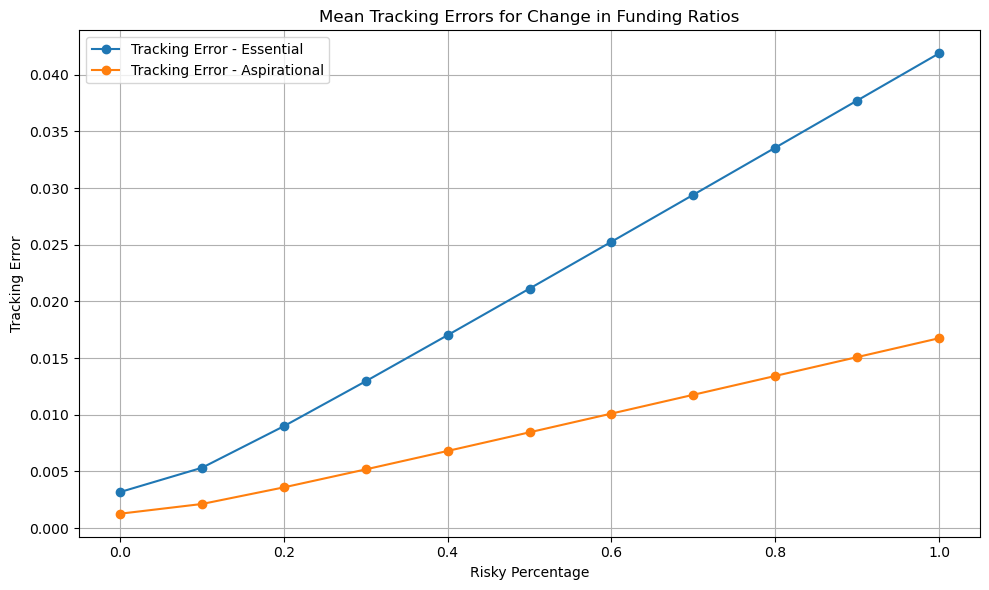

In [87]:
# Initialize dictionaries
tracking_errors_essential = {}
tracking_errors_aspirational = {}

# Compute tracking errors efficiently for each weight allocation
for risky_percentage in weights:
    # Compute funding ratio changes (returns)
    change_essential = np.diff(funding_ratios_essential[risky_percentage], axis=1)  # Shape (n_simulations, n_days - 1)
    change_aspirational = np.diff(funding_ratios_aspirational[risky_percentage], axis=1)

    change_essential = np.diff(funding_ratios_essential[risky_percentage], axis=1)  # Shape (n_simulations, n_days - 1)
    change_aspirational = np.diff(funding_ratios_aspirational[risky_percentage], axis=1)
    
    # Compute tracking errors (std dev of changes)
    tracking_errors_essential[risky_percentage] = np.nanstd(change_essential, axis=1)  # Shape (n_simulations,)
    tracking_errors_aspirational[risky_percentage] = np.nanstd(change_aspirational, axis=1)

# Convert to lists for plotting
risk_levels = list(tracking_errors_essential.keys())

# Compute mean tracking errors for visualization
mean_te_essential = [np.mean(te) for te in tracking_errors_essential.values()]
mean_te_aspirational = [np.mean(te) for te in tracking_errors_aspirational.values()]

# Plot tracking errors
plt.figure(figsize=(10, 6))
plt.plot(list(tracking_errors_essential.keys()), [te for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
plt.plot(list(tracking_errors_aspirational.keys()), [te for te in tracking_errors_aspirational.values()], label="Tracking Error - Aspirational", marker='o')
plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot individual tracking errors per risky percentage
plt.figure(figsize=(10, 6))
plt.plot(risk_levels, mean_te_essential, label="Tracking Error - Essential", marker='o')
plt.plot(risk_levels, mean_te_aspirational, label="Tracking Error - Aspirational", marker='o')
plt.title("Mean Tracking Errors for Change in Funding Ratios")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

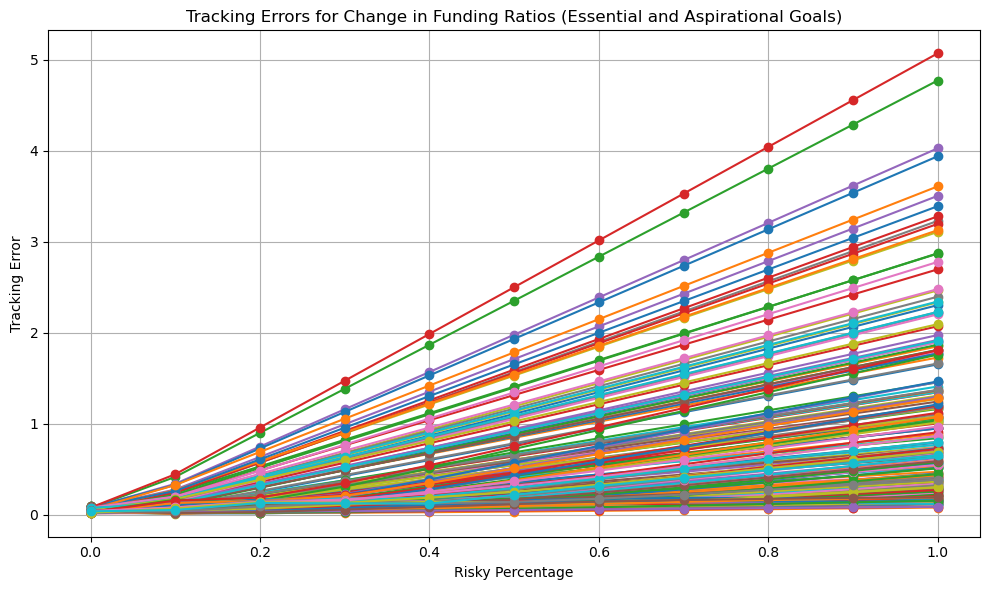

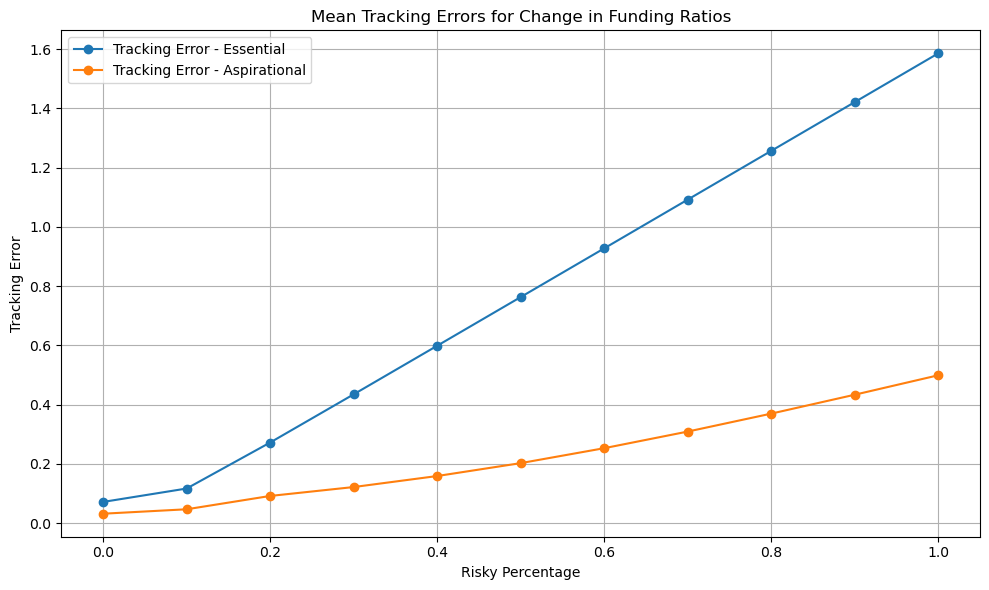

In [88]:
# Initialize dictionaries
tracking_errors_essential = {}
tracking_errors_aspirational = {}

# Compute tracking errors efficiently for each weight allocation
for risky_percentage in weights:
    
    change_essential = funding_diff_essential[risky_percentage]  # Shape (n_simulations, n_days - 1)
    change_aspirational = funding_diff_aspirational[risky_percentage]
    
    # Compute tracking errors (std dev of changes)
    tracking_errors_essential[risky_percentage] = np.nanstd(change_essential, axis=1)  # Shape (n_simulations,)
    tracking_errors_aspirational[risky_percentage] = np.nanstd(change_aspirational, axis=1)

# Convert to lists for plotting
risk_levels = list(tracking_errors_essential.keys())

# Compute mean tracking errors for visualization
mean_te_essential = [np.mean(te) for te in tracking_errors_essential.values()]
mean_te_aspirational = [np.mean(te) for te in tracking_errors_aspirational.values()]

# Plot tracking errors
plt.figure(figsize=(10, 6))
plt.plot(list(tracking_errors_essential.keys()), [te for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
plt.plot(list(tracking_errors_aspirational.keys()), [te for te in tracking_errors_aspirational.values()], label="Tracking Error - Aspirational", marker='o')
plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot individual tracking errors per risky percentage
plt.figure(figsize=(10, 6))
plt.plot(risk_levels, mean_te_essential, label="Tracking Error - Essential", marker='o')
plt.plot(risk_levels, mean_te_aspirational, label="Tracking Error - Aspirational", marker='o')
plt.title("Mean Tracking Errors for Change in Funding Ratios")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [89]:
# tracking_errors_essential = {}
# tracking_errors_aspirational = {}

# # Loop through each weight allocation
# for risky_percentage in weights:
#     # Initialize dictionaries for each risky percentage
#     tracking_errors_essential[risky_percentage] = []
#     tracking_errors_aspirational[risky_percentage] = []

#     for sim in range(n_simulations):
#         # Compute tracking errors
#         change_essential = np.diff(funding_ratios_essential[risky_percentage][sim], axis=0)
#         change_aspirational = np.diff(funding_ratios_aspirational[risky_percentage][sim], axis=0)

#         # Store tracking errors for each simulation
#         tracking_errors_essential[risky_percentage].append(np.nanstd(change_essential))
#         tracking_errors_aspirational[risky_percentage].append(np.nanstd(change_aspirational))

# # Time in years
# time_years = np.arange(0, len(essential_pv)) / 252

# # Select a specific simulation to plot
# simulation_index = 2  # Change this index to visualize different simulations

# # Plot tracking errors
# plt.figure(figsize=(10, 6))
# plt.plot(list(tracking_errors_essential.keys()), [te for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
# plt.plot(list(tracking_errors_aspirational.keys()), [te for te in tracking_errors_aspirational.values()], label="Tracking Error - Aspirational", marker='o')
# plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
# plt.xlabel("Risky Percentage")
# plt.ylabel("Tracking Error")
# plt.grid(True)
# #plt.legend()
# plt.tight_layout()
# plt.show()

# plt.figure(figsize=(10, 6))
# plt.plot(list(tracking_errors_essential.keys()), [np.mean(te) for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
# plt.plot(list(tracking_errors_aspirational.keys()), [np.mean(te) for te in tracking_errors_aspirational.values()], label="Tracking Error - Aspirational", marker='o')
# plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
# plt.xlabel("Risky Percentage")
# plt.ylabel("Tracking Error")
# plt.grid(True)
# plt.legend()
# plt.tight_layout()
# plt.show()

In [90]:
# # Extract risk levels
# risk_levels = list(tracking_errors_essential.keys())

# # Define number of bins
# num_bins = 30  

# # Loop through risk levels to plot histograms and compute statistics
# for risky_percentage in risk_levels[:4]:
#     # Compute mean and std for essential & aspirational tracking errors
#     mean_essential = np.mean(tracking_errors_essential[risky_percentage])
#     std_essential = np.std(tracking_errors_essential[risky_percentage])
    
#     mean_aspirational = np.mean(tracking_errors_aspirational[risky_percentage])
#     std_aspirational = np.std(tracking_errors_aspirational[risky_percentage])
    
#     # Plot histograms
#     plt.figure(figsize=(10, 6))
#     plt.hist(tracking_errors_essential[risky_percentage], bins=num_bins, alpha=0.5, color='blue', label=f"Essential (Mean: {mean_essential:.4f}, Std: {std_essential:.4f})", density=True)
#     plt.hist(tracking_errors_aspirational[risky_percentage], bins=num_bins, alpha=0.5, color='orange', label=f"Aspirational (Mean: {mean_aspirational:.4f}, Std: {std_aspirational:.4f})", density=True)
    
#     # Titles and labels
#     plt.xlabel("Tracking Error")
#     plt.ylabel("Density")
#     plt.title(f"Histogram of Tracking Errors (Risky Percentage: {risky_percentage*100:.0f}%)")
#     plt.legend()
#     plt.grid(True)
#     plt.show()
    
#     # Print summary statistics
#     print(f"Risky Percentage: {risky_percentage*100:.0f}%")
#     print(f"  Essential - Mean: {mean_essential:.4f}, Std: {std_essential:.4f}")
#     print(f"  Aspirational - Mean: {mean_aspirational:.4f}, Std: {std_aspirational:.4f}")
#     print("-" * 50)

### Fixed Mix

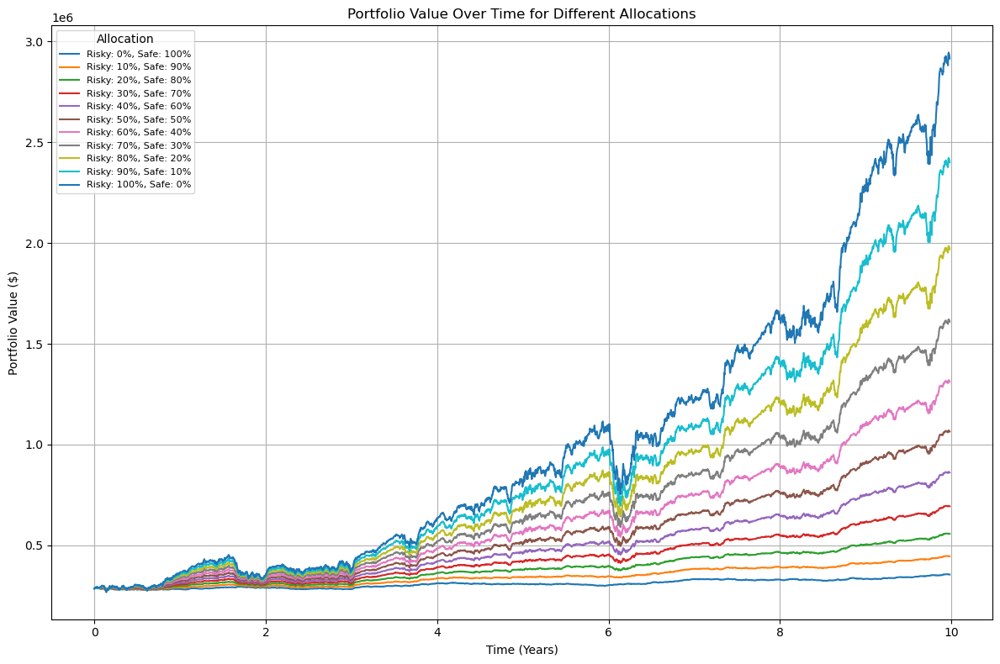

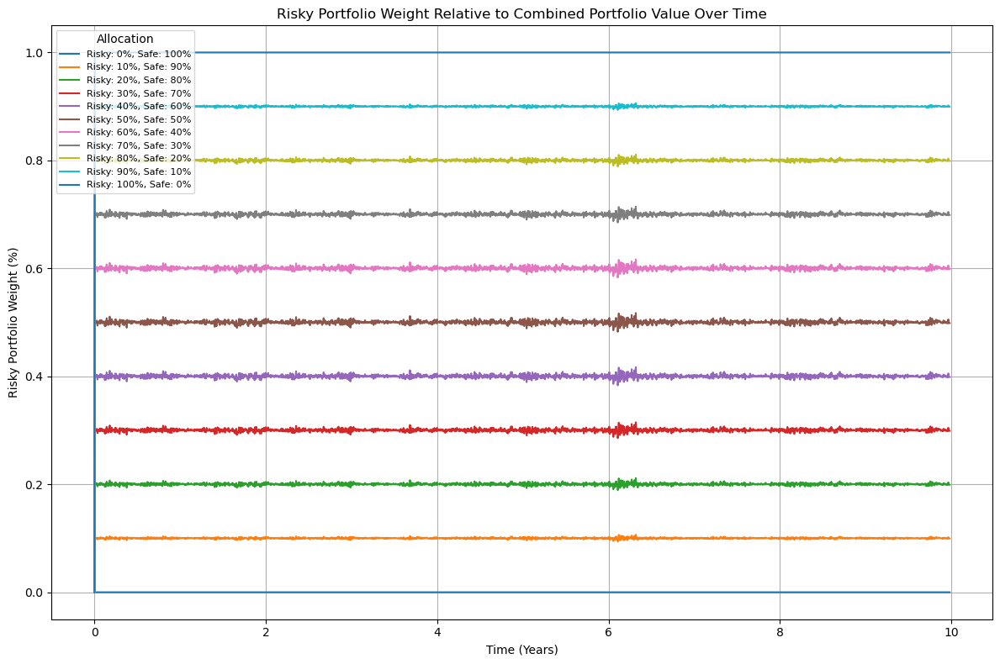

Final Portfolio Values for Different Allocations:
Risky: 0%, Safe: 100% -> Final Value: $355876.63
Risky: 10%, Safe: 90% -> Final Value: $446239.38
Risky: 20%, Safe: 80% -> Final Value: $557560.48
Risky: 30%, Safe: 70% -> Final Value: $694181.11
Risky: 40%, Safe: 60% -> Final Value: $861214.44
Risky: 50%, Safe: 50% -> Final Value: $1064653.87
Risky: 60%, Safe: 40% -> Final Value: $1311490.13
Risky: 70%, Safe: 30% -> Final Value: $1609836.80
Risky: 80%, Safe: 20% -> Final Value: $1969062.94
Risky: 90%, Safe: 10% -> Final Value: $2399931.77
Risky: 100%, Safe: 0% -> Final Value: $2914743.19


In [92]:
savings = 25000
essential = 20000
aspirational = 50000

savings_pv = []
essential_pv = []
aspirational_pv = []

for i in range(10, 30):
    savings_pv.append(savings / ((1 + yields_today[i])**i))
    essential_pv.append(essential / ((1 + yields_today[i])**i))
    aspirational_pv.append(aspirational / ((1 + yields_today[i])**i))
    
# Total value of savings
total_value = sum(savings_pv)

# Define weight range
weights = np.arange(0.0, 1.1, 0.1)
portfolio_results = {}
weight_tracking = {}

n_days = simulated_safe_ret_daily.shape[0]

# Reshape the returns data to avoid nested loops
simulated_risky_ret_daily_array = simulated_risky_ret_daily.values
simulated_safe_ret_daily_array = simulated_safe_ret_daily.values

# Loop through each weight allocation
for risky_percentage in weights:
    safe_percentage = 1 - risky_percentage
    
    # Initialize portfolio values
    risky_portfolio_value = np.zeros((n_simulations, n_days))
    safe_portfolio_value = np.zeros((n_simulations, n_days))
    risky_weight = np.zeros((n_simulations, n_days))
    
    # Initial investments (scalars)
    risky_initial_investment = total_value * risky_percentage
    safe_initial_investment = total_value * safe_percentage
    
    # Assign initial values
    risky_portfolio_value[:, 0] = risky_initial_investment
    safe_portfolio_value[:, 0] = safe_initial_investment
    
    # Compute portfolio growth across all simulations at once
    for t in range(1, n_days):
        risky_portfolio_value[:, t] = risky_portfolio_value[:, t-1] * (1 + simulated_risky_ret_daily_array[t])
        safe_portfolio_value[:, t] = safe_portfolio_value[:, t-1] * (1 + simulated_safe_ret_daily_array[t])
        
        # Total portfolio value
        combined_portfolio_value = risky_portfolio_value[:, t] + safe_portfolio_value[:, t]
        
        # Weighting of risky asset
        risky_weight[:, t] = risky_portfolio_value[:, t] / combined_portfolio_value
        
        # Rebalancing to maintain fixed allocation
        risky_portfolio_value[:, t] = combined_portfolio_value * risky_percentage
        safe_portfolio_value[:, t] = combined_portfolio_value * safe_percentage
    
    # Store results for each allocation
    portfolio_results[risky_percentage] = risky_portfolio_value + safe_portfolio_value
    weight_tracking[risky_percentage] = risky_weight

# Time years for plotting
time_years = np.arange(0, n_days) / 252

# Plot portfolio values over time for different allocations
plt.figure(figsize=(12, 8))
for risky_percentage, combined_portfolio_value in portfolio_results.items():
    plt.plot(time_years, combined_portfolio_value[0], label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

plt.title("Portfolio Value Over Time for Different Allocations")
plt.xlabel("Time (Years)")
plt.ylabel("Portfolio Value ($)")
plt.grid(True)
plt.legend(title="Allocation", loc="upper left", fontsize=8)
plt.tight_layout()
plt.show()

# Plot risky portfolio weight over time
plt.figure(figsize=(12, 8))
for risky_percentage, risky_weight in weight_tracking.items():
    plt.plot(time_years, risky_weight[0], label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

plt.title("Risky Portfolio Weight Relative to Combined Portfolio Value Over Time")
plt.xlabel("Time (Years)")
plt.ylabel("Risky Portfolio Weight (%)")
plt.grid(True)
plt.legend(title="Allocation", loc="upper left", fontsize=8)
plt.tight_layout()
plt.show()

# Print final portfolio values
print("Final Portfolio Values for Different Allocations:")
for risky_percentage, combined_portfolio_value in portfolio_results.items():
    print(f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}% -> Final Value: ${combined_portfolio_value[0, -1]:.2f}")

In [93]:
# Define fixed cash flows for different categories
savings_cashflows = 25000 * np.ones(20)  # 20 payments of 25,000 (savings)
essential_goals_cashflows = 20000 * np.ones(20)  # 20 payments of 20,000 (essential goals)
aspirational_goals_cashflows = 50000 * np.ones(20)  # 20 payments of 50,000 (aspirational goals)

num_cashflows = len(savings_cashflows)

num_simulations, num_days, num_maturities = P_t_T_all.shape  # Extract dimensions

# Define yearly maturities (original grid)
yearly_maturities = np.linspace(10, 30, num_maturities)  # Assuming maturities are equally spaced

# Pre-allocate PV array for savings, essential goals, and aspirational goals
savings_pv = np.zeros((num_simulations, num_days))
essential_goals_pv = np.zeros((num_simulations, num_days))
aspirational_goals_pv = np.zeros((num_simulations, num_days))

# Loop over each time step to interpolate and discount properly
for i in range(0, num_days):  
    # Compute decreasing daily maturities from 10 years minus i/252 (approx. daily step)
    daily_maturities = np.linspace(10 - i / 252, 30 - i / 252, num_cashflows)

    # Initialize arrays to store interpolated discount factors for each goal category
    interpolated_savings_discounts = np.zeros((num_simulations, num_cashflows))
    interpolated_essential_goals_discounts = np.zeros((num_simulations, num_cashflows))
    interpolated_aspirational_goals_discounts = np.zeros((num_simulations, num_cashflows))

    for sim in range(num_simulations):
        # Interpolation function for savings
        interpolator = interp1d(
            yearly_maturities,  # Original maturities
            P_t_T_all[sim, i, :],  # Discount factors for this sim & time
            kind='linear',  # Linear interpolation
            bounds_error=False,  # Avoid extrapolation
            fill_value="extrapolate"  # Optional: Prevents issues if extrapolation is needed
        )

        # Interpolate discount factors for each category of cash flow
        interpolated_savings_discounts[sim, :] = interpolator(daily_maturities)
        interpolated_essential_goals_discounts[sim, :] = interpolator(daily_maturities)
        interpolated_aspirational_goals_discounts[sim, :] = interpolator(daily_maturities)

    # Compute present values of cash flows for each category
    savings_pv[:, i] = np.sum(interpolated_savings_discounts * savings_cashflows, axis=1)
    essential_goals_pv[:, i] = np.sum(interpolated_essential_goals_discounts * essential_goals_cashflows, axis=1)
    aspirational_goals_pv[:, i] = np.sum(interpolated_aspirational_goals_discounts * aspirational_goals_cashflows, axis=1)

# Compute mean present values across simulations for each category
savings_pv_mean = savings_pv.mean(axis=0)
essential_goals_pv_mean = essential_goals_pv.mean(axis=0)
aspirational_goals_pv_mean = aspirational_goals_pv.mean(axis=0)

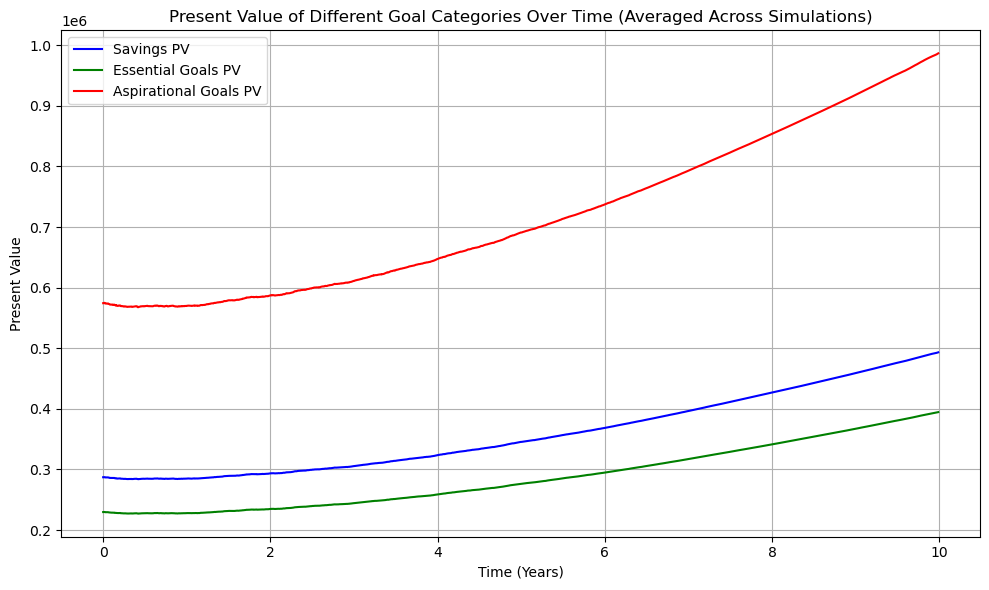

In [94]:
# Time axis in years
time_years = np.arange(num_days) / 252  # Convert days to years (assuming 252 trading days in a year)

# Plot results
plt.figure(figsize=(10, 6))
plt.plot(time_years, savings_pv_mean, label="Savings PV", color='blue')
plt.plot(time_years, essential_goals_pv_mean, label="Essential Goals PV", color='green')
plt.plot(time_years, aspirational_goals_pv_mean, label="Aspirational Goals PV", color='red')

plt.title("Present Value of Different Goal Categories Over Time (Averaged Across Simulations)")
plt.xlabel("Time (Years)")
plt.ylabel("Present Value")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

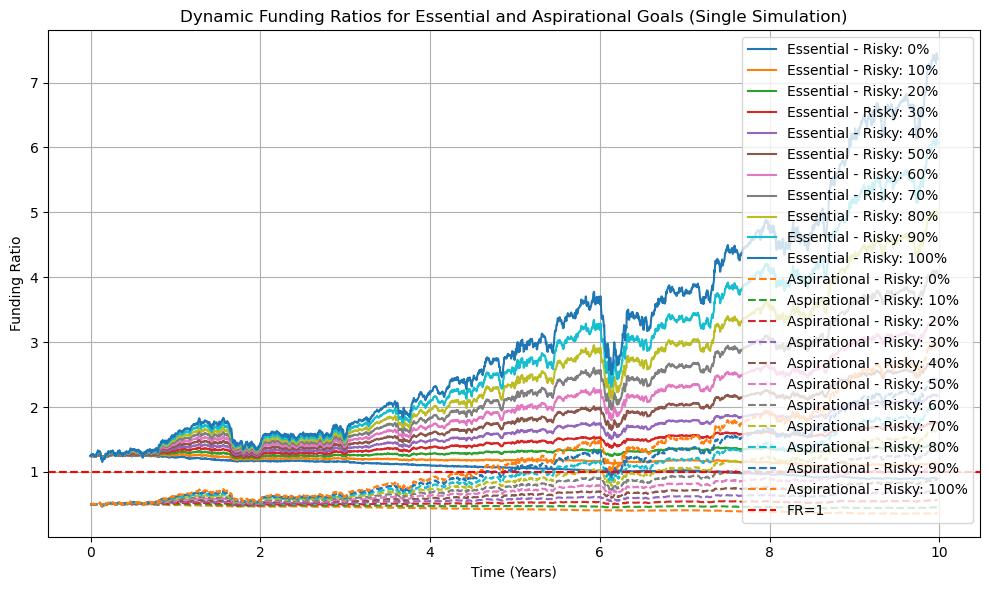

In [95]:
# Initialize dictionaries for funding ratios
funding_ratios_essential = {}
funding_ratios_aspirational = {}

funding_diff_essential = {}
funding_diff_aspirational = {}

# Ensure essential and aspirational PVs are 2D arrays
essential_pv = np.asarray(essential_goals_pv)  # Shape: (n_simulations, n_days)
aspirational_pv = np.asarray(aspirational_goals_pv)  # Shape: (n_simulations, n_days)

n_simulations, n_days = essential_pv.shape

# Compute funding ratios efficiently for each weight allocation
for risky_percentage in weights:
    # Extract and transpose portfolio values (Shape: (n_simulations, n_days))
    portfolio_value = portfolio_results[risky_percentage]

    # Ensure consistent length across arrays
    min_length = min(portfolio_value.shape[1], n_days)

    # Use NumPy broadcasting for efficient element-wise division
    funding_ratios_essential[risky_percentage] = portfolio_value[:, :min_length] / essential_pv[:, :min_length]
    funding_ratios_aspirational[risky_percentage] = portfolio_value[:, :min_length] / aspirational_pv[:, :min_length]

    funding_diff_essential[risky_percentage] = np.abs(portfolio_value[:, :min_length] - essential_pv[:, :min_length]) / essential_pv[:, :min_length]
    funding_diff_aspirational[risky_percentage] = np.abs(portfolio_value[:, :min_length] - aspirational_pv[:, :min_length]) / aspirational_pv[:, :min_length]

# Convert time to years
time_years = np.arange(min_length) / 252

# Choose a simulation index for visualization
simulation_index = 0  # Adjust index to view different simulations

# Plot funding ratios
plt.figure(figsize=(10, 6))

# Plot Essential Goal Funding Ratios
for risky_percentage, funding_ratio in funding_ratios_essential.items():
    plt.plot(time_years, funding_ratio[simulation_index, :], label=f"Essential - Risky: {risky_percentage*100:.0f}%")

# Plot Aspirational Goal Funding Ratios (Dashed Line Style)
for risky_percentage, funding_ratio in funding_ratios_aspirational.items():
    plt.plot(time_years, funding_ratio[simulation_index, :], linestyle='dashed', label=f"Aspirational - Risky: {risky_percentage*100:.0f}%")

# Formatting the plot
plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (Single Simulation)")
plt.xlabel("Time (Years)")
plt.ylabel("Funding Ratio")
plt.axhline(y=1, color='red', linestyle='--', label='FR=1')  # Reference line at FR=1
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

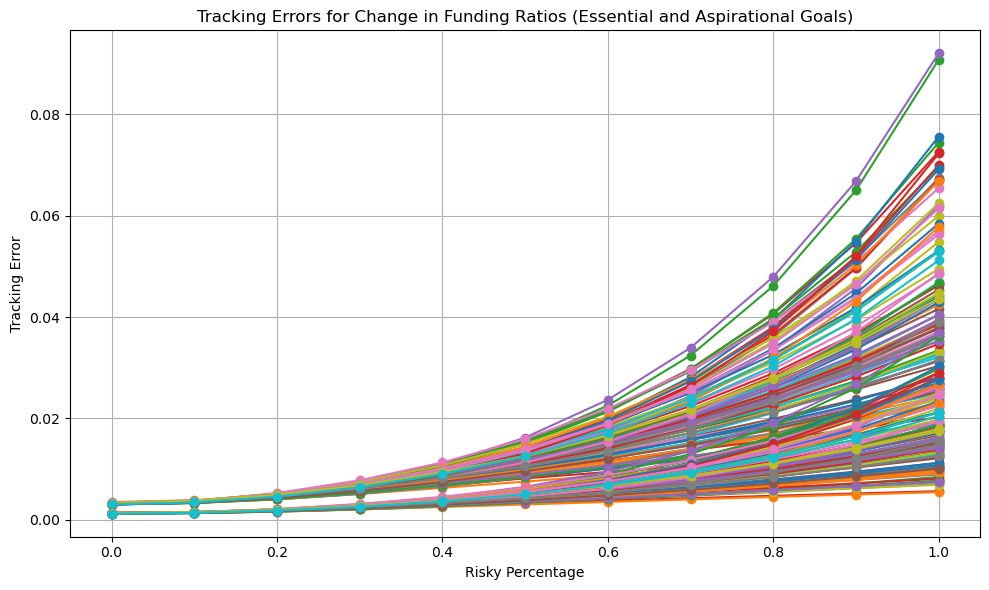

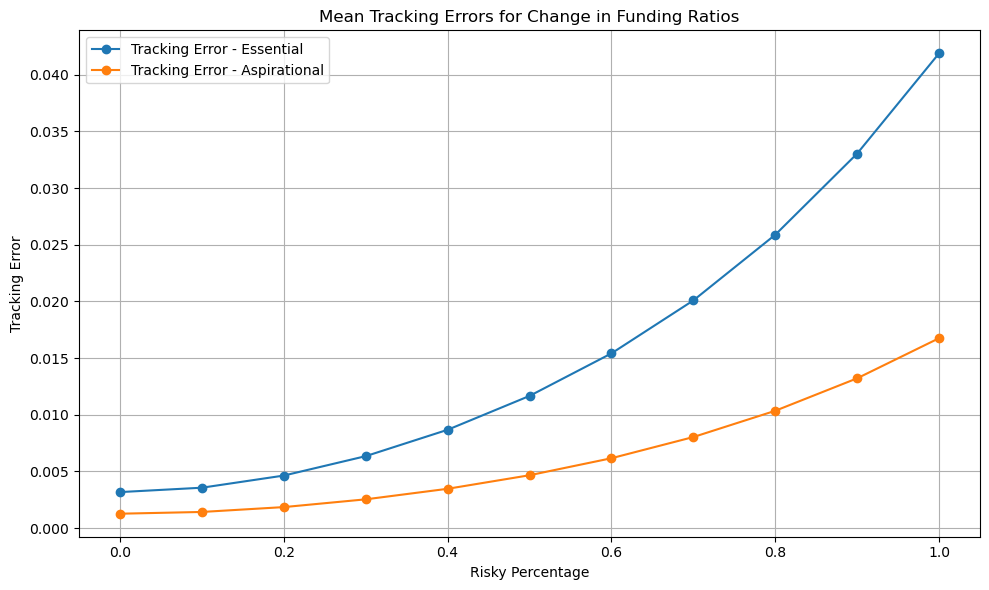

In [96]:
# Initialize dictionaries
tracking_errors_essential = {}
tracking_errors_aspirational = {}

# Compute tracking errors efficiently for each weight allocation
for risky_percentage in weights:
    # Compute funding ratio changes (returns)
    change_essential = np.diff(funding_ratios_essential[risky_percentage], axis=1)  # Shape (n_simulations, n_days - 1)
    change_aspirational = np.diff(funding_ratios_aspirational[risky_percentage], axis=1)
    
    # Compute tracking errors (std dev of changes)
    tracking_errors_essential[risky_percentage] = np.nanstd(change_essential, axis=1)  # Shape (n_simulations,)
    tracking_errors_aspirational[risky_percentage] = np.nanstd(change_aspirational, axis=1)

# Convert to lists for plotting
risk_levels = list(tracking_errors_essential.keys())

# Compute mean tracking errors for visualization
mean_te_essential = [np.mean(te) for te in tracking_errors_essential.values()]
mean_te_aspirational = [np.mean(te) for te in tracking_errors_aspirational.values()]

# Plot tracking errors
plt.figure(figsize=(10, 6))
plt.plot(list(tracking_errors_essential.keys()), [te for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
plt.plot(list(tracking_errors_aspirational.keys()), [te for te in tracking_errors_aspirational.values()], label="Tracking Error - Aspirational", marker='o')
plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot individual tracking errors per risky percentage
plt.figure(figsize=(10, 6))
plt.plot(risk_levels, mean_te_essential, label="Tracking Error - Essential", marker='o')
plt.plot(risk_levels, mean_te_aspirational, label="Tracking Error - Aspirational", marker='o')
plt.title("Mean Tracking Errors for Change in Funding Ratios")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

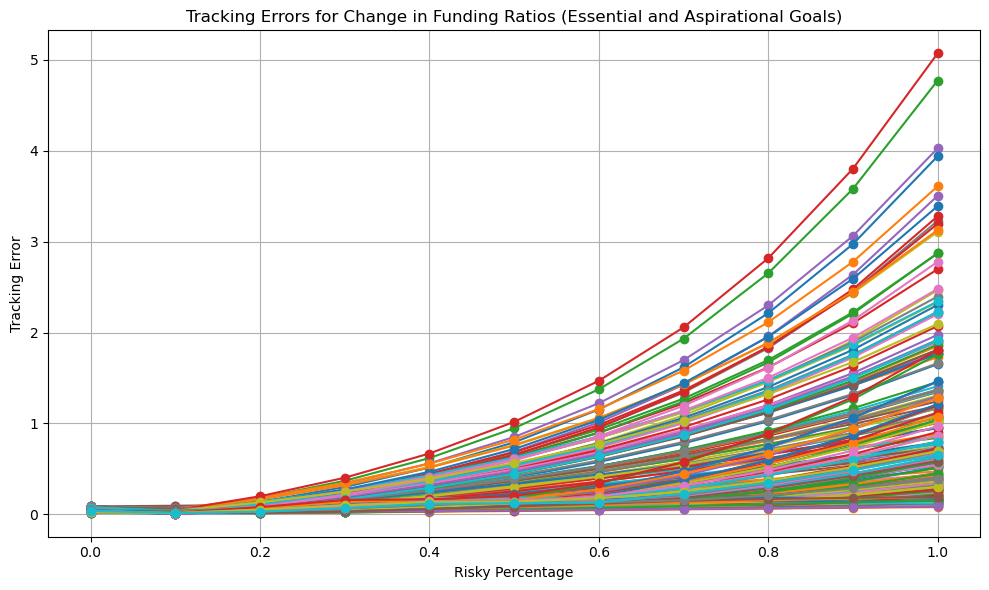

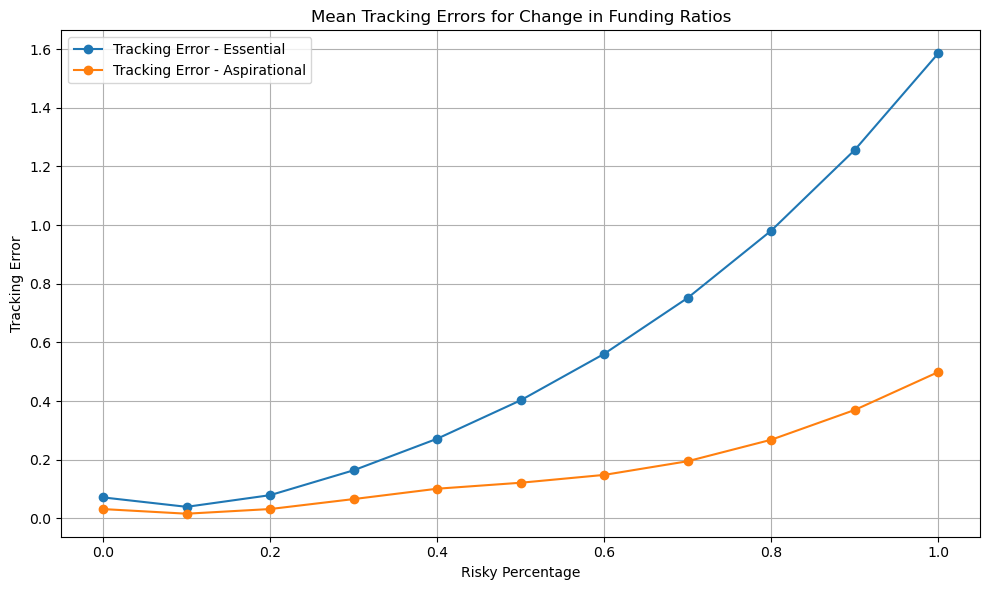

In [97]:
# Initialize dictionaries
tracking_errors_essential = {}
tracking_errors_aspirational = {}

# Compute tracking errors efficiently for each weight allocation
for risky_percentage in weights:
    
    change_essential = funding_diff_essential[risky_percentage]  # Shape (n_simulations, n_days - 1)
    change_aspirational = funding_diff_aspirational[risky_percentage]
    
    # Compute tracking errors (std dev of changes)
    tracking_errors_essential[risky_percentage] = np.nanstd(change_essential, axis=1)  # Shape (n_simulations,)
    tracking_errors_aspirational[risky_percentage] = np.nanstd(change_aspirational, axis=1)

# Convert to lists for plotting
risk_levels = list(tracking_errors_essential.keys())

# Compute mean tracking errors for visualization
mean_te_essential = [np.mean(te) for te in tracking_errors_essential.values()]
mean_te_aspirational = [np.mean(te) for te in tracking_errors_aspirational.values()]

# Plot tracking errors
plt.figure(figsize=(10, 6))
plt.plot(list(tracking_errors_essential.keys()), [te for te in tracking_errors_essential.values()], label="Tracking Error - Essential", marker='o')
plt.plot(list(tracking_errors_aspirational.keys()), [te for te in tracking_errors_aspirational.values()], label="Tracking Error - Aspirational", marker='o')
plt.title("Tracking Errors for Change in Funding Ratios (Essential and Aspirational Goals)")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot individual tracking errors per risky percentage
plt.figure(figsize=(10, 6))
plt.plot(risk_levels, mean_te_essential, label="Tracking Error - Essential", marker='o')
plt.plot(risk_levels, mean_te_aspirational, label="Tracking Error - Aspirational", marker='o')
plt.title("Mean Tracking Errors for Change in Funding Ratios")
plt.xlabel("Risky Percentage")
plt.ylabel("Tracking Error")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Old versions

In [99]:
# # Ensure total_value is a scalar
# total_value = np.sum(savings_pv)  

# # Define weight range
# weights = np.arange(0.0, 1.1, 0.1)
# portfolio_results = {}
# weight_tracking = {}

# n_days = simulated_safe_ret_daily.shape[0]

# # Loop through each simulation
# for sim in range(n_simulations):  
#     # Loop through each weight allocation
#     for risky_percentage in weights:
#         safe_percentage = 1 - risky_percentage
        
#         # Initialize portfolio values
#         risky_portfolio_value = np.zeros(n_days)
#         safe_portfolio_value = np.zeros(n_days)
#         risky_weight = np.zeros(n_days)
        
#         # Initial investments (scalars)
#         risky_initial_investment = total_value * risky_percentage
#         safe_initial_investment = total_value * safe_percentage
        
#         # Assign first values correctly
#         risky_portfolio_value[0] = risky_initial_investment  
#         safe_portfolio_value[0] = safe_initial_investment  
        
#         for t in range(1, n_days):
#             # Compute portfolio growth
#             risky_portfolio_value[t] = risky_portfolio_value[t-1] * (1 + simulated_risky_ret_daily.iloc[t, sim])
#             safe_portfolio_value[t] = safe_portfolio_value[t-1] * (1 + simulated_safe_ret_daily.iloc[t, sim])
            
#             # Total portfolio value
#             combined_portfolio_value = risky_portfolio_value[t] + safe_portfolio_value[t]
            
#             # Weighting of risky asset
#             risky_weight[t] = risky_portfolio_value[t] / combined_portfolio_value
            
#             # Rebalancing to maintain fixed allocation
#             risky_portfolio_value[t] = combined_portfolio_value * risky_percentage
#             safe_portfolio_value[t] = combined_portfolio_value * safe_percentage
        
#         # Store results uniquely for each simulation and allocation
#         portfolio_results[(sim, risky_percentage)] = risky_portfolio_value + safe_portfolio_value
#         weight_tracking[(sim, risky_percentage)] = risky_weight

# time_years = np.arange(0, n_days) / 252

# # Plot portfolio values over time for different allocations
# plt.figure(figsize=(12, 8))
# for (sim, risky_percentage), combined_portfolio_value in portfolio_results.items():
#     if sim == 0:  # Plot only one simulation for clarity
#         plt.plot(time_years, combined_portfolio_value, label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

# plt.title("Portfolio Value Over Time for Different Allocations")
# plt.xlabel("Time (Years)")
# plt.ylabel("Portfolio Value ($)")
# plt.grid(True)
# plt.legend(title="Allocation", loc="upper left", fontsize=8)
# plt.tight_layout()
# plt.show()

# # Plot risky portfolio weight over time
# plt.figure(figsize=(12, 8))
# for (sim, risky_percentage), risky_weight in weight_tracking.items():
#     if sim == 0:  # Plot only one simulation for clarity
#         plt.plot(time_years, risky_weight, label=f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}%")

# plt.title("Risky Portfolio Weight Relative to Combined Portfolio Value Over Time")
# plt.xlabel("Time (Years)")
# plt.ylabel("Risky Portfolio Weight (%)")
# plt.grid(True)
# plt.legend(title="Allocation", loc="upper left", fontsize=8)
# plt.tight_layout()
# plt.show()

# # Print final portfolio values
# print("Final Portfolio Values for Different Allocations:")
# for (sim, risky_percentage), combined_portfolio_value in portfolio_results.items():
#     if sim == 0:  # Print only for one simulation
#         print(f"Risky: {risky_percentage*100:.0f}%, Safe: {(1-risky_percentage)*100:.0f}% -> Final Value: ${combined_portfolio_value[-1]:.2f}")


In [100]:
# funding_ratio_essential = []
# funding_ratio_aspirational = []

# # Iterate through all simulated paths in portfolio_results
# for key, portfolio_value in portfolio_results.items():  # key = (sim, risky_percentage)
#     min_length = min(len(portfolio_value), len(essential_pv), len(aspirational_pv))  # Align lengths
    
#     essential_ratio = np.array([portfolio_value[i] / essential_pv[i] for i in range(min_length)])
#     aspirational_ratio = np.array([portfolio_value[i] / aspirational_pv[i] for i in range(min_length)])
    
#     funding_ratio_essential.append(essential_ratio)
#     funding_ratio_aspirational.append(aspirational_ratio)

# # Convert lists to numpy arrays (each row is a path, columns are time steps)
# funding_ratio_essential = np.array(funding_ratio_essential)
# funding_ratio_aspirational = np.array(funding_ratio_aspirational)

# # Choose the simulation number
# sim_number = 2  # Change this to select a different simulation (e.g., 0, 1, 3, etc.)

# # Error handling for valid simulation selection
# num_simulations = funding_ratio_essential.shape[0]
# if sim_number >= num_simulations or sim_number < 0:
#     raise ValueError(f"Invalid simulation number. Choose between 0 and {num_simulations - 1}.")

# # Define time array
# time_years = np.arange(funding_ratio_essential[:10, sim_number, :].shape[0]) / 252  # Time steps match second dimension

# # Plot the selected simulation
# plt.figure(figsize=(10, 6))
# plt.plot(time_years, funding_ratio_essential[:10, sim_number, :], color='blue', label=f"Essential (Sim {sim_number})")
# plt.plot(time_years, funding_ratio_aspirational[:10, sim_number, :], color='red', label=f"Aspirational (Sim {sim_number})")

# plt.title(f"Dynamic Funding Ratios for Essential and Aspirational Goals (Simulation {sim_number})")
# plt.xlabel("Time (Years)")
# plt.ylabel("Funding Ratio")
# plt.grid(True)
# plt.legend()
# plt.tight_layout()
# plt.show()

In [101]:
# funding_ratios_essential = {}
# funding_ratios_aspirational = {}

# # Convert essential and aspirational PVs to 2D arrays if they are not already
# essential_pv = np.array(essential_pv)  # Shape (n_simulations, time)
# aspirational_pv = np.array(aspirational_pv)  # Shape (n_simulations, time)

# # Ensure the shape consistency
# n_simulations, n_days = essential_pv.shape

# # Loop through each weight allocation
# for risky_percentage in weights:
    
#     # Extract portfolio values for all simulations
#     portfolio_value = np.array(portfolio_results[risky_percentage])  # Shape (n_days, n_simulations)
#     portfolio_value = portfolio_value.T  # Now shape (n_simulations, n_days)
    
#     # Ensure the min length across all arrays
#     min_length = min(portfolio_value.shape[1], n_days)

#     # Compute funding ratios for all simulations at once
#     funding_ratio_essential = portfolio_value[:, :min_length] / essential_pv[:, :min_length]
#     funding_ratio_aspirational = portfolio_value[:, :min_length] / aspirational_pv[:, :min_length]

#     # Store in dictionary
#     funding_ratios_essential[risky_percentage] = funding_ratio_essential
#     funding_ratios_aspirational[risky_percentage] = funding_ratio_aspirational

# # Time in years
# time_years = np.arange(0, min_length) / 252

# # Select a specific simulation to plot
# simulation_index = 5  # Change this index to visualize different simulations

# # Plot funding ratios
# plt.figure(figsize=(10, 6))

# for risky_percentage, funding_ratio in funding_ratios_essential.items():
#     plt.plot(time_years, funding_ratio[simulation_index, :], label=f"Essential - Risky: {risky_percentage*100:.0f}%")

# for risky_percentage, funding_ratio in funding_ratios_aspirational.items():
#     plt.plot(time_years, funding_ratio[simulation_index, :], linestyle='dashed', label=f"Aspirational - Risky: {risky_percentage*100:.0f}%")

# plt.title("Dynamic Funding Ratios for Essential and Aspirational Goals (Single Simulation)")
# plt.xlabel("Time (Years)")
# plt.ylabel("Funding Ratio")
# plt.grid(True)
# plt.axhline(y=1, color='red', linestyle='--', label='FR=1')
# plt.legend()
# plt.tight_layout()
# plt.show()

#### Stop